**Course Description**

This ggplot2 course builds on your knowledge from the introductory course to produce meaningful explanatory plots. Statistics will be calculated on the fly and you’ll see how Coordinates and Facets aid in communication. You’ll also explore details of data visualization best practices with ggplot2 to help make sure you have a sound understanding of what works and why. By the end of the course, you’ll have all the tools needed to make a custom plotting function to explore a large data set, combining statistics and excellent visuals.

# Statistics

A picture paints a thousand words, which is why R ggplot2 is such a powerful tool for graphical data analysis. In this chapter, you’ll progress from simply plotting data to applying a variety of statistical methods. These include a variety of linear models, descriptive and inferential statistics (mean, standard deviation and confidence intervals) and custom functions.

## Stats with geoms

### Smoothing

To practice on the remaining layers (statistics, coordinates and
facets), we'll continue working on several datasets from the first
course.

The `mtcars` dataset contains information for 32 cars from Motor Trends
magazine from 1974. This dataset is small, intuitive, and contains a
variety of continuous and categorical (both nominal and ordinal)
variables.

In the previous course you learned how to effectively use some basic
geometries, such as point, bar and line. In the first chapter of this
course you'll explore statistics associated with specific geoms, for
example, smoothing and lines.

-   Look at the structure of `mtcars`.
-   Using `mtcars`, draw a scatter plot of `mpg` vs. `wt`.

Update the plot to add a smooth trend line. Use the default method,
which uses the LOESS model to fit the curve.

Update the smooth layer. Apply a linear model by setting `method` to
`"lm"`, and turn off the model's 95% confidence interval (the ribbon) by
setting `se` to `FALSE`.

Draw the same plot again, swapping `geom_smooth()` for `stat_smooth()`.


── Attaching core tidyverse packages ─────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.0     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.1     ✔ tibble    3.1.8
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ───────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


'data.frame':	32 obs. of  11 variables:
 $ mpg : num  21 21 22.8 21.4 18.7 18.1 14.3 24.4 22.8 19.2 ...
 $ cyl : num  6 6 4 6 8 6 8 4 4 6 ...
 $ disp: num  160 160 108 258 360 ...
 $ hp  : num  110 110 93 110 175 105 245 62 95 123 ...
 $ drat: num  3.9 3.9 3.85 3.08 3.15 2.76 3.21 3.69 3.92 3.92 ...
 $ wt  : num  2.62 2.88 2.32 3.21 3.44 ...
 $ qsec: num  16.5 17 18.6 19.4 17 ...
 $ vs  : num  0 0 1 1 0 1 0 1 1 1 ...
 $ am  : num  1 1 1 0 0 0 0 0 0 0 ...
 $ gear: num  4 4 4 3 3 3 3 4 4 4 ...
 $ carb: num  4 4 1 1 2 1 4 2 2 4 ...


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


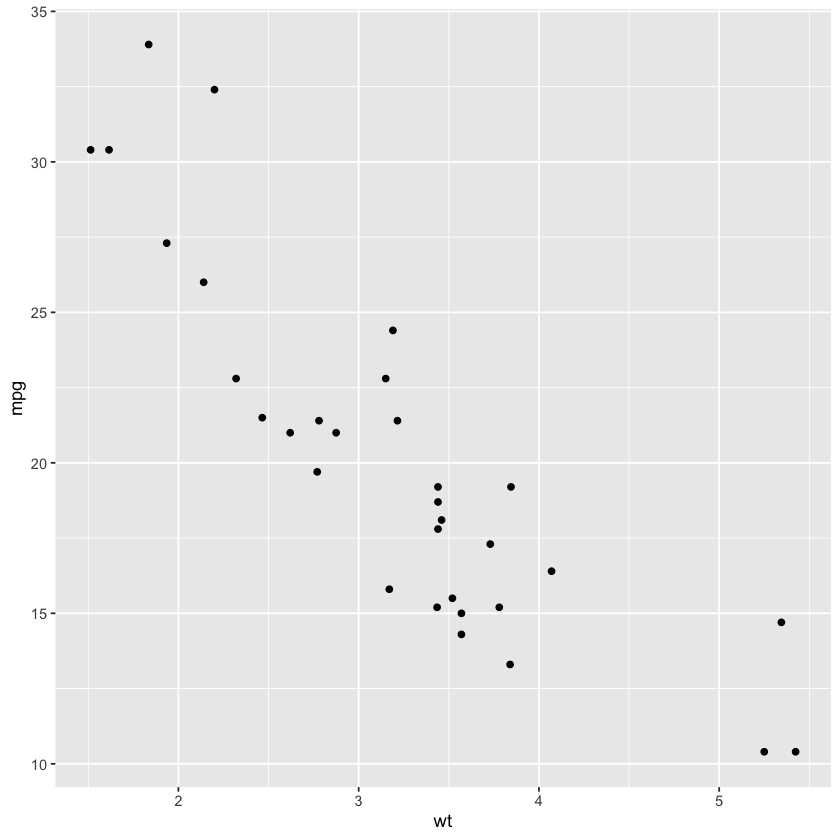

`geom_smooth()` using formula = 'y ~ x'


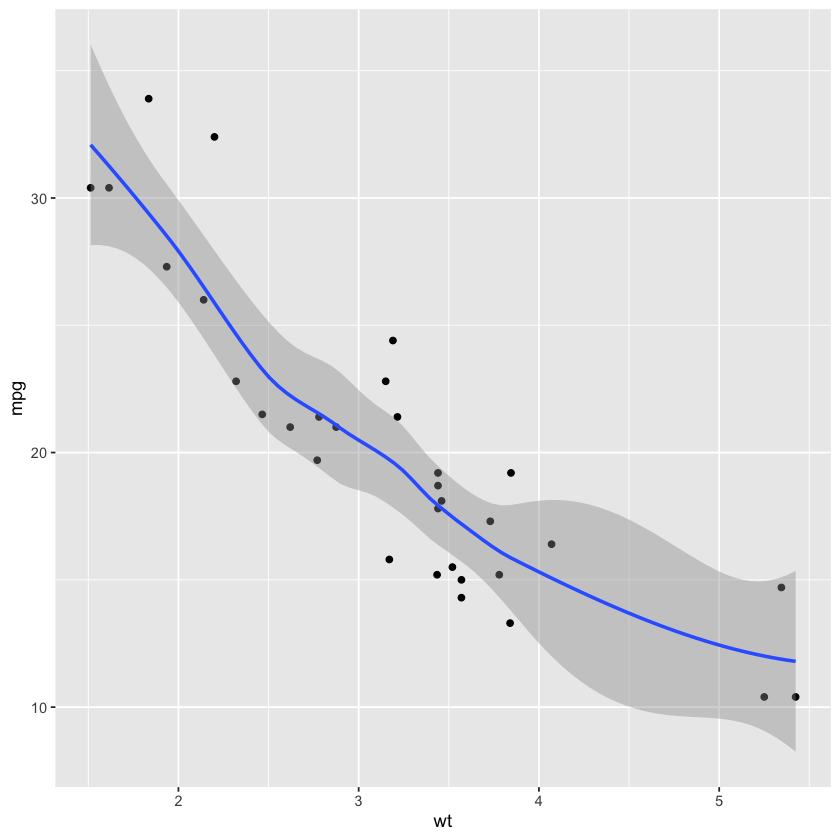

`geom_smooth()` using formula = 'y ~ x'


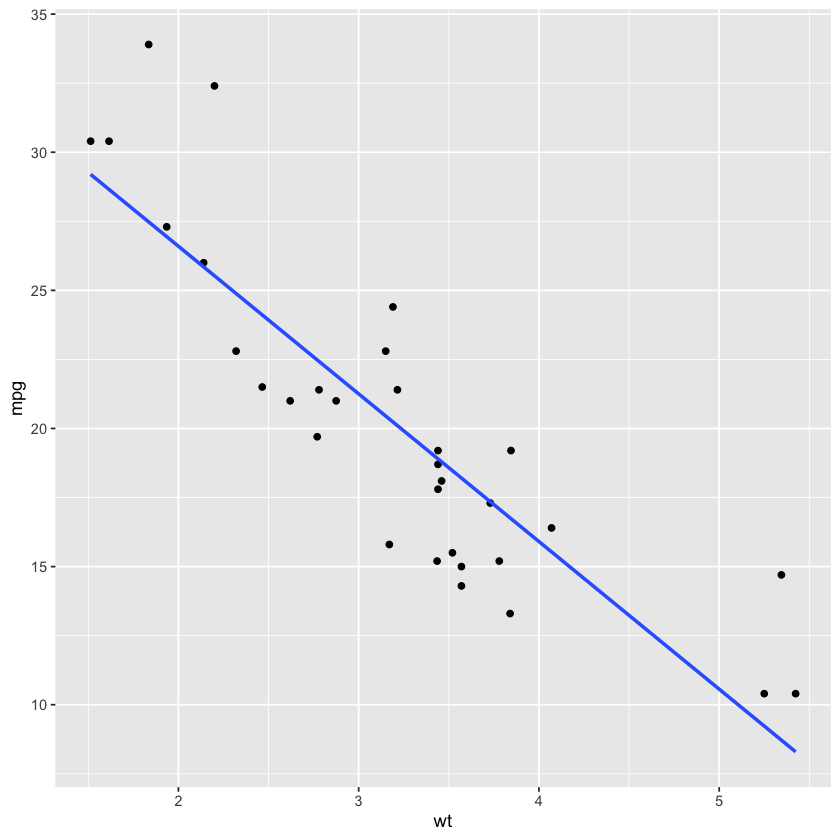

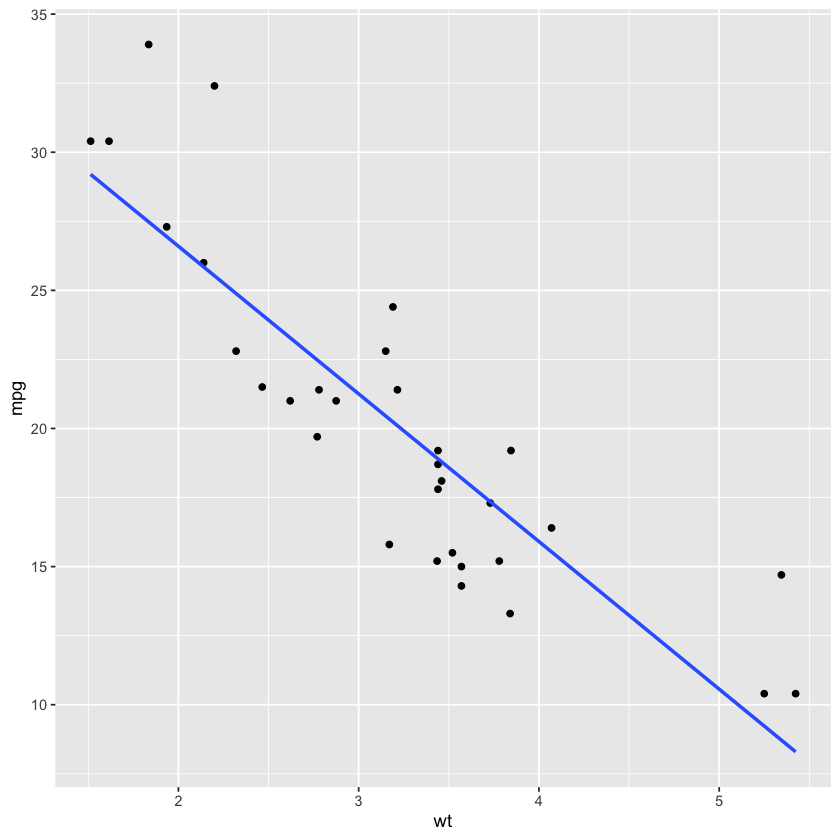

In [3]:
# edited/added
library(tidyverse)

# View the structure of mtcars
str(mtcars)

# Using mtcars, draw a scatter plot of mpg vs. wt
ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point()

# Amend the plot to add a smooth layer
ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point() +
  geom_smooth()

# Amend the plot. Use lin. reg. smoothing; turn off std err ribbon
ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE)

# Amend the plot. Swap geom_smooth() for stat_smooth().
ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point() +
  stat_smooth(method = "lm", se = FALSE)


### Grouping variables

We'll continue with the previous exercise by considering the situation
of looking at sub-groups in our dataset. For this we'll encounter the
invisible `group` aesthetic.

`mtcars` has been given an extra column, `fcyl`, that is the `cyl`
column converted to a proper factor variable.

-   Using `mtcars`, plot `mpg` vs. `wt`, colored by `fcyl`.
-   Add a point layer.
-   Add a smooth stat using a linear model, and don't show the `se`
    ribbon.

<!-- -->

-   Update the plot to add a second smooth stat.
    -   Add a dummy `group` aesthetic to this layer, setting the value
        to `1`.
    -   Use the same `method` and `se` values as the first stat smooth
        layer.


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: colour
ℹ This can happen when ggplot fails to infer the correct grouping structure in the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical variable into a factor?”


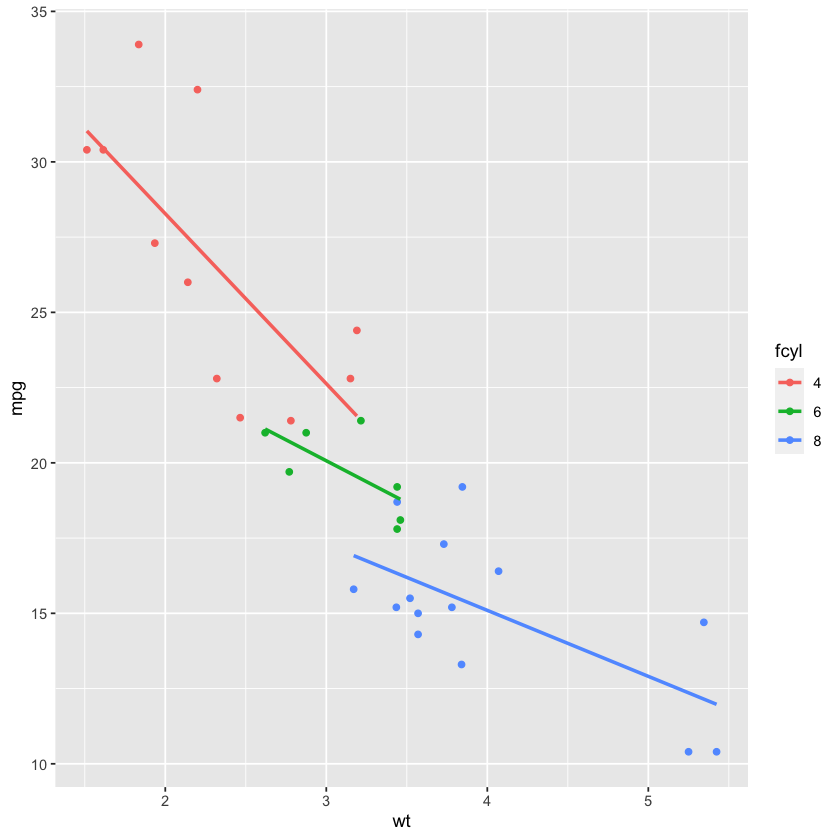

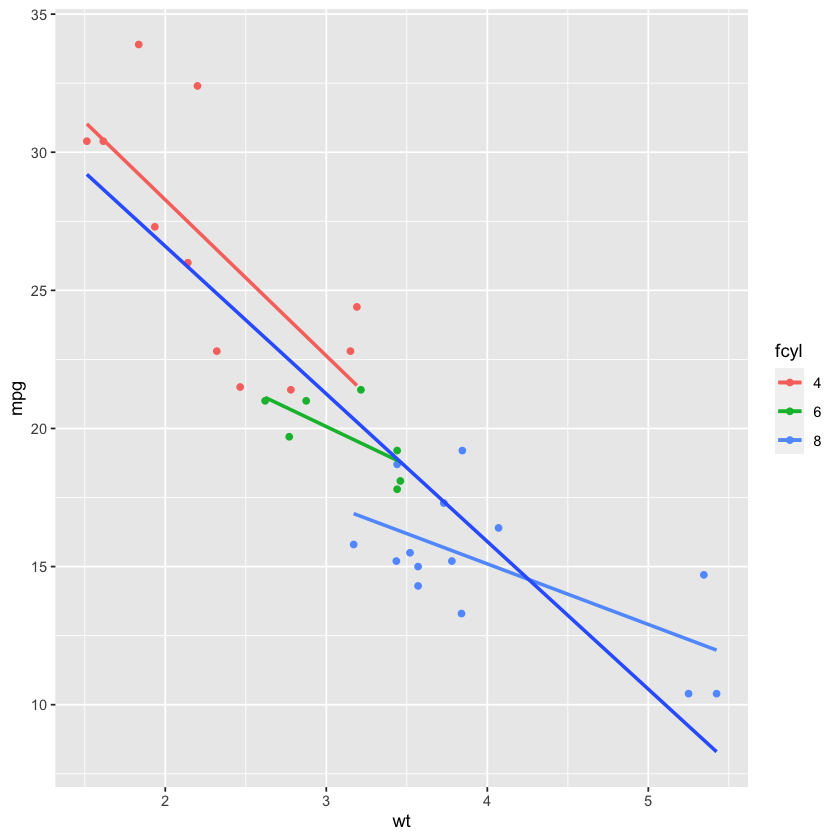

In [4]:
# edited/added
mtcars <- mtcars %>% 
  mutate(fcyl = as.factor(cyl),
         fam = as.factor(am))

# Using mtcars, plot mpg vs. wt, colored by fcyl
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl)) +
  # Add a point layer
  geom_point() +
  # Add a smooth lin. reg. stat, no ribbon
  stat_smooth(method = "lm", se = FALSE)

# Amend the plot to add another smooth layer with dummy grouping
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl)) +
  geom_point() +
  stat_smooth(method = "lm", se = FALSE) +
  stat_smooth(aes(group = 1), method = "lm", se = FALSE)


### Modifying stat_smooth

In the previous exercise we used `se = FALSE` in `stat_smooth()` to
remove the 95% Confidence Interval. Here we'll consider another
argument, `span`, used in LOESS smoothing, and we'll take a look at a
nice scenario of properly mapping different models.

Explore the effect of the `span` argument on LOESS curves. Add three
smooth LOESS stats, each without the standard error ribbon.

-   Color the 1st one `"red"`; set its `span` to `0.9`.
-   Color the 2nd one `"green"`; set its `span` to `0.6`.
-   Color the 3rd one `"blue"`; set its `span` to `0.3`.

Compare LOESS and linear regression smoothing on small regions of data.

-   Add a smooth LOESS stat, without the standard error ribbon.
-   Add a smooth linear regression stat, again without the standard
    error ribbon.

LOESS isn't great on very short sections of data; compare the pieces of
linear regression to LOESS over the whole thing.

-   Amend the smooth LOESS stat to map `color` to a dummy variable,
    `"All"`.


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


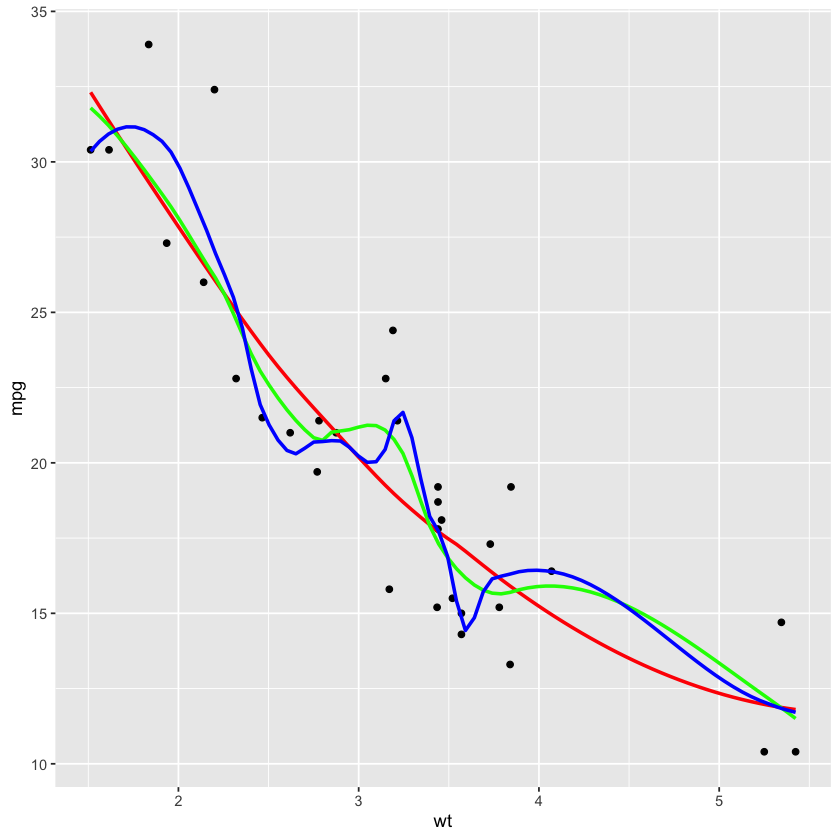

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


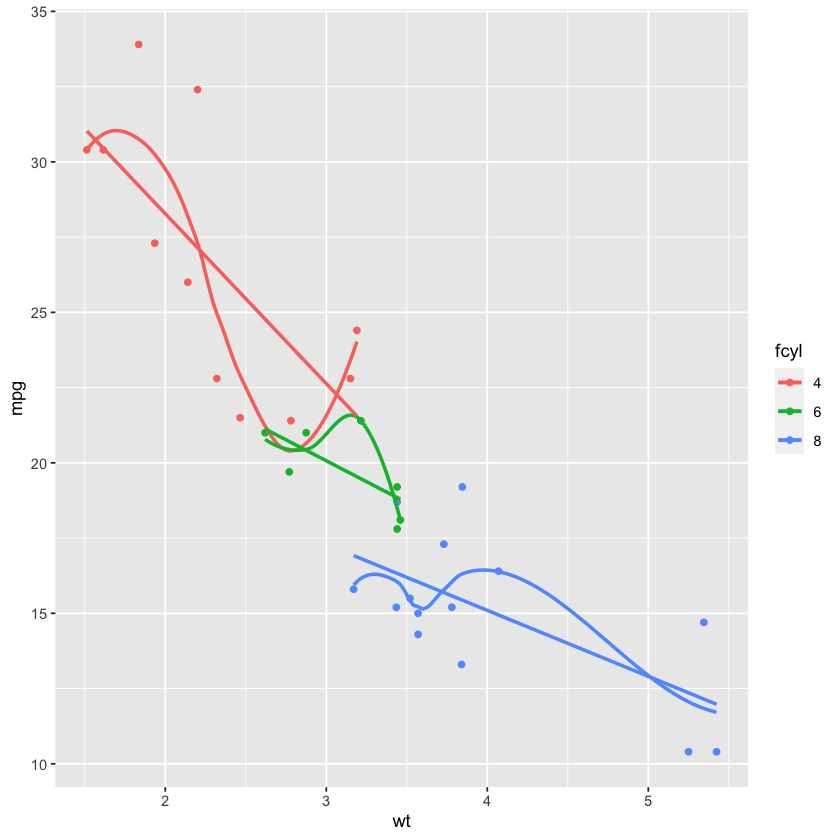

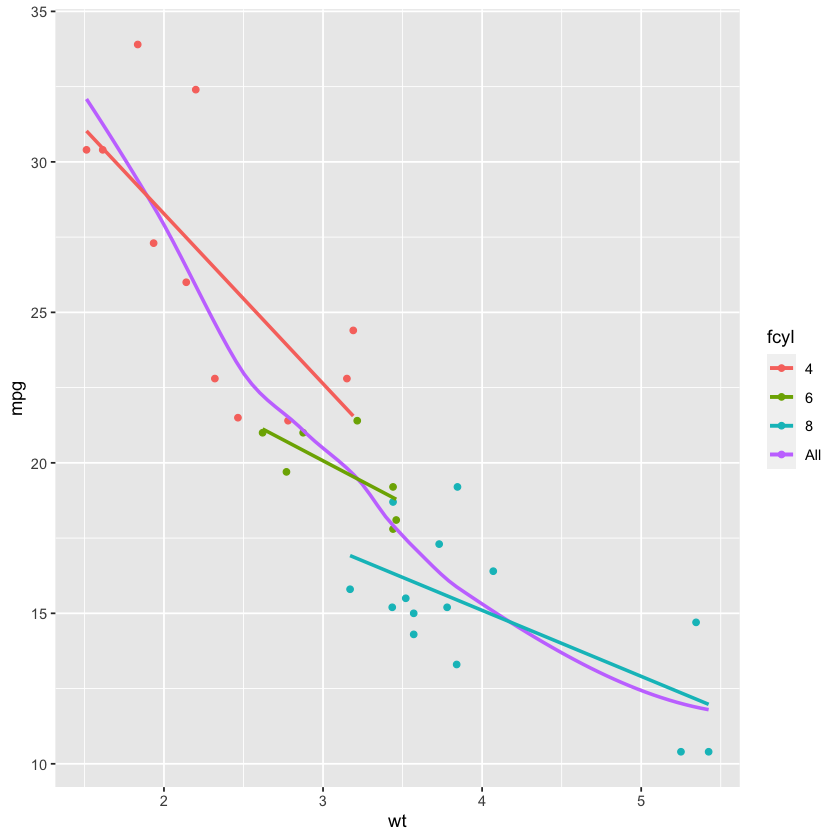

In [5]:
ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point() +
  # Add 3 smooth LOESS stats, varying span & color
  stat_smooth(se = FALSE, color = "red", span = 0.9) +
  stat_smooth(se = FALSE, color = "green", span = 0.6) +
  stat_smooth(se = FALSE, color = "blue", span = 0.3)

# Amend the plot to color by fcyl
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl)) +
  geom_point() +
  # Add a smooth LOESS stat, no ribbon
  stat_smooth(se = FALSE) +
  # Add a smooth lin. reg. stat, no ribbon
  stat_smooth(method = "lm", se = FALSE)

# Amend the plot
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl)) +
  geom_point() +
  # Map color to dummy variable "All"
  stat_smooth(aes(color = "All"), se = FALSE) +
  stat_smooth(method = "lm", se = FALSE)


### Modifying stat_smooth (2)

In this exercise we'll take a look at the standard error ribbons, which
show the 95% confidence interval of smoothing models. `ggplot2` and the
`Vocab` data frame are already loaded for you.

`Vocab` has been given an extra column, `year_group`, splitting the
dates into before and after 1995.

-   Using `Vocab`, plot `vocabulary` vs. `education`, colored by
    `year_group`.
-   Use `geom_jitter()` to add jittered points with transparency `0.25`.
-   Add a smooth linear regression stat (with the standard error
    ribbon).

It's easier to read the plot if the standard error ribbons match the
lines, and the lines have more emphasis.

-   Update the smooth stat.
    -   Map the fill color to `year_group`.
    -   Set the line size to `2`.


`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
`geom_smooth()` using formula = 'y ~ x'


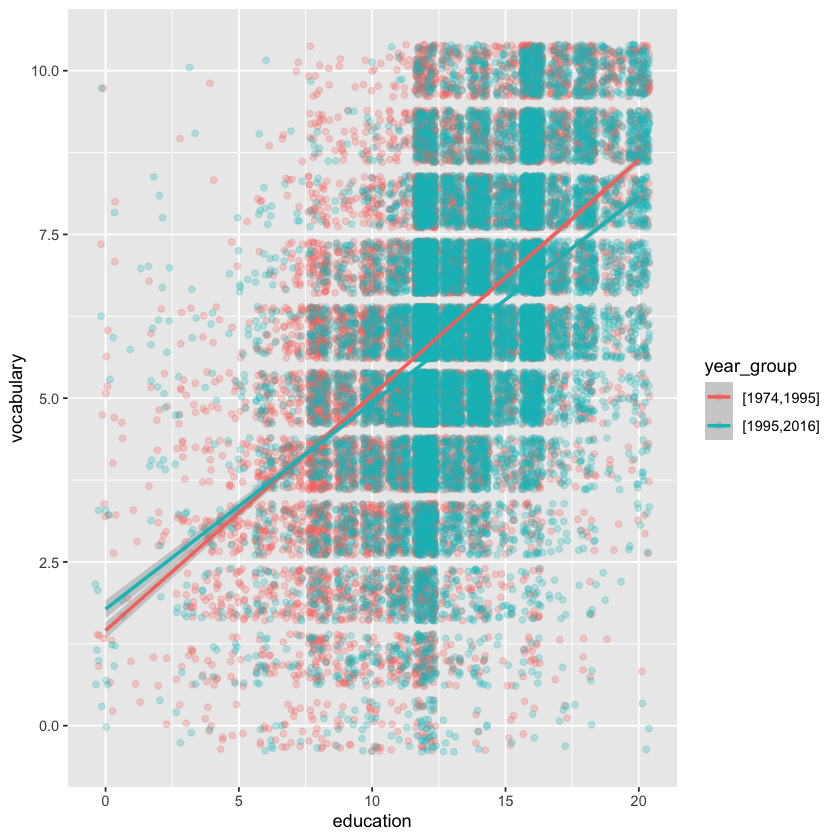

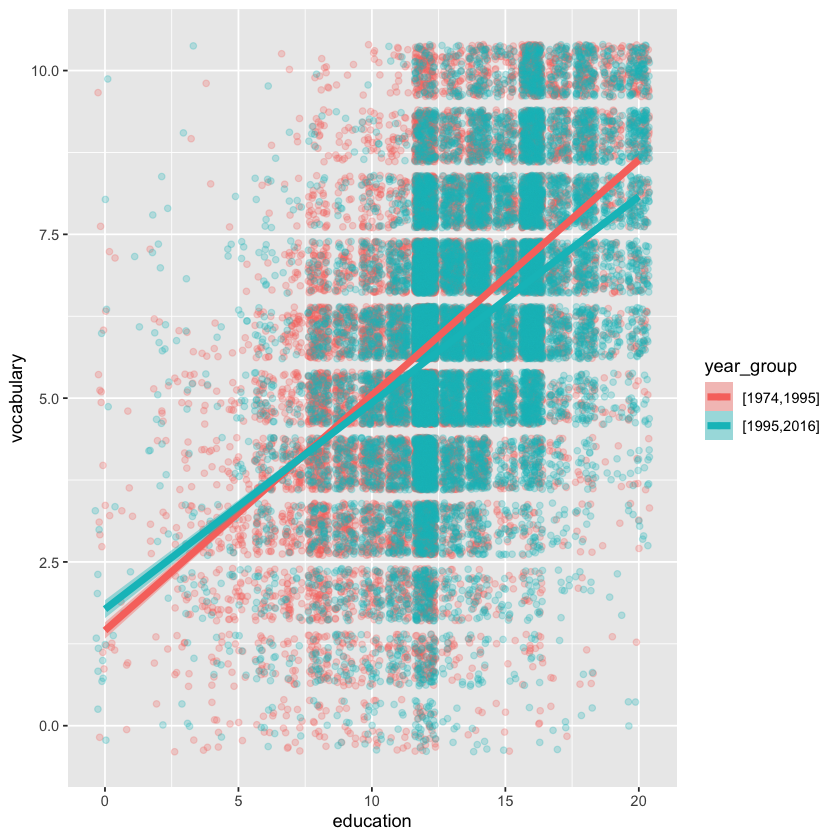

In [6]:
# edited/added
library(carData)
Vocab <- Vocab %>% 
  mutate(year_group = as.factor(ifelse(year<1995, "[1974,1995]", "[1995,2016]") ))

# Plot vocabulary vs. education, colored by year_group
ggplot(Vocab, aes(x = education, y = vocabulary, color = year_group)) +
  # Add jittered points with transparency 0.25
  geom_jitter(alpha = 0.25) +
  # Add a smooth lin. reg. line (with ribbon)
  stat_smooth(method = "lm")

# Amend the plot
ggplot(Vocab, aes(x = education, y = vocabulary, color = year_group)) +
  geom_jitter(alpha = 0.25) +
  # Map the fill color to year_group, set the line size to 2
  stat_smooth(aes(fill = year_group), method = "lm", size = 2)


## Stats: sum and quantile

### Quantiles

Here, we'll continue with the `Vocab` dataset and use `stat_quantile()`
to apply a quantile regression.

Linear regression predicts the mean response from the explanatory
variables, quantile regression predicts a quantile response (e.g. the
median) from the explanatory variables. Specific quantiles can be
specified with the `quantiles` argument.

Specifying many quantiles *and* color your models according to year can
make plots too busy. We'll explore ways of dealing with this in the next
chapter.

-   Update the plot to add a quantile regression stat, at `quantiles`
    `0.05`, `0.5`, and `0.95`.

<!-- -->

-   Amend the plot to color according to `year_group`.


Smoothing formula not specified. Using: y ~ x
Smoothing formula not specified. Using: y ~ x
Smoothing formula not specified. Using: y ~ x
Warning message in rq.fit.br(wx, wy, tau = tau, ...):
“Solution may be nonunique”
Warning message in rq.fit.br(wx, wy, tau = tau, ...):
“Solution may be nonunique”


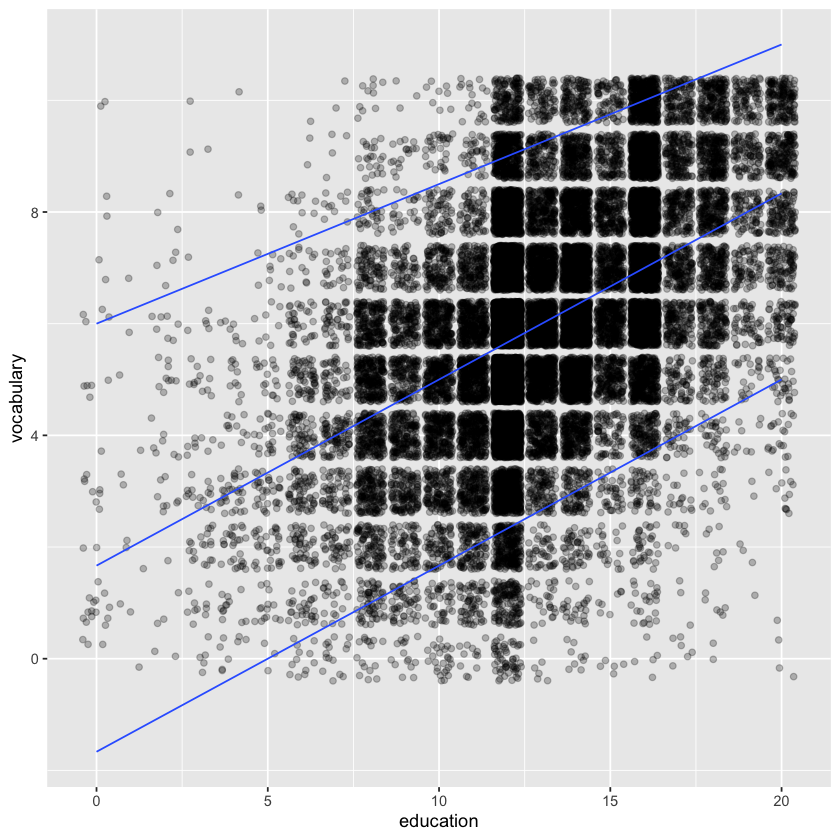

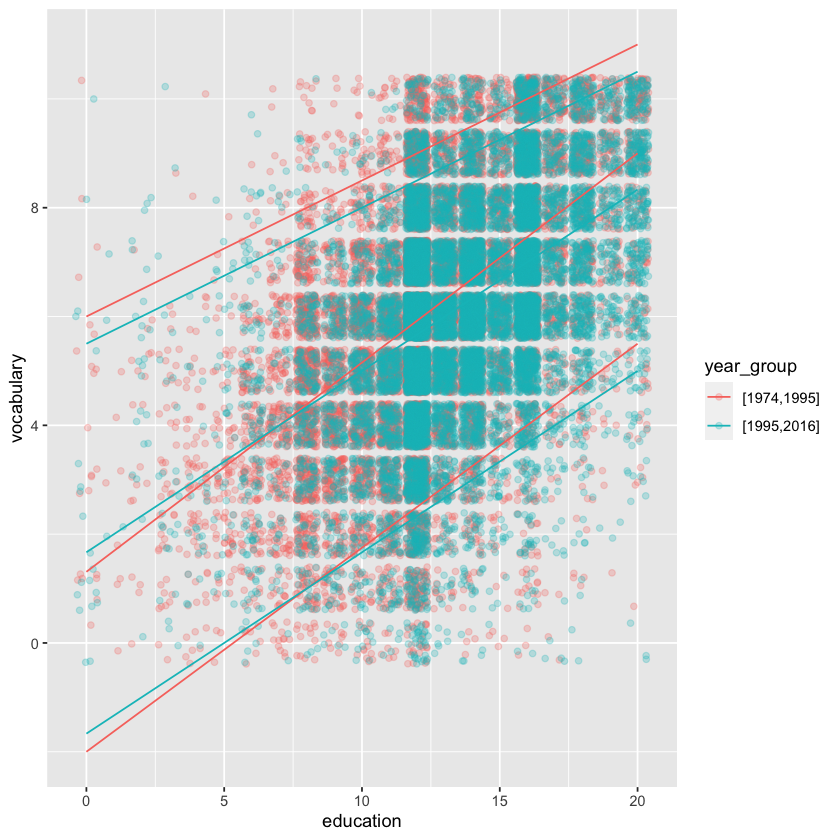

In [7]:
ggplot(Vocab, aes(x = education, y = vocabulary)) +
  geom_jitter(alpha = 0.25) +
  # Add a quantile stat, at 0.05, 0.5, and 0.95
  stat_quantile(quantiles = c(0.05, 0.5, 0.95))

# Amend the plot to color by year_group
ggplot(Vocab, aes(x = education, y = vocabulary, color = year_group)) +
  geom_jitter(alpha = 0.25) +
  stat_quantile(quantiles = c(0.05, 0.5, 0.95))


### Using stat_sum

In the `Vocab` dataset, `education` and `vocabulary` are integer
variables. In the first course, you saw that this is one of the four
causes of overplotting. You'd get a single point at each intersection
between the two variables.

One solution, shown in the step 1, is jittering with transparency.
Another solution is to use `stat_sum()`, which calculates the total
number of overlapping observations and maps that onto the `size`
aesthetic.

`stat_sum()` allows a special variable, `..prop..`, to show the
*proportion* of values within the dataset.

-   Run the code to see how jittering & transparency solves
    overplotting.
-   Replace the jittered points with a sum stat, using `stat_sum()`.

Modify the size *aesthetic* with the appropriate scale function.

-   Add a `scale_size()` function to set the `range` from `1` to `10`.

Inside `stat_sum()`, set `size` to `..prop..` so circle size represents
the proportion of the whole dataset.

Update the plot to group by `education`, so that circle size represents
the proportion of the group.


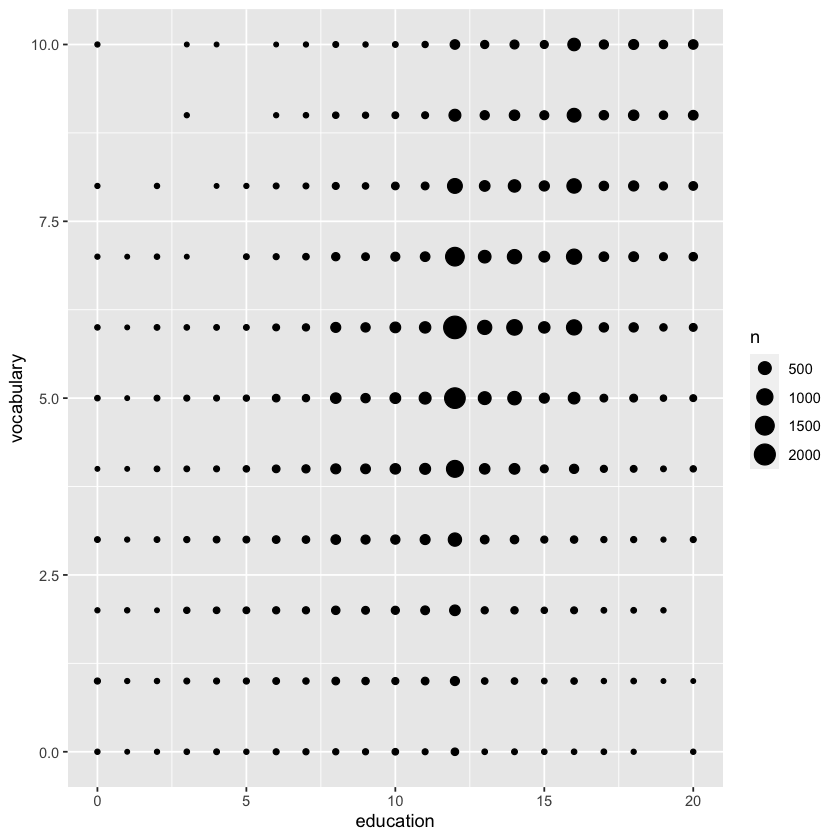

Warning message:
“The dot-dot notation (`..prop..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(prop)` instead.”


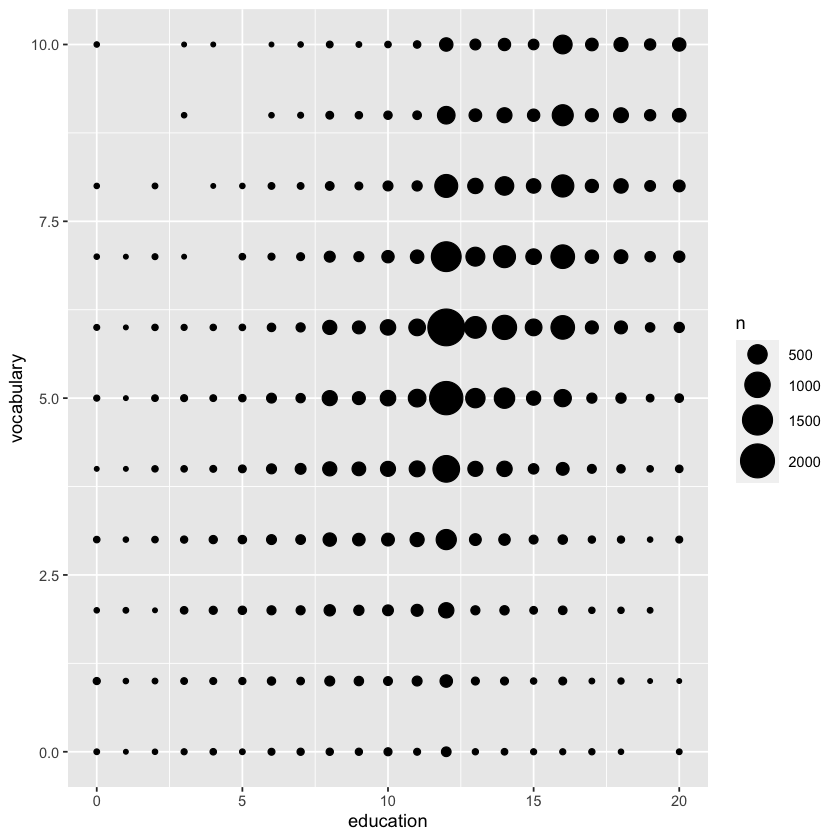

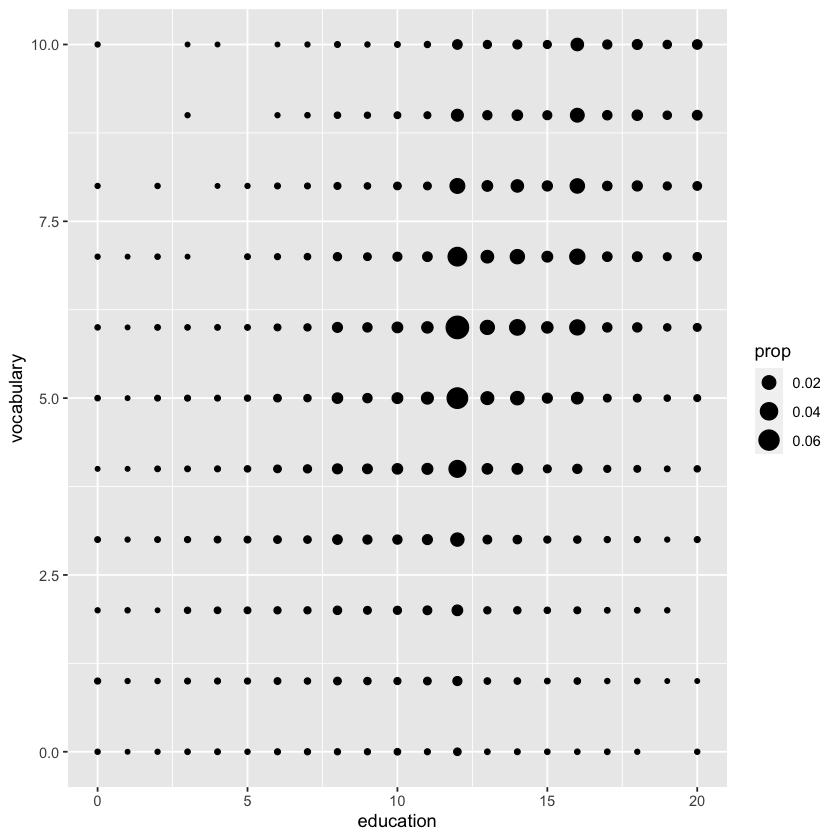

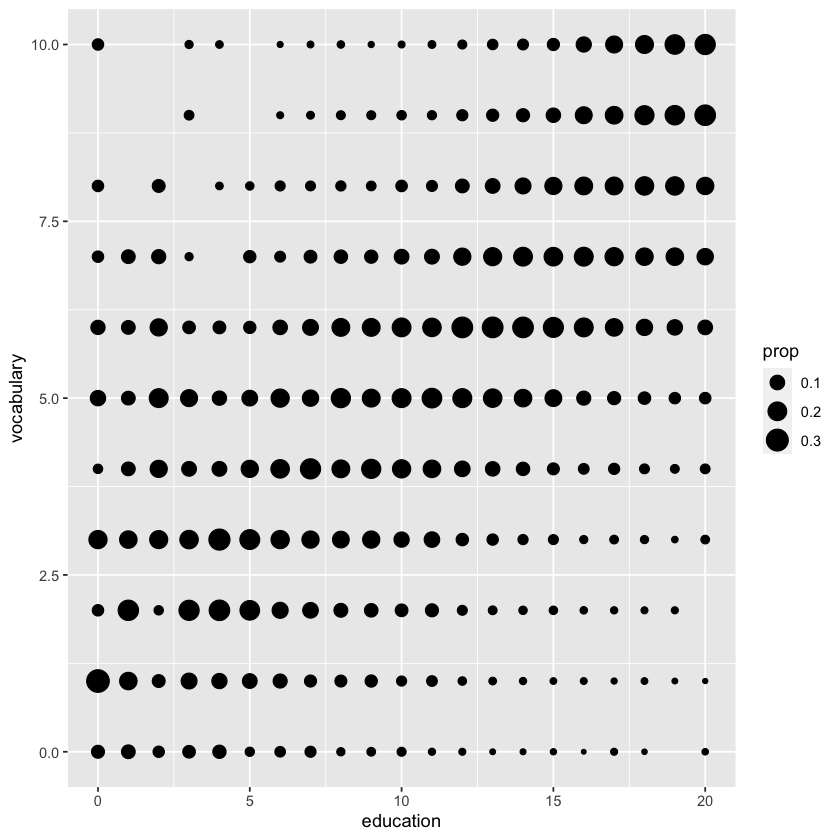

In [8]:
# Run this, look at the plot, then update it
ggplot(Vocab, aes(x = education, y = vocabulary)) +
  # Replace this with a sum stat
  stat_sum()

ggplot(Vocab, aes(x = education, y = vocabulary)) +
  stat_sum() +
  # Add a size scale, from 1 to 10
  scale_size(range = c(1, 10))

# Amend the stat to use proportion sizes
ggplot(Vocab, aes(x = education, y = vocabulary)) +
  stat_sum(aes(size = ..prop..))

# Amend the plot to group by education
ggplot(Vocab, aes(x = education, y = vocabulary, group = education)) +
  stat_sum(aes(size = ..prop..))


## Stats outside geoms

### Preparations

In the following exercises, we'll aim to make the plot shown in the
viewer. Here, we'll establish our positions and base layer of the plot.

Establishing these items as independent objects will allow us to recycle
them easily in many layers, or plots.

-   `position_jitter()` adds *jittering* (e.g. for points).
-   `position_dodge()` *dodges* geoms, (e.g. bar, col, boxplot, violin,
    errorbar, pointrange).
-   `position_jitterdodge()` *jitters* **and** *dodges* geoms, (e.g.
    points).

As before, we'll use `mtcars`, where `fcyl` and `fam` are proper factor
variables of the original `cyl` and `am` variables.

-   Using these three functions, define these position objects:
-   `posn_j`: will *jitter* with a `width` of `0.2`.
-   `posn_d`: will *dodge* with a `width` of `0.1`.
-   `posn_jd` will *jitter* **and** *dodge* with a `jitter.width` of
    `0.2` and a `dodge.width` of `0.1`.
-   Plot `wt` vs. `fcyl`, colored by `fam`. Assign this base layer to `p_wt_vs_fcyl_by_fam`.
-   Plot the data using `geom_point()`.


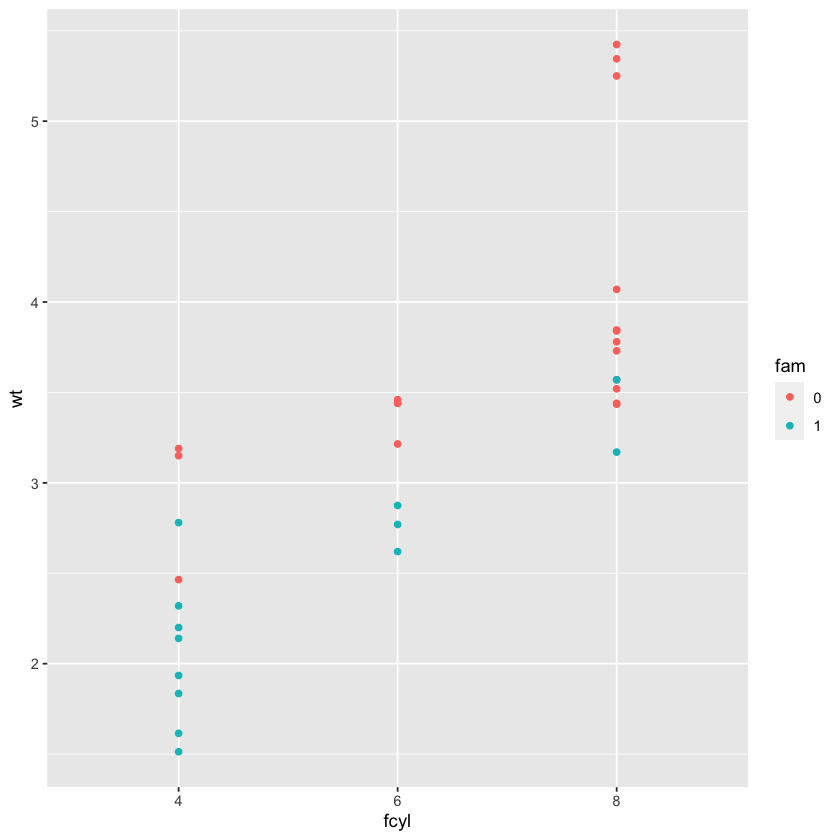

In [9]:
# Define position objects
# 1. Jitter with width 0.2
posn_j <- position_jitter(width = 0.2)

# 2. Dodge with width 0.1
posn_d <- position_dodge(width = 0.1)

# 3. Jitter-dodge with jitter.width 0.2 and dodge.width 0.1
posn_jd <- position_jitterdodge(jitter.width = 0.2, dodge.width = 0.1)

# From previous step
posn_j <- position_jitter(width = 0.2)
posn_d <- position_dodge(width = 0.1)
posn_jd <- position_jitterdodge(jitter.width = 0.2, dodge.width = 0.1)

# Create the plot base: wt vs. fcyl, colored by fam
p_wt_vs_fcyl_by_fam <- ggplot(mtcars, aes(x = fcyl, y = wt, color = fam))

# Add a point layer
p_wt_vs_fcyl_by_fam +
  geom_point()


### Using position objects

Now that the position objects have been created, you can apply them to
the base plot to see their effects. You do this by adding a point geom
and setting the `position` argument to the position object.

The variables from the last exercise, `posn_j`, `posn_d`, `posn_jd`, and
`p_wt_vs_fcyl_by_fam` are available in your workspace.

Apply the jitter position, `posn_j`, to the base plot.

Apply the dodge position, `posn_d`, to the base plot.

Apply the jitter-dodge position, `posn_jd`, to the base plot.


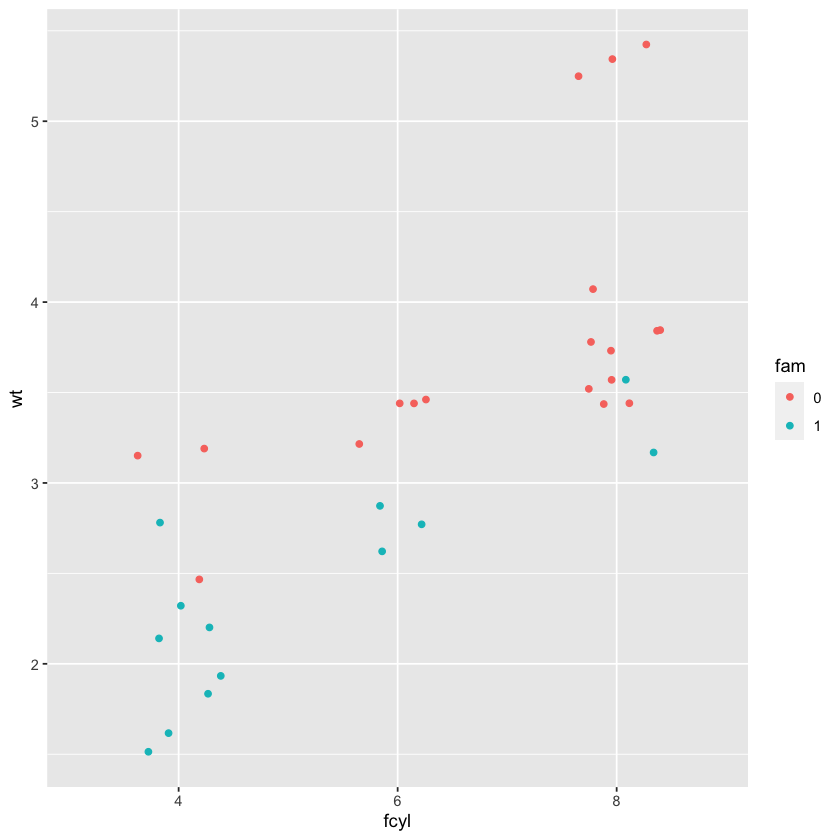

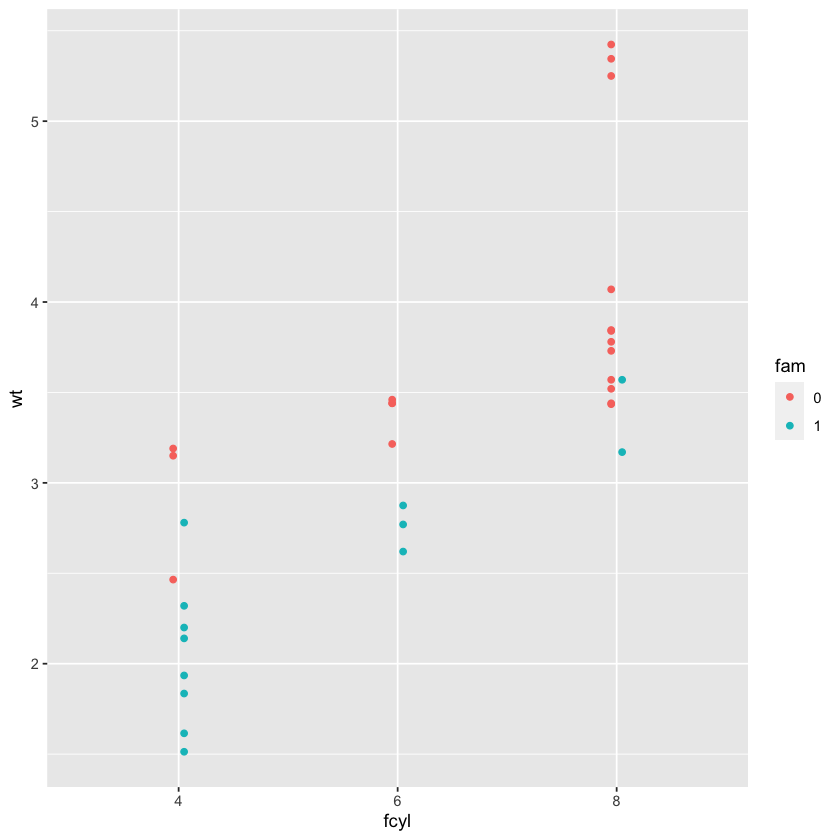

In [10]:
# Add jittering only
p_wt_vs_fcyl_by_fam +
  geom_point(position = posn_j)

# Add dodging only
p_wt_vs_fcyl_by_fam +
  geom_point(position = posn_d)


### Plotting variations

The preparation is done; now let's explore `stat_summary()`.

*Summary statistics* refers to a combination of *location* (mean or
median) and *spread* (standard deviation or confidence interval).

These metrics are calculated in `stat_summary()` by passing a function
to the `fun.data` argument. `mean_sdl()`, calculates multiples of the
standard deviation and `mean_cl_normal()` calculates the t-corrected 95%
CI.

Arguments to the data function are passed to `stat_summary()`'s
`fun.args` argument as a list.

The position object, `posn_d`, and the plot with jittered points,
`p_wt_vs_fcyl_by_fam_jit`, are available.

-   Add error bars representing the standard deviation.
    -   Set the data function to `mean_sdl` (without parentheses).
    -   Draw 1 standard deviation each side of the mean, pass arguments
        to the `mean_sdl()` function by assigning them to `fun.args` in
        the form of a list.
    -   Use `posn_d` to set the position.

The default geom for `stat_summary()` is `"pointrange"` which is already
great.

-   Update the summary stat to use an `"errorbar"` geom by assigning it
    to the `geom` argument.

<!-- -->

-   Update the plot to add a summary stat of 95% confidence limits.
-   Set the data function to `mean_cl_normal` (without parentheses).
-   Again, use the dodge position.


# Coordinates

The Coordinates layers offer specific and very useful tools for efficiently and accurately communicating data. Here we’ll look at the various ways of effectively using these layers, so you can clearly visualize lognormal datasets, variables with units, and periodic data.

## Coordinates

### Zooming In

In the video, you saw different ways of using the coordinates layer to
zoom in. In this exercise, we'll compare zooming by changing scales and
by changing coordinates.

The big difference is that the scale functions change the underlying
dataset, which affects calculations made by computed geoms (like
histograms or smooth trend lines), whereas coordinate functions make no
changes to the dataset.

A scatter plot using `mtcars` with a LOESS smoothed trend line is
provided. Take a look at this before updating it.

Update the plot by adding (`+`) a continuous x scale with `limits` from
`3` to `6`. *Spoiler: this will cause a problem!*

Update the plot by adding a Cartesian coordinate system with x limits,
`xlim`, from `3` to `6`.


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Warning message:
“Removed 12 rows containing non-finite values (`stat_smooth()`).”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“at  3.168”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“radius  4e-06”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“all data on boundary of neighborhood. make span bigger”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 3.168”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.002”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal conditio

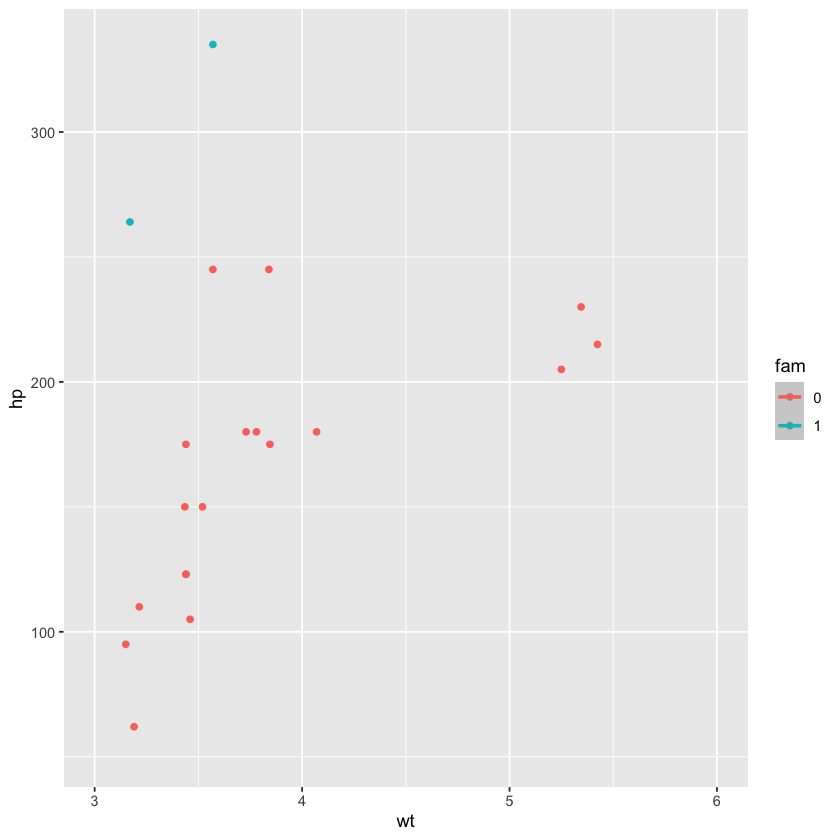

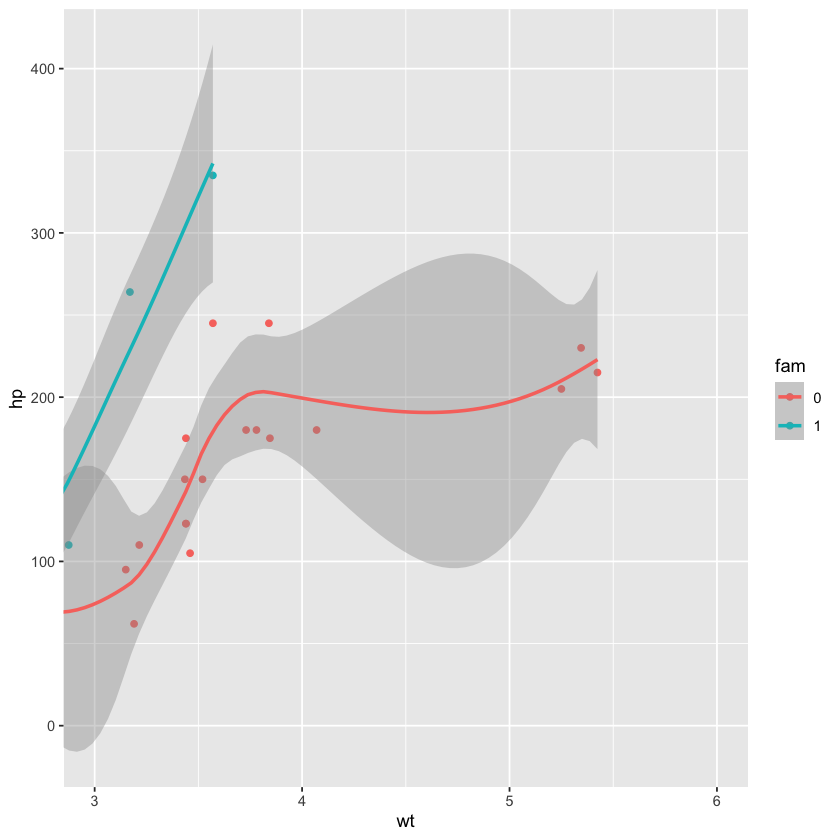

In [11]:
# Run the code, view the plot, then update it
ggplot(mtcars, aes(x = wt, y = hp, color = fam)) +
  geom_point() +
  geom_smooth() +
  # Add a continuous x scale with x limits from 3 to 6
  scale_x_continuous(limits = c(3, 6))

ggplot(mtcars, aes(x = wt, y = hp, color = fam)) +
  geom_point() +
  geom_smooth() +
  # Add Cartesian coordinates with x limits from 3 to 6
  coord_cartesian(xlim = c(3, 6))


### Aspect ratio I: 1:1 ratios

We can set the aspect ratio of a plot with `coord_fixed()`, which uses
`ratio = 1` as a default. A 1:1 aspect ratio is most appropriate when
two continuous variables are on the same scale, as with the `iris`
dataset.

All variables are measured in centimeters, so it only makes sense that
one unit on the plot should be the same physical distance on each axis.
This gives a more truthful depiction of the relationship between the two
variables since the aspect ratio can change the angle of our smoothing
line. This would give an erroneous impression of the data. Of course the
underlying linear models don't change, but our perception can be
influenced by the angle drawn.

A plot using the `iris` dataset, of sepal width vs. sepal length colored
by species, is shown in the viewer.

-   Add a fixed coordinate layer to force a 1:1 aspect ratio.


`geom_smooth()` using formula = 'y ~ x'


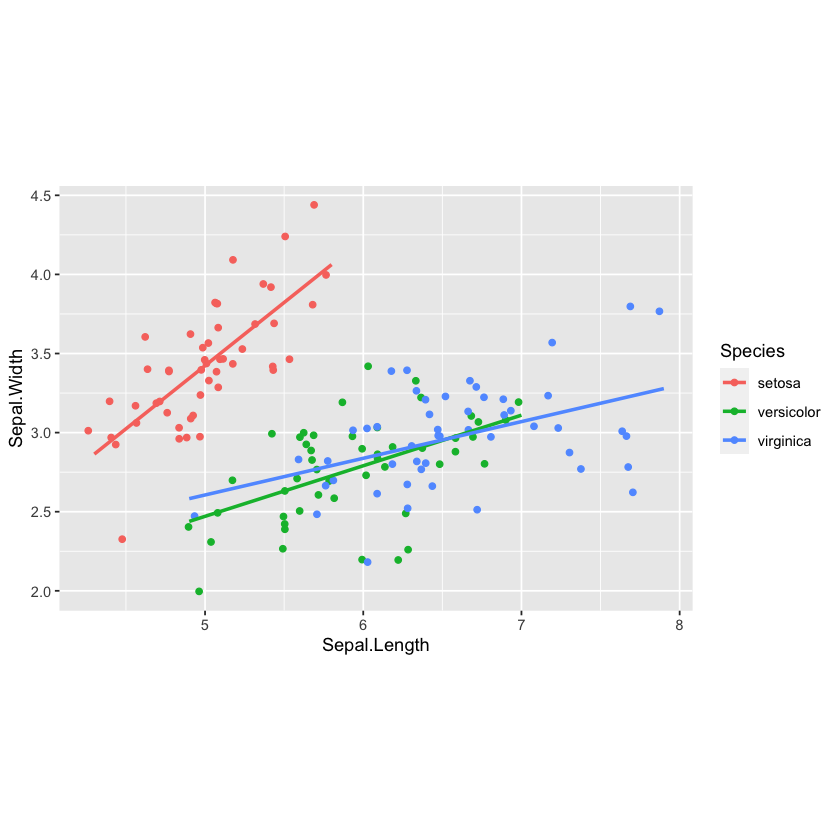

In [12]:
ggplot(iris, aes(x = Sepal.Length, y = Sepal.Width, color = Species)) +
  geom_jitter() +
  geom_smooth(method = "lm", se = FALSE) +
  # Fix the coordinate ratio
  coord_fixed()


### Aspect ratio II: setting ratios

When values are not on the same scale it can be a bit tricky to set an
appropriate aspect ratio. A classic William Cleveland (inventor of dot
plots) example is the `sunspots` data set. We have 3200 observations
from 1750 to 2016.

`sun_plot` is a plot *without* any set aspect ratio. It fills up the
graphics device.

To make aspect ratios clear, we've drawn an orange box that is 75 units
high and 75 *years* wide. Using a 1:1 aspect ratio would make the box
square. That aspect ratio would make things harder to see the
oscillations: it is better to force a wider ratio.

-   Fix the coordinates to a 1:1 aspect ratio.

The `y` axis is now unreadably small. Make it bigger!

-   Change the aspect `ratio` to 20:1. This is the aspect ratio
    recommended by Cleveland to help make the trend among oscillations
    easiest to see.



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Coordinate system already present. Adding new coordinate system, which will replace the existing
one.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Coordinate system already present. Adding new coordinate system, which will replace the existing
one.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


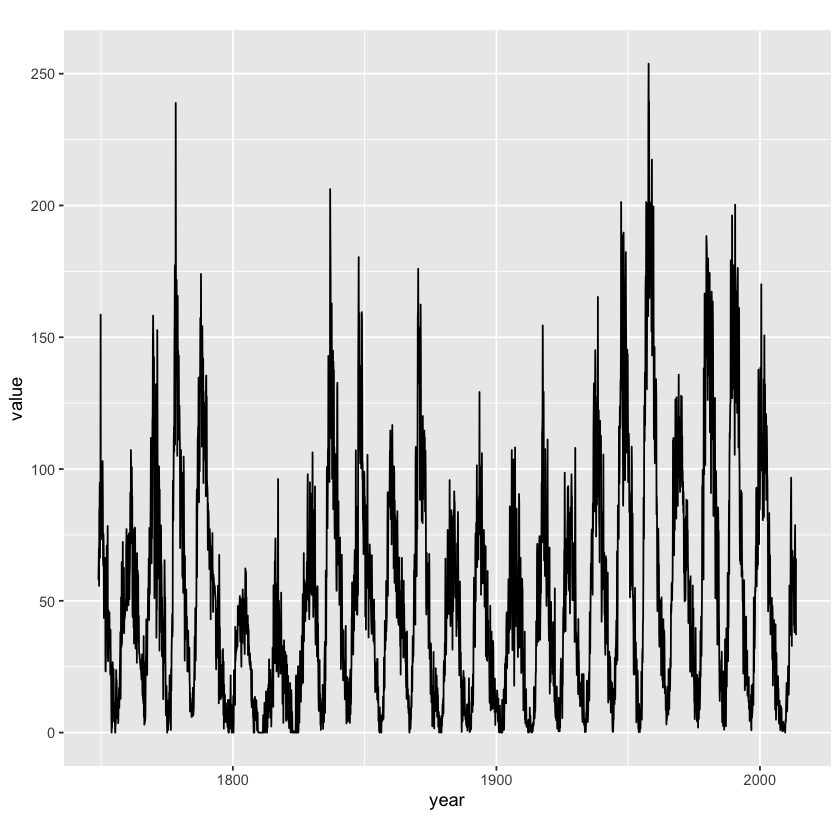

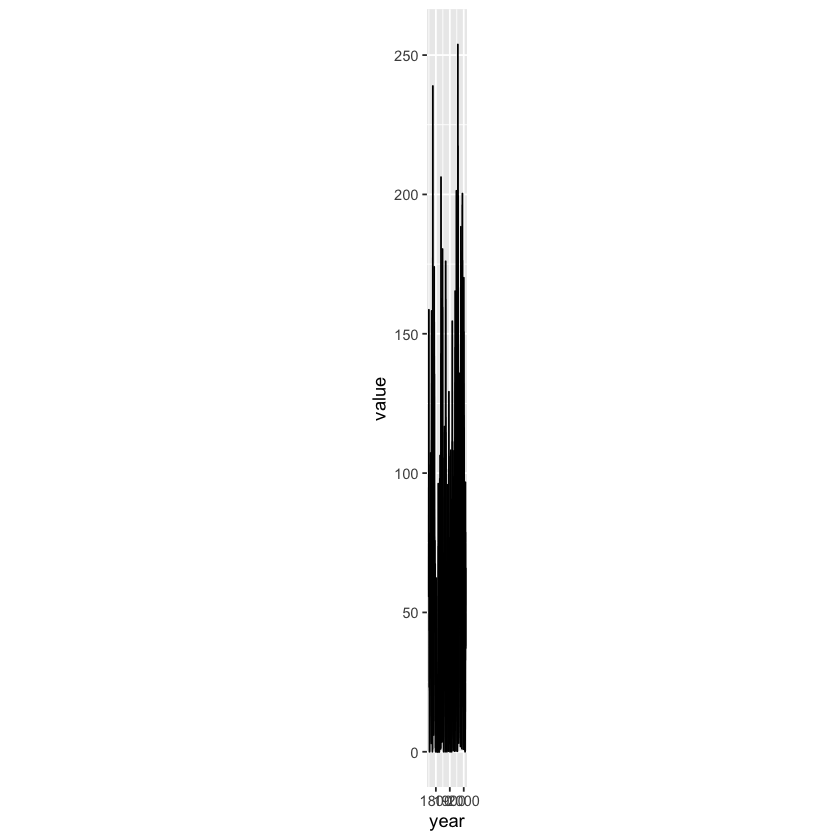

In [13]:
# edited/added
library(reshape2)
library(zoo)
sunspots.m <- data.frame(year = index(sunspot.month), value = melt(sunspot.month)$value)
sun_plot <- ggplot(sunspots.m, aes(x = year, y = value)) +
  geom_line() +
  coord_fixed()

# Fix the aspect ratio to 1:1
sun_plot +
  coord_fixed()

# Change the aspect ratio to 20:1
sun_plot +
  coord_fixed(ratio = 20)


### Expand and clip

The `coord_*()` layer functions offer two useful arguments that work
well together: `expand` and `clip`.

-   `expand` sets a buffer margin around the plot, so data and axes
    don't overlap. Setting `expand` to `0` draws the axes to the limits
    of the data.
-   `clip` decides whether plot elements that would lie outside the plot
    panel are displayed or ignored ("clipped").

When done properly this can make a great visual effect! We'll use
`theme_classic()` and modify the axis lines in this example.

-   Add Cartesian coordinates with zero expansion, to remove all buffer
    margins on both the x and y axes.

Setting `expand` to `0` caused points at the edge of the plot panel to
be cut off.

-   Set the `clip` argument to `"off"` to prevent this.
-   Remove the axis lines by setting the `axis.line` argument to
    `element_blank()` in the `theme()` layer function.


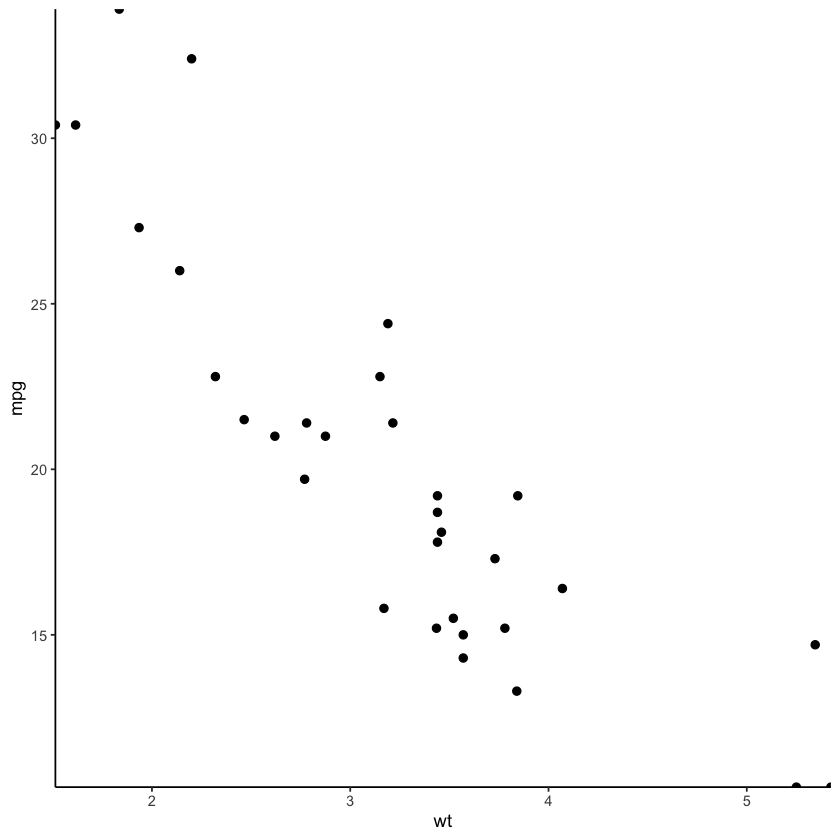

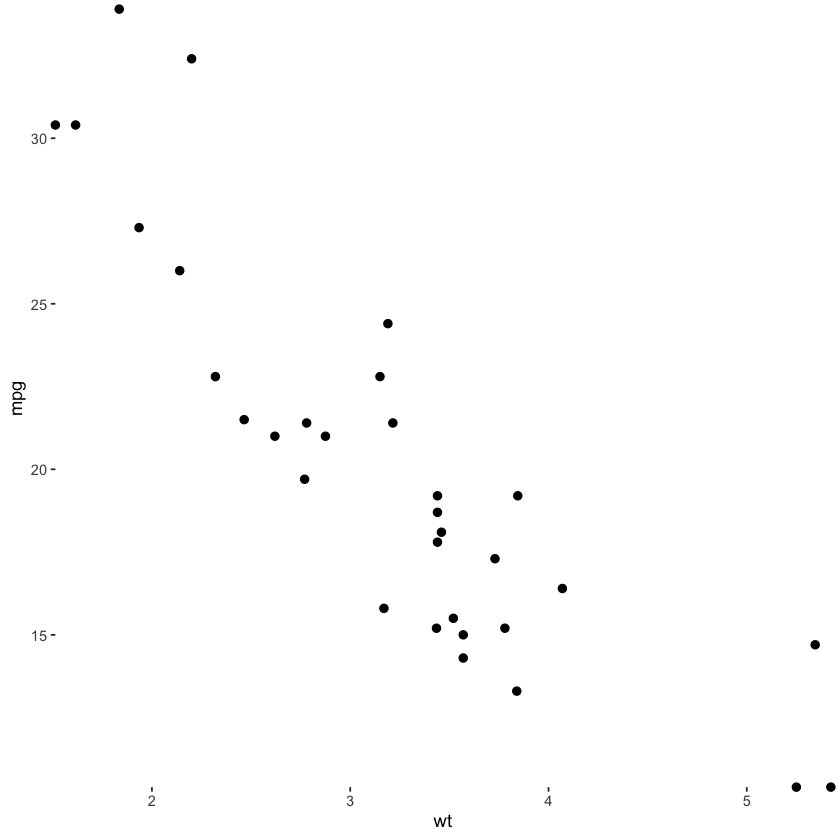

In [14]:
ggplot(mtcars, aes(wt, mpg)) +
  geom_point(size = 2) +
  theme_classic() +
  # Add Cartesian coordinates with zero expansion
  coord_cartesian(expand = 0)

ggplot(mtcars, aes(wt, mpg)) +
  geom_point(size = 2) +
  # Turn clipping off
  coord_cartesian(expand = 0, clip = "off") +
  theme_classic() +
  # Remove axis lines
  theme(axis.line = element_blank())


## Coordinates vs. scales

### Log-transforming scales

Using `scale_y_log10()` and `scale_x_log10()` is equivalent to
transforming our actual dataset *before* getting to `ggplot2`.

Using `coord_trans()`, setting `x = "log10"` and/or `y = "log10"`
arguments, transforms the data *after* statistics have been calculated.
The plot will look the same as with using `scale_*_log10()`, but the
scales will be different, meaning that we'll see the original values on
our log10 transformed axes. This can be useful since log scales can be
somewhat unintuitive.

Let's see this in action with positively skewed data - the brain and
body weight of 51 mammals from the `msleep` dataset.

-   Using the `msleep` dataset, plot the raw values of `brainwt` against
    `bodywt` values as a scatter plot.

<!-- -->

-   Add the `scale_x_log10()` and `scale_y_log10()` layers with default
    values to transform the data before plotting.

<!-- -->

-   Use `coord_trans()` to apply a `"log10"` transformation to both the
    `x` and `y` scales.


Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


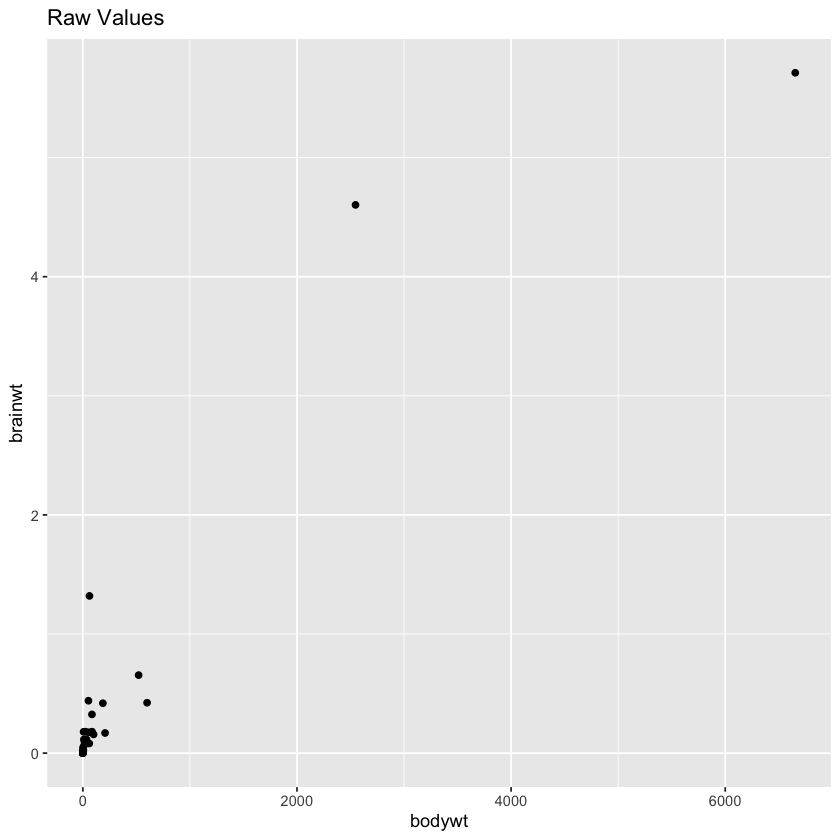

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


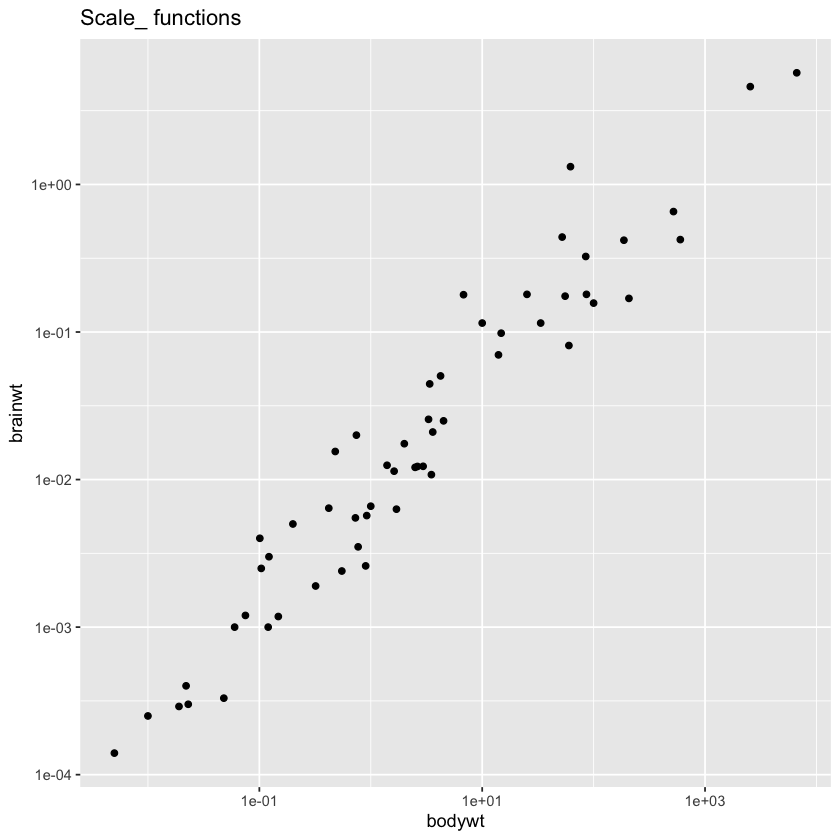

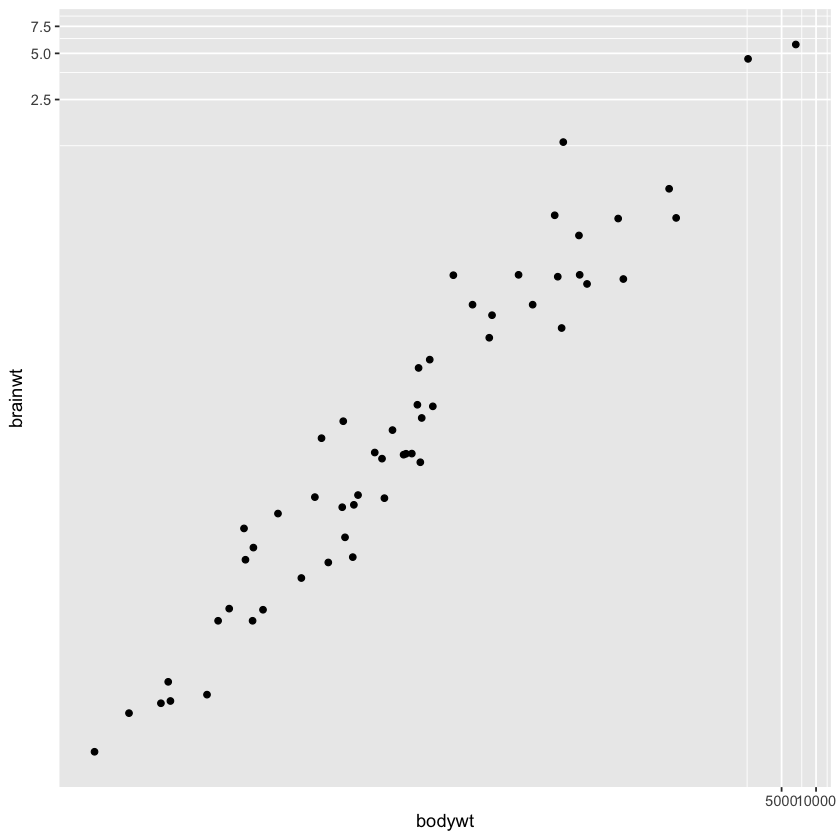

In [15]:
# Produce a scatter plot of brainwt vs. bodywt
ggplot(msleep, aes(bodywt, brainwt)) +
  geom_point() +
  ggtitle("Raw Values")

# Add scale_*_*() functions
ggplot(msleep, aes(bodywt, brainwt)) +
  geom_point() +
  scale_x_log10() +
  scale_y_log10() +
  ggtitle("Scale_ functions")

# Perform a log10 coordinate system transformation
ggplot(msleep, aes(bodywt, brainwt)) +
  geom_point() +
  coord_trans(x = "log10", y = "log10")


### Adding stats to transformed scales

In the last exercise, we saw the usefulness of the `coord_trans()`
function, but be careful! Remember that statistics are calculated on the
untransformed data. A linear model may end up looking not-so-linear
after an axis transformation. Let's revisit the two plots from the
previous exercise and compare their linear models.

Add log10 transformed scales to the x and y axes.

-   Add a log10 coordinate transformation for both the x and y axes.
-   *Do you notice the difference between the two plots?*


`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 27 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 27 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


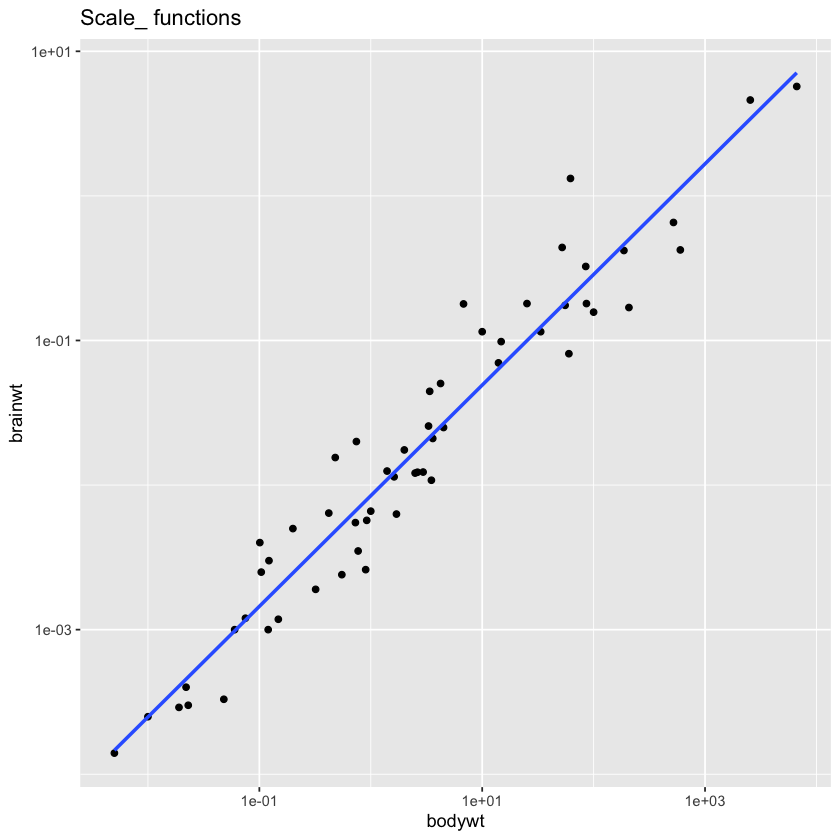

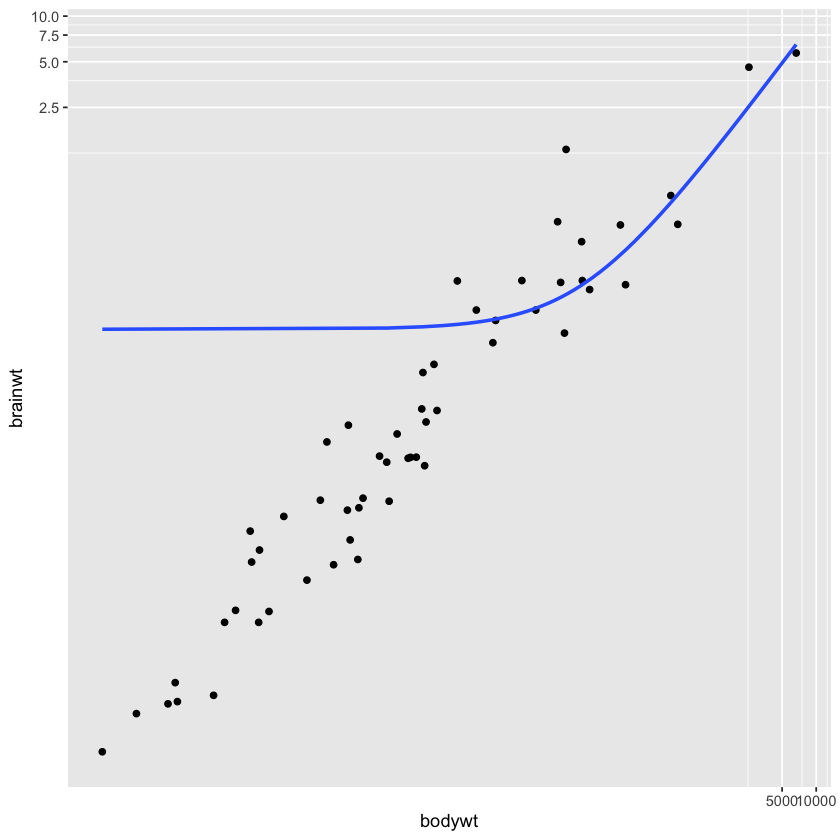

In [16]:
# Plot with a scale_*_*() function:
ggplot(msleep, aes(bodywt, brainwt)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE) +
  # Add a log10 x scale
  scale_x_log10() +
  # Add a log10 y scale
  scale_y_log10() +
  ggtitle("Scale_ functions")

# Plot with transformed coordinates
ggplot(msleep, aes(bodywt, brainwt)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE) +
  # Add a log10 coordinate transformation for x and y axes
  coord_trans(x = "log10", y = "log10")


## Double and flipped axes

### Useful double axes

Double x and y-axes are a contentious topic in data visualization. We'll
revisit that discussion at the end of chapter 4. Here, I want to review
a great use case where double axes actually do add value to a plot.

Our goal plot is displayed in the viewer. The two axes are the raw
temperature values on a Fahrenheit scale and the transformed values on a
Celsius scale.

You can imagine a similar scenario for Log-transformed and original
values, miles and kilometers, or pounds and kilograms. A scale that is
unintuitive for many people can be made easier by adding a
transformation as a double axis.

Begin with a standard line plot, of `Temp` described by `Date` in the
`airquality` dataset.
-   Convert `y_breaks` from Fahrenheit to Celsius (subtract 32, then multiply by 5, then divide by 9).
-   Define the secondary y-axis using `sec_axis()`. Use the `identity` transformation. Set the `breaks` and `labels` to the defined objects `y_breaks` and `y_labels`, respectively.
-   Add your secondary y-axis to the `sec.axis` argument of `scale_y_continuous()`.


<ggproto object: Class AxisSecondary, gg>
    axis: NULL
    break_info: function
    breaks: 59 68 77 86 95 104
    create_scale: function
    detail: 1000
    empty: function
    guide: waiver
    init: function
    labels: 15 20 25 30 35 40
    make_title: function
    mono_test: function
    name: Celsius
    trans: function
    transform_range: function
    super:  <ggproto object: Class AxisSecondary, gg>

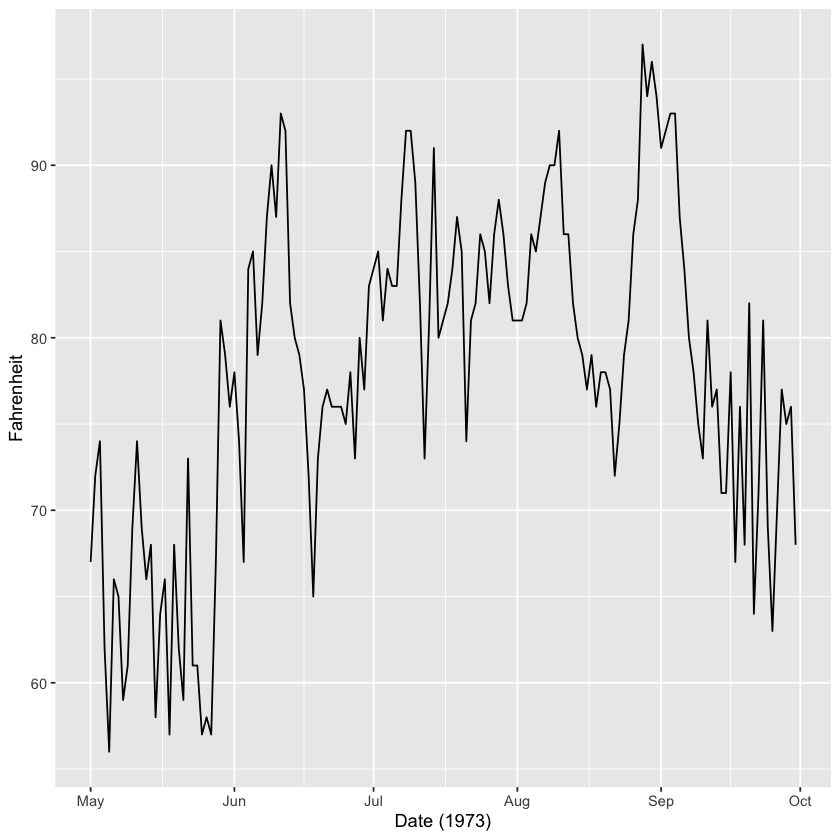

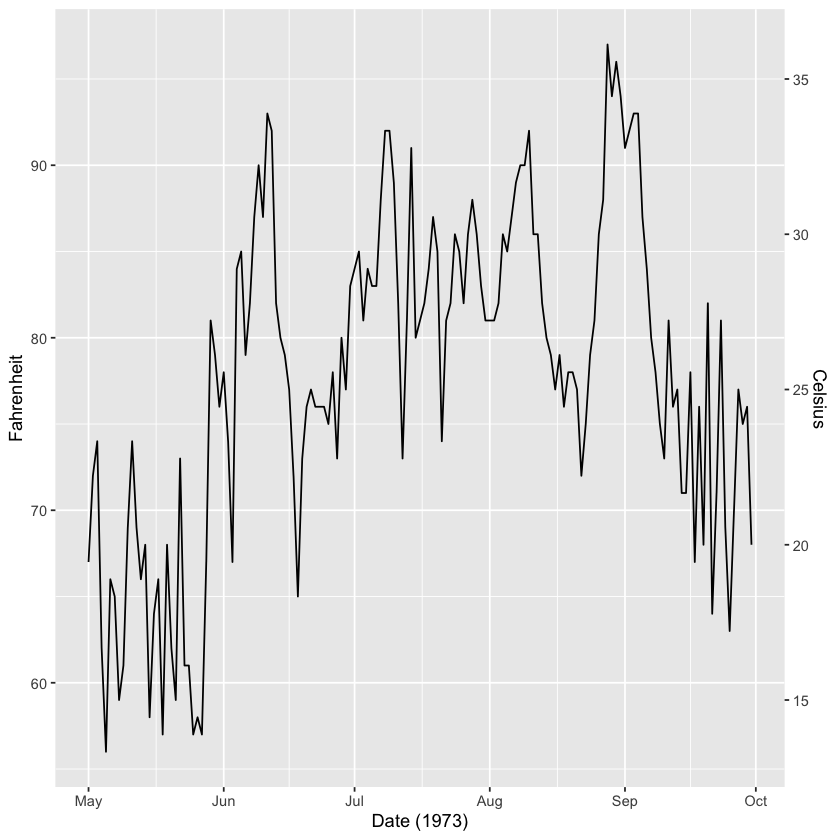

In [17]:
# edited/added
library(lubridate)
airquality <- airquality %>% 
  mutate(Date = make_date(1974, Month, Day))

# Using airquality, plot Temp vs. Date
ggplot(airquality, aes(x = Date, y = Temp)) +
  # Add a line layer
  geom_line() +
  labs(x = "Date (1973)", y = "Fahrenheit")

# Define breaks (Fahrenheit)
y_breaks <- c(59, 68, 77, 86, 95, 104)

# Convert y_breaks from Fahrenheit to Celsius
y_labels <- (y_breaks - 32) * 5 / 9

# Create a secondary x-axis
secondary_y_axis <- sec_axis(
  # Use identity transformation
  trans = identity,
  name = "Celsius",
  # Define breaks and labels as above
  breaks = y_breaks,
  labels = y_labels
)

# Examine the object
secondary_y_axis

# From previous step
y_breaks <- c(59, 68, 77, 86, 95, 104)
y_labels <- (y_breaks - 32) * 5 / 9
secondary_y_axis <- sec_axis(
  trans = identity,
  name = "Celsius",
  breaks = y_breaks,
  labels = y_labels
)

# Update the plot
ggplot(airquality, aes(x = Date, y = Temp)) +
  geom_line() +
  # Add the secondary y-axis 
  scale_y_continuous(sec.axis = secondary_y_axis) +
  labs(x = "Date (1973)", y = "Fahrenheit")


### Flipping axes I

*Flipping* axes means to reverse the variables mapped onto the `x` and
`y` aesthetics. We can just change the mappings in `aes()`, but we can
also use the `coord_flip()` layer function.

There are two reasons to use this function:

-   We want a vertical geom to be horizontal, or
-   We've completed a long series of plotting functions and want to flip
    it without having to rewrite all our commands.

<!-- -->

-   Create a side-by-side ("dodged") bar chart of `fcyl`, filled
    according to `fam`.

<!-- -->

-   To get horizontal bars, add a `coord_flip()` function.

<!-- -->

-   Partially overlapping bars are popular with "infoviz" in magazines.
    Update the `position` argument to use `position_dodge()` with a
    width of `0.5`.


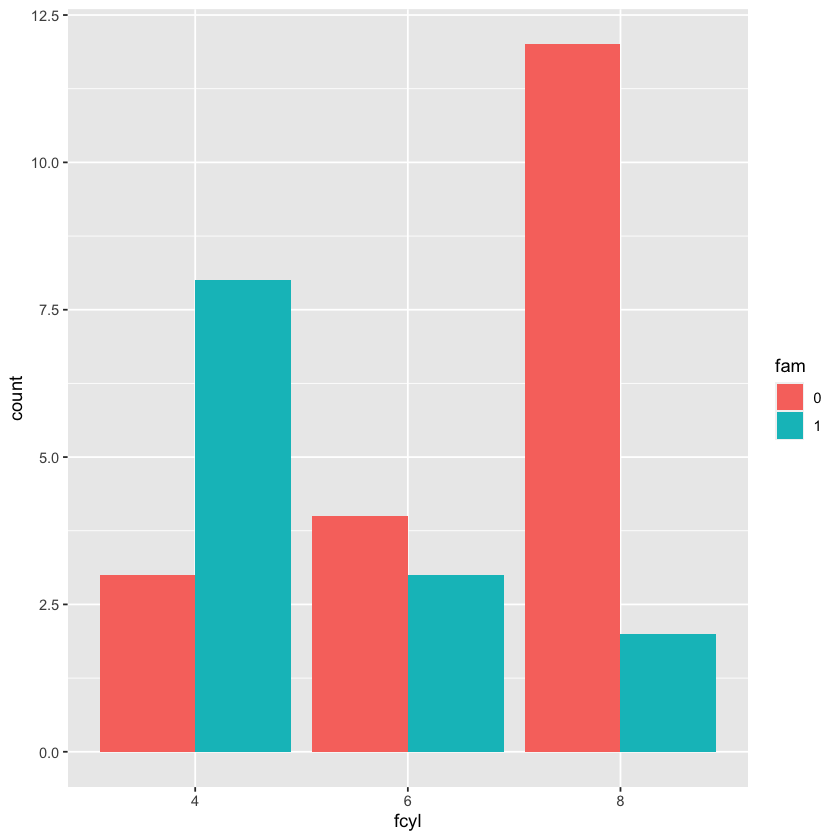

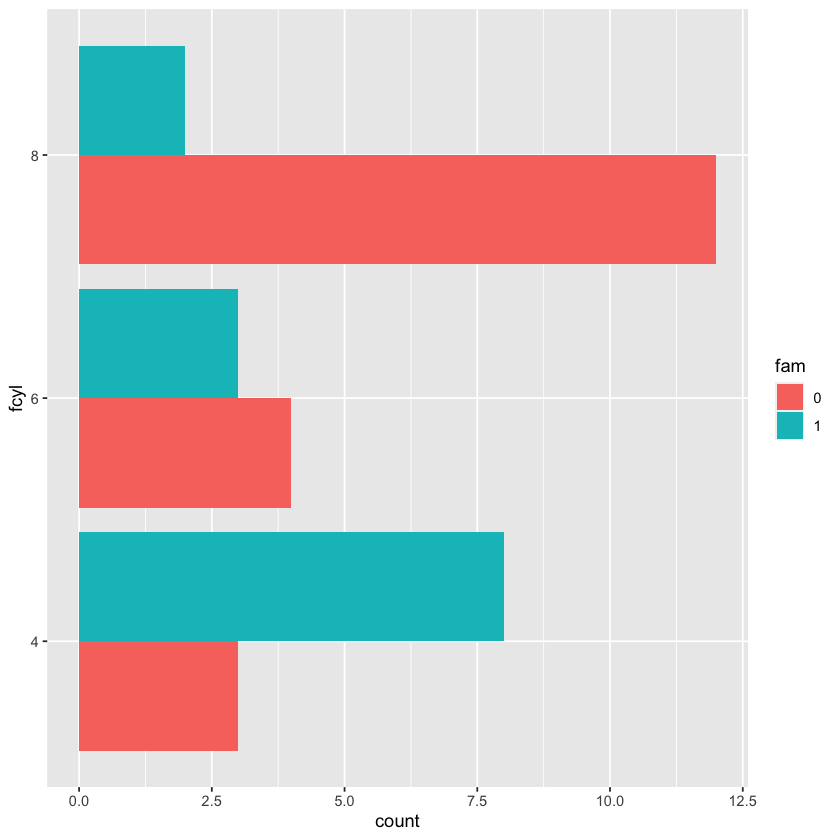

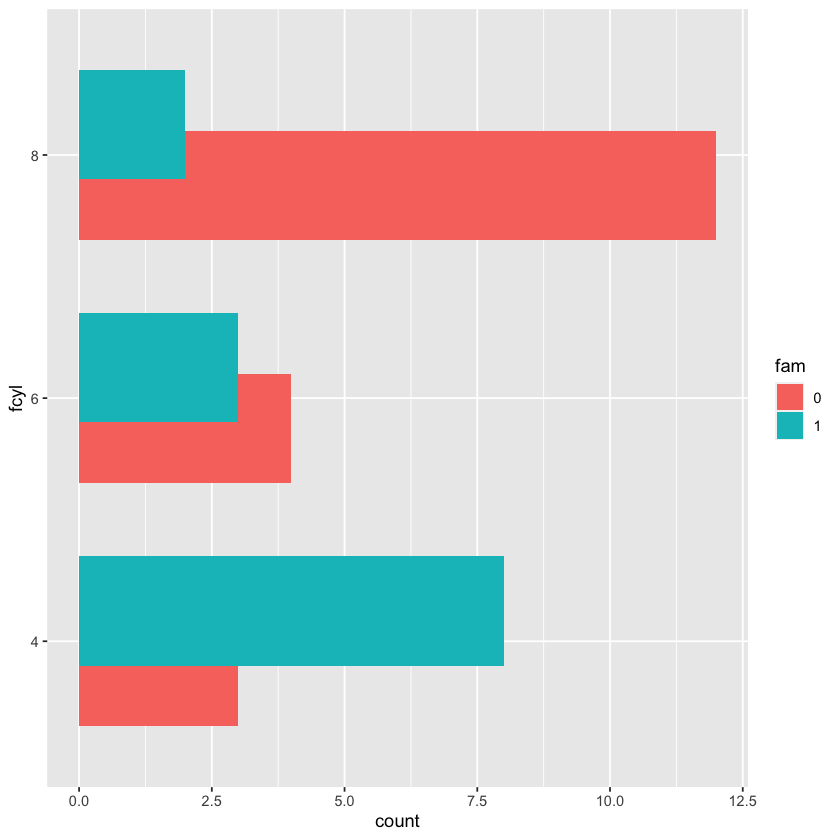

In [18]:
# Plot fcyl bars, filled by fam
ggplot(mtcars, aes(fcyl, fill = fam)) +
  # Place bars side by side
  geom_bar(position = "dodge")

ggplot(mtcars, aes(fcyl, fill = fam)) +
  geom_bar(position = "dodge") +
  # Flip the x and y coordinates
  coord_flip()

ggplot(mtcars, aes(fcyl, fill = fam)) +
  # Set a dodge width of 0.5 for partially overlapping bars
  geom_bar(position = position_dodge(0.5)) +
  coord_flip()


### Flipping axes II

In this exercise, we'll continue to use the `coord_flip()` layer
function to reverse the variables mapped onto the `x` and `y`
aesthetics.

Within the `mtcars` dataset, `car` is the name of the car and `wt` is
its weight.

-   Create a scatter plot of `wt` versus `car` using the `mtcars`
    dataset. We'll flip the axes in the next step.
-   It would be easier to read if `car` was mapped to the y axis. Flip the coordinates. *Notice that the labels also get flipped*!


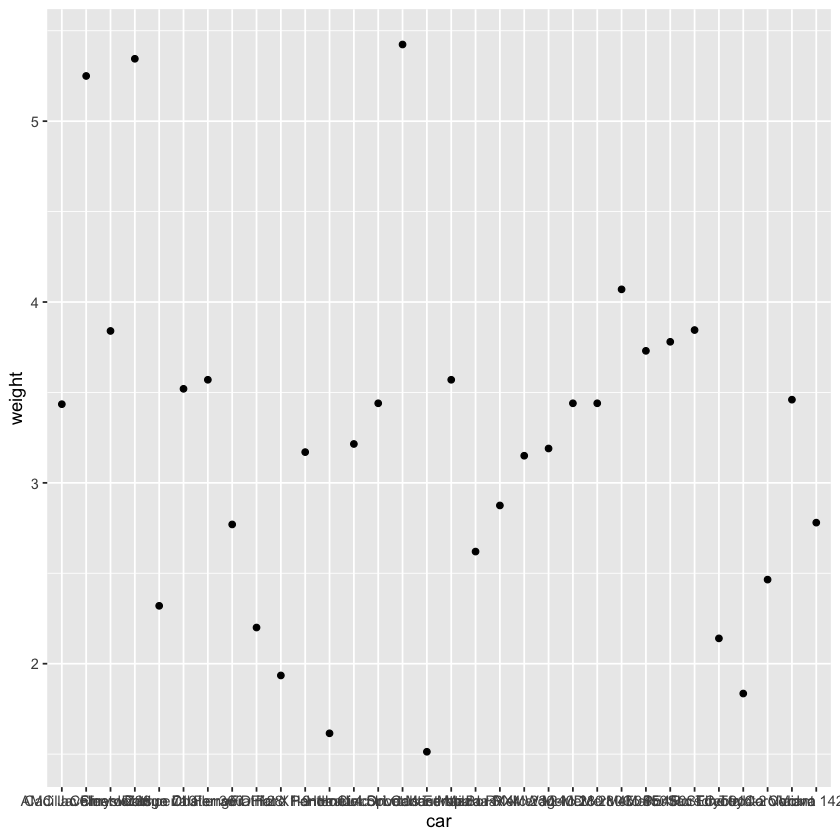

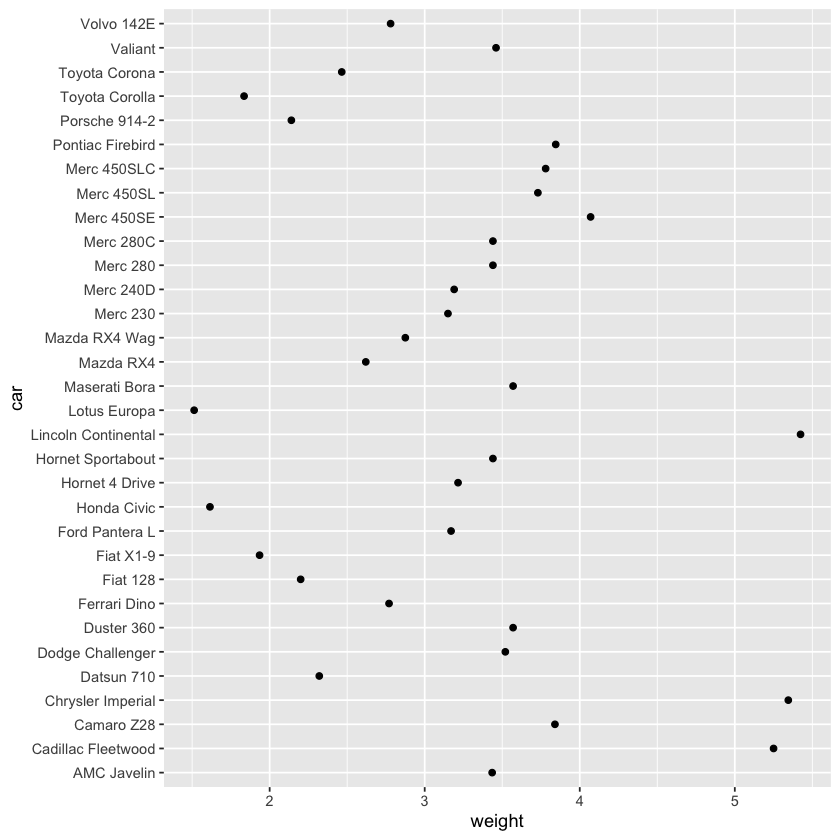

In [19]:
# edited/added
mtcars <- read.csv('mtcars.csv', stringsAsFactors=FALSE)
mtcars <- mtcars %>% 
  mutate(fam = as.factor(am), fcyl = as.factor(cyl), fvs = as.factor(vs))

# Plot of wt vs. car
ggplot(mtcars, aes(car, wt)) +
  # Add a point layer
  geom_point() +
  labs(x = "car", y = "weight")

# Flip the axes to set car to the y axis
ggplot(mtcars, aes(car, wt)) +
  geom_point() +
  labs(x = "car", y = "weight") +
  coord_flip()


## Polar coordinates

### Pie charts

The `coord_polar()` function converts a planar x-y Cartesian plot to
polar coordinates. This can be useful if you are producing pie charts.

We can imagine two forms for pie charts - the typical filled circle, or
a colored ring.

Typical pie charts omit all of the non-data ink, which we saw in the
themes chapter of the last course. Pie charts are not really better than
stacked bar charts, but we'll come back to this point in the next
chapter.

A bar plot using `mtcars` of the number of cylinders (as a factor),
`fcyl`, is shown in the console.

-   *Run the code to see the stacked bar plot.*
-   Add (`+`) a polar coordinate system, mapping the angle to the `y`
    variable by setting `theta` to `"y"`.

<!-- -->

-   Reduce the `width` of the bars to `0.1`.
-   Make it a ring plot by adding a continuous x scale with limits from
    `0.5` to `1.5`.


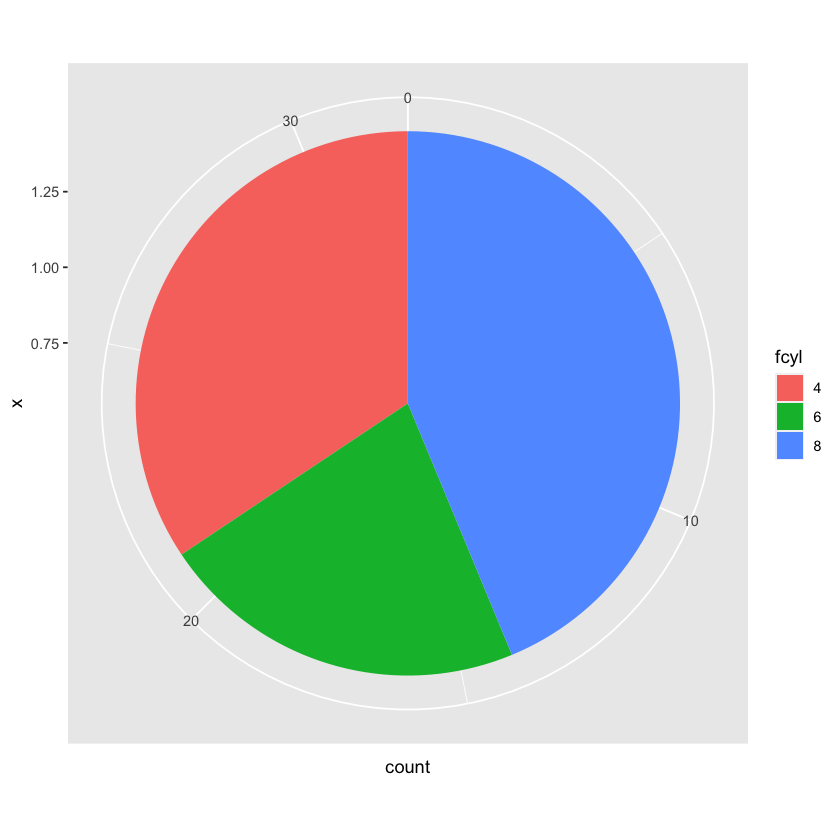

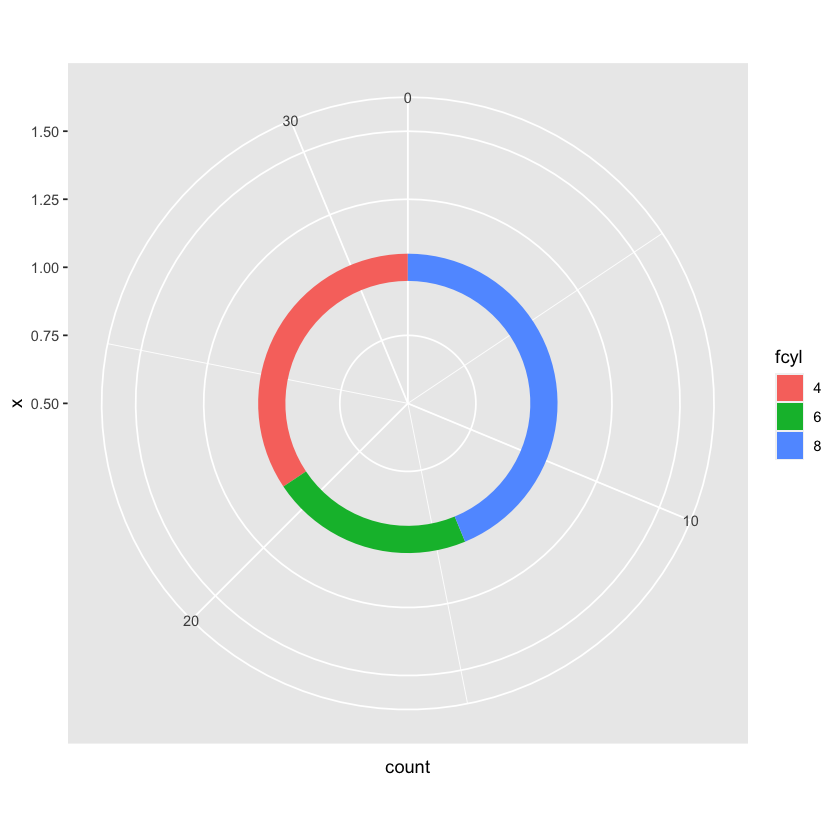

In [20]:
# Run the code, view the plot, then update it
ggplot(mtcars, aes(x = 1, fill = fcyl)) +
  geom_bar() +
  # Add a polar coordinate system
  coord_polar(theta = "y")

ggplot(mtcars, aes(x = 1, fill = fcyl)) +
  # Reduce the bar width to 0.1
  geom_bar(width = 0.1) +
  coord_polar(theta = "y") +
  # Add a continuous x scale from 0.5 to 1.5
  scale_x_continuous(limits = c(0.5, 1.5))


### Wind rose plots

Polar coordinate plots are well-suited to scales like compass direction
or time of day. A popular example is the "wind rose".

The `wind` dataset is taken from the `openair` package and contains
hourly measurements for windspeed (`ws`) and direction (`wd`) from
London in 2003. Both variables are factors.

-   Make a classic bar plot mapping `wd` onto the `x` aesthetic and `ws`
    onto `fill`.
-   Use a `geom_bar()` layer, since we want to aggregate over all date
    values, and set the `width` argument to 1, to eliminate any spaces
    between the bars.
-   Convert the Cartesian coordinate space into a polar coordinate space with `coord_polar()`.
-   Set the `start` argument to `-pi/16` to position North at the top of the plot.


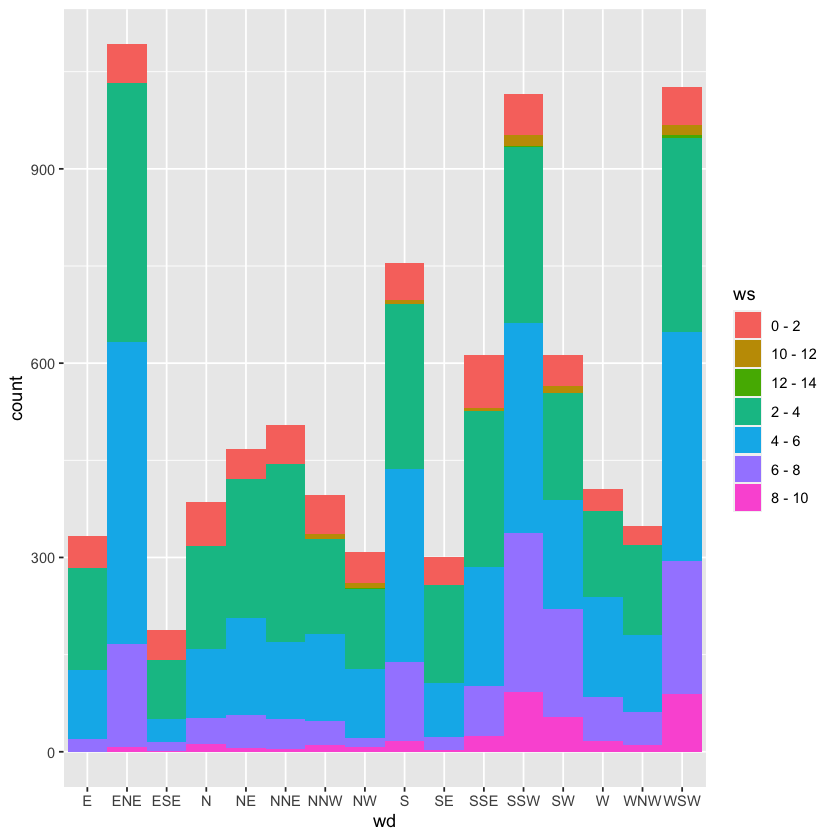

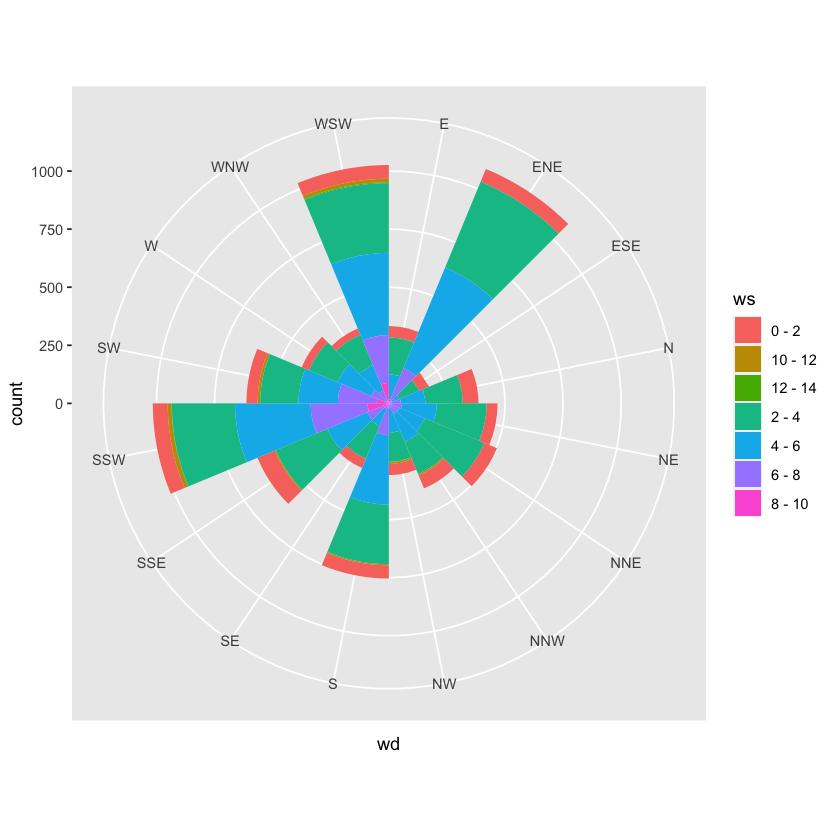

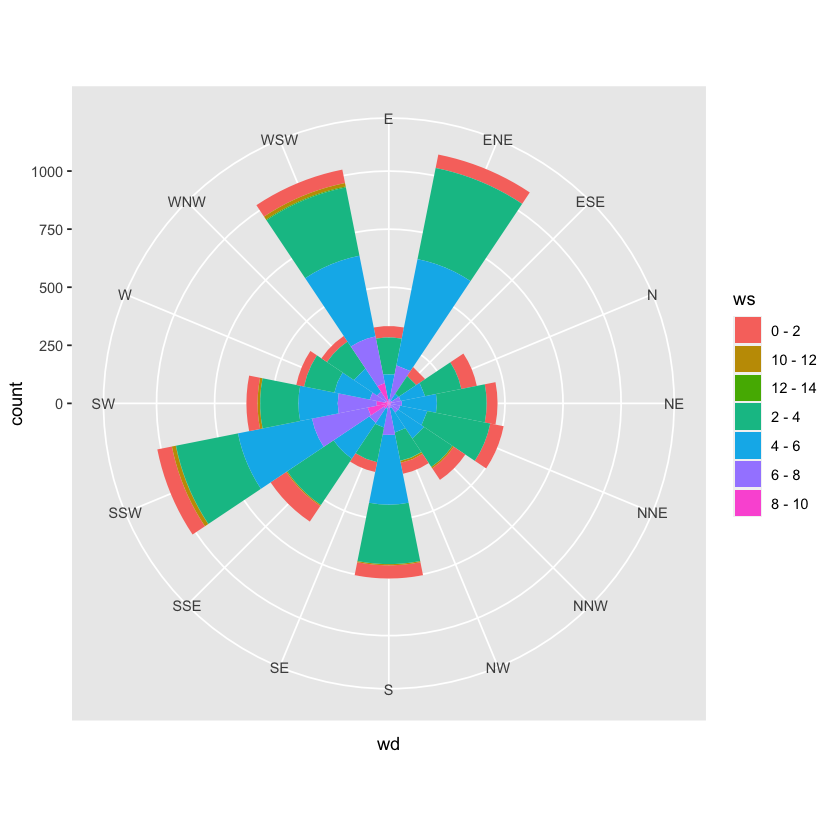

In [21]:
# edited/added
wind <- read.csv('wind.csv')

# Using wind, plot wd filled by ws
ggplot(wind, aes(wd, fill = ws)) +
  # Add a bar layer with width 1
  geom_bar(width = 1)

# Convert to polar coordinates:
ggplot(wind, aes(wd, fill = ws)) +
  geom_bar(width = 1) +
  coord_polar()

# Convert to polar coordinates:
ggplot(wind, aes(wd, fill = ws)) +
  geom_bar(width = 1) +
  coord_polar(start = -pi/16)


# Facets

Facets let you split plots into multiple panes, each displaying subsets of the dataset. Here you'll learn how to wrap facets and arrange them in a grid, as well as providing custom labeling.

## The facets layer

### Facet layer basics

Faceting splits the data up into groups, according to a categorical
variable, then plots each group in its own panel. For splitting the data
by one or two categorical variables, `facet_grid()` is best.

Given categorical variables `A` and `B`, the code pattern is

    plot +
      facet_grid(rows = vars(A), cols = vars(B))

This draws a panel for each pairwise combination of the values of `A`
and `B`.

Here, we'll use the `mtcars` data set to practice. Although `cyl` and
`am` are not encoded as factor variables in the data set, `ggplot2` will
coerce variables to factors when used in facets.

-   Facet the plot in a grid, with each `am` value in its own row.

<!-- -->

-   Facet the plot in a grid, with each `cyl` value in its own column.

<!-- -->

-   Facet the plot in a grid, with each `am` value in its own row and
    each `cyl` value in its own column.


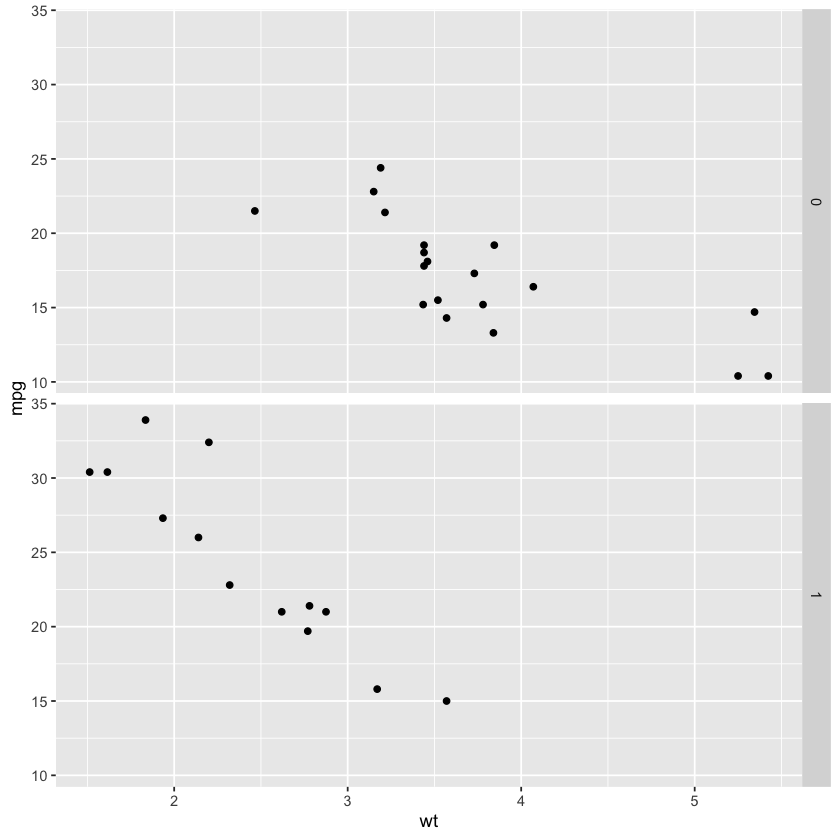

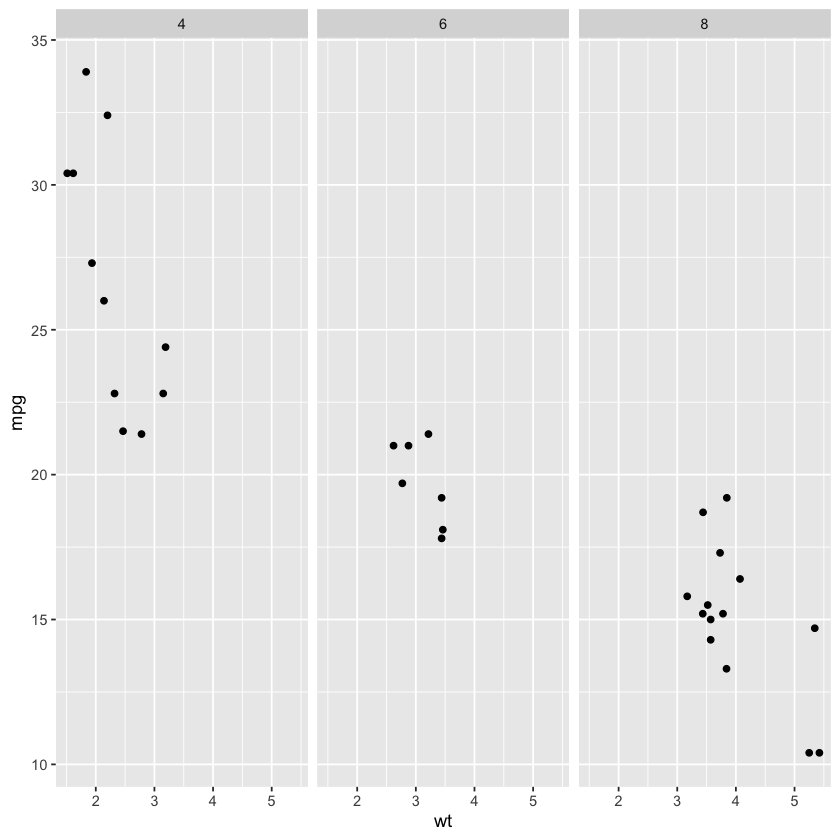

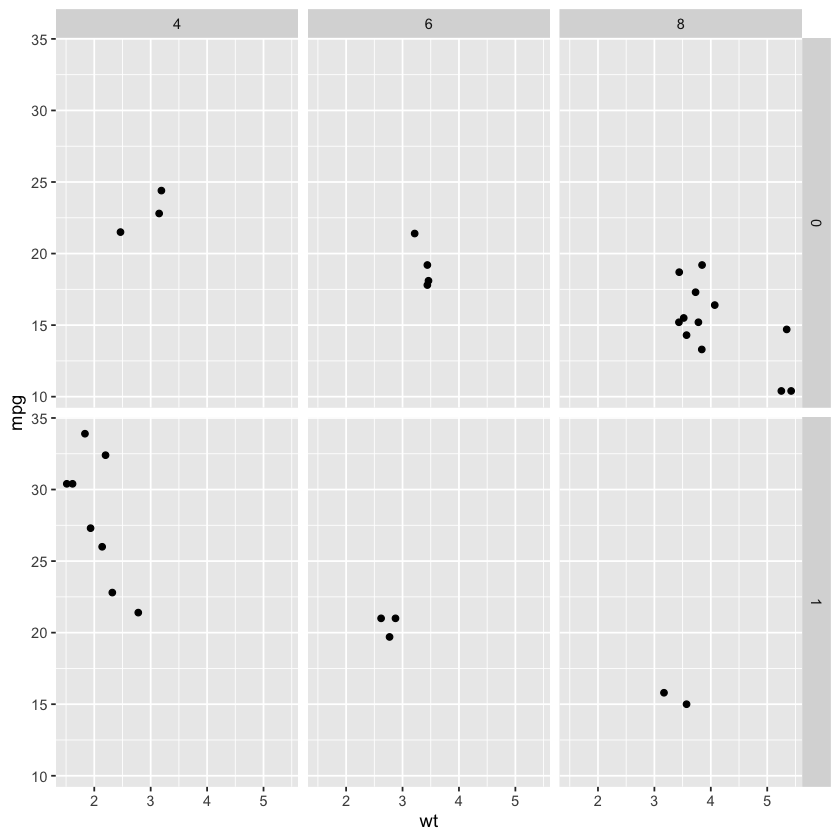

In [22]:
ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet rows by am
  facet_grid(rows = vars(am))

ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet columns by cyl
  facet_grid(cols = vars(cyl))

ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet rows by am and columns by cyl
  facet_grid(rows = vars(am), cols = vars(cyl))


### Many variables

In addition to aesthetics, facets are another way of encoding factor
(i.e. categorical) variables. They can be used to reduce the complexity
of plots with many variables.

Our goal is the plot in the viewer, which contains 7 variables.

Two variables are mapped onto the color aesthetic, using hue and
lightness. To achieve this we combined `fcyl` and `fam` into a single
[interaction](https://www.rdocumentation.org/packages/base/topics/interaction)
variable, `fcyl_fam`. This will allow us to take advantage of Color
Brewer's *Paired* color palette.

-   Map `fcyl_fam` onto the a `color` aesthetic.
-   Add a `scale_color_brewer()` layer and set `"Paired"` as the
    `palette`.

<!-- -->

-   Map `disp`, the displacement volume from each cylinder, onto the
    `size` aesthetic.

Add a `facet_grid()` layer, faceting the plot according to `gear` on
rows and `vs` on columns.


[1] 6:1 6:1 4:1 6:0 8:0 6:0 8:0 4:0 4:0 6:0 6:0 8:0 8:0 8:0 8:0 8:0 8:0 4:1 4:1
[20] 4:1 4:0 8:0 8:0 8:0 8:0 4:1 4:1 4:1 8:1 6:1 8:1 4:1
Levels: 4:0 6:0 8:0 4:1 6:1 8:1

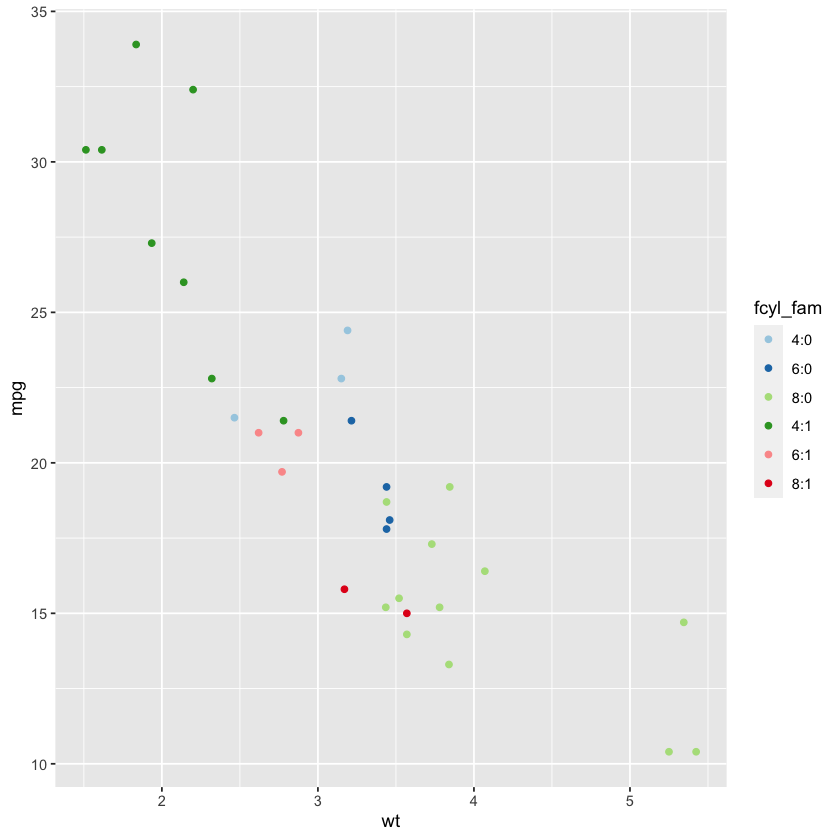

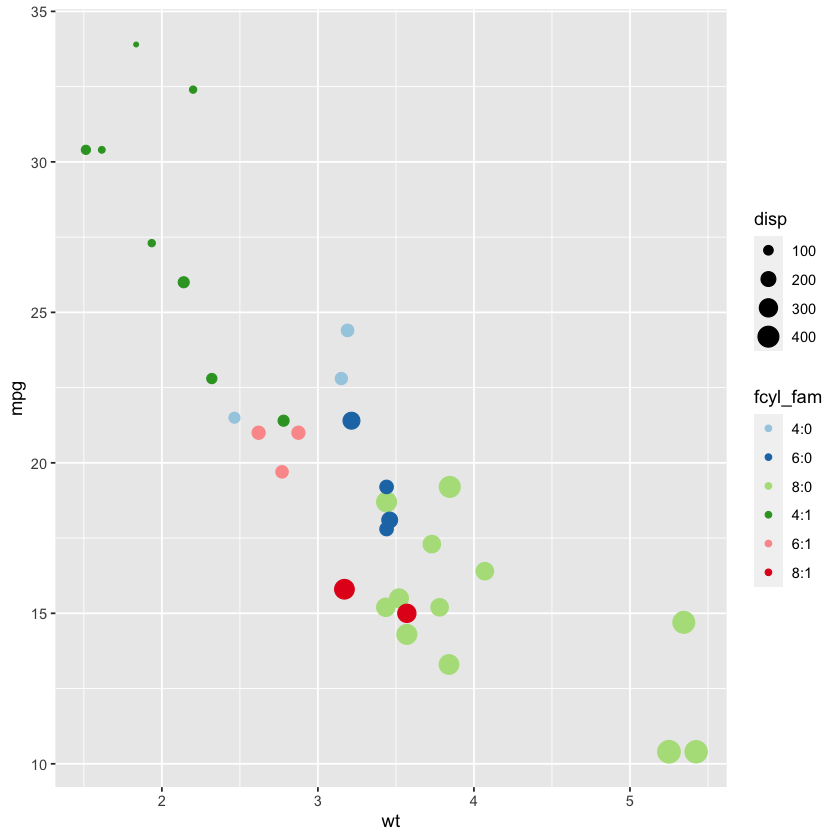

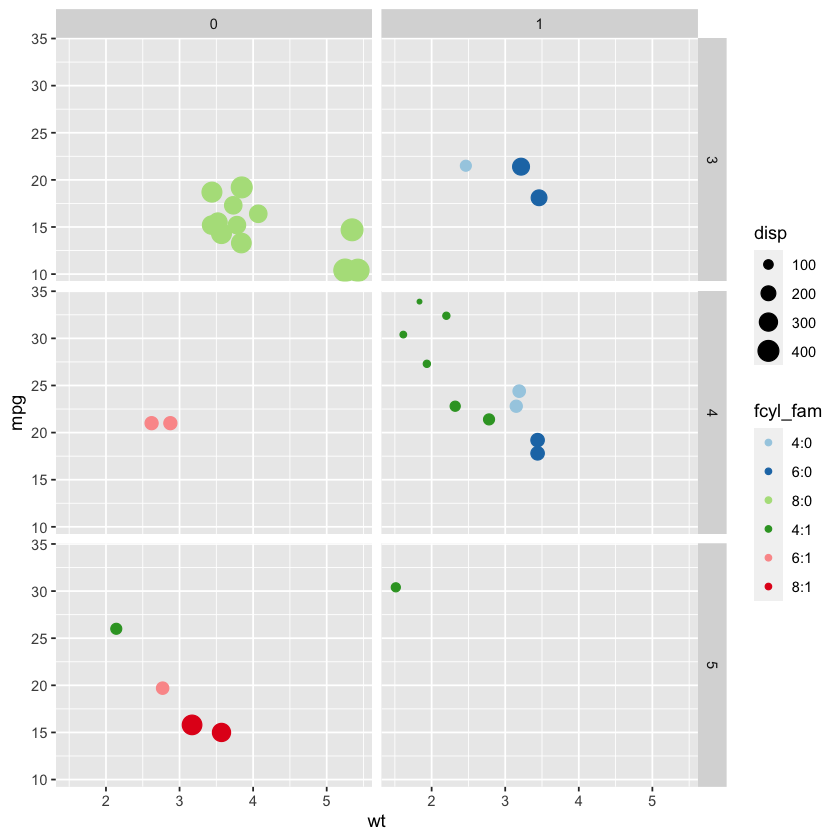

In [23]:
# edited/added
mtcars <- mtcars %>% 
  mutate(fcyl_fam = interaction(fcyl, fam, sep=":"))

# See the interaction column
mtcars$fcyl_fam

# Color the points by fcyl_fam
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl_fam)) +
  geom_point() +
  # Use a paired color palette
  scale_color_brewer(palette = "Paired")

# Update the plot to map disp to size
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl_fam, size = disp)) +
  geom_point() +
  scale_color_brewer(palette = "Paired")

# Update the plot
ggplot(mtcars, aes(x = wt, y = mpg, color = fcyl_fam, size = disp)) +
  geom_point() +
  scale_color_brewer(palette = "Paired") +
  # Grid facet on gear and vs
  facet_grid(rows = vars(gear), cols = vars(vs))


### Formula notation

As well as the `vars()` notation for specifying which variables should
be used to split the dataset into facets, there is also a traditional
formula notation. The three cases are shown in the table.

    | Modern notation                            | Formula notation  |
    |--------------------------------------------|-------------------|
    | facet_grid(rows = vars(A))                 | facet_grid(A ~ .) |
    | facet_grid(cols = vars(B))                 | facet_grid(. ~ B) |
    | facet_grid(rows = vars(A), cols = vars(B)) | facet_grid(A ~ B) |

`mpg_by_wt` is available again. Rework the previous plots, this time
using formula notation.

-   Facet the plot in a grid, with each `am` value in its own row.

<!-- -->

-   Facet the plot in a grid, with each `cyl` value in its own column.

<!-- -->

-   Facet the plot in a grid, with each `am` value in its own row and
    each `cyl` value in its own column.


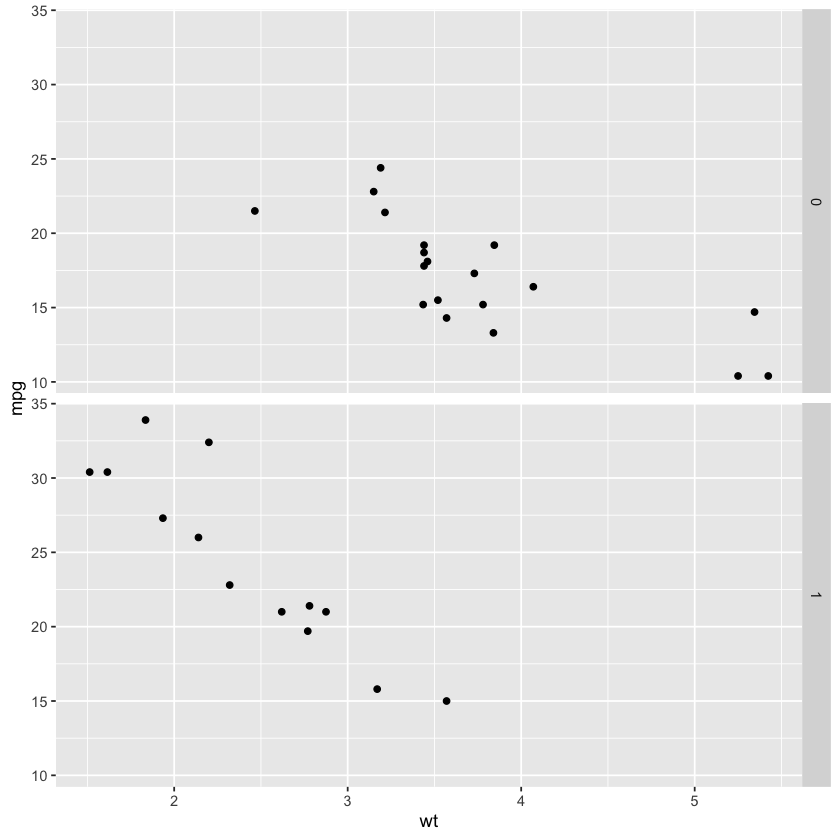

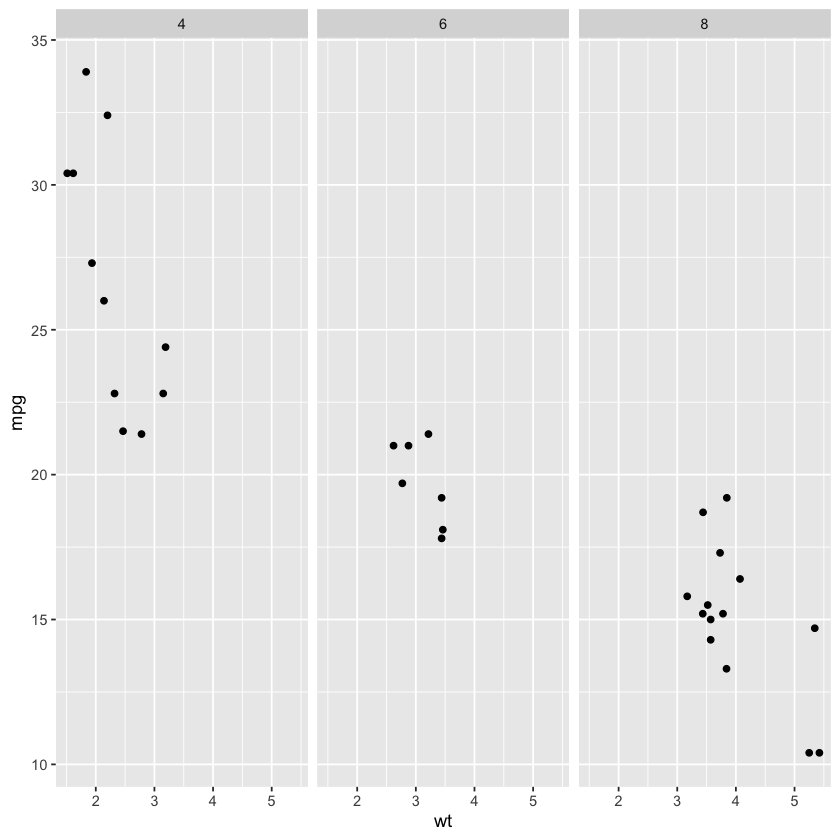

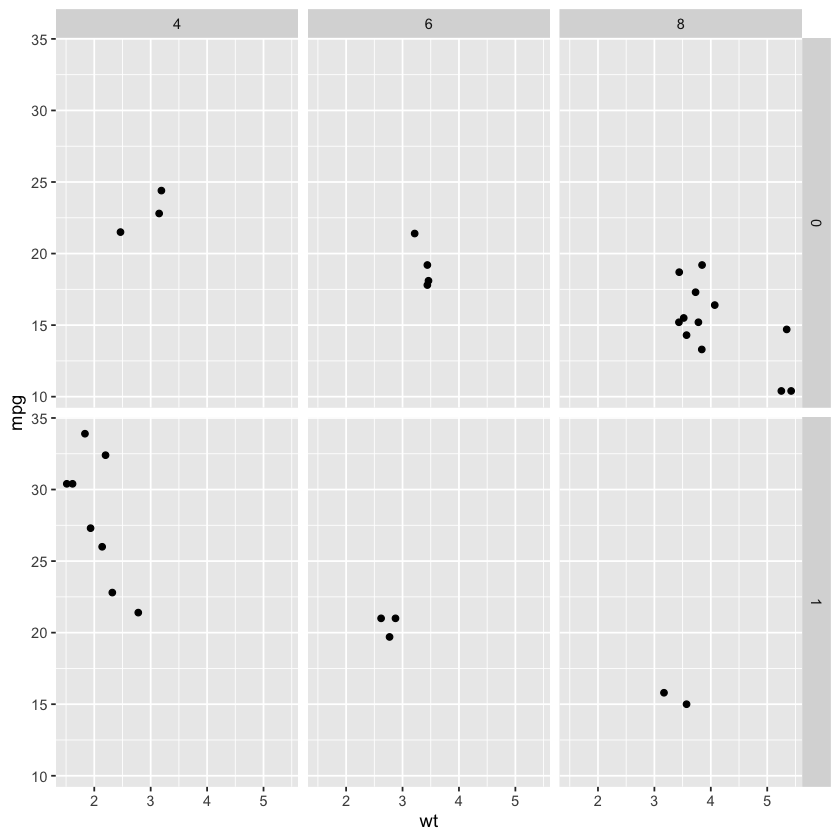

In [24]:
ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet rows by am using formula notation
  facet_grid(am ~ .)

ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet columns by cyl using formula notation
  facet_grid(. ~ cyl)

ggplot(mtcars, aes(wt, mpg)) + 
  geom_point() +
  # Facet rows by am and columns by cyl using formula notation
  facet_grid(am ~ cyl)


## Facet labels and order

### Labeling facets

If your factor levels are not clear, your facet labels may be confusing.
You can assign proper labels in your original data *before* plotting
(see next exercise), or you can use the `labeller` argument in the facet
layer.

The default value is

-   `label_value`: Default, displays only the value

Common alternatives are:

-   `label_both`: Displays both the value and the variable name
-   `label_context`: Displays only the values or both the values and
    variables depending on whether multiple factors are faceted

<!-- -->

-   Add a `facet_grid()` layer and facet `cols` according to the `cyl`
    using `vars()`. There is no labeling.

<!-- -->

-   Apply `label_both` to the `labeller` argument and check the output.

<!-- -->

-   Apply `label_context` to the `labeller` argument and check the
    output.

<!-- -->

-   In addition to `label_context`, let's facet by one more variable:
    `vs`.


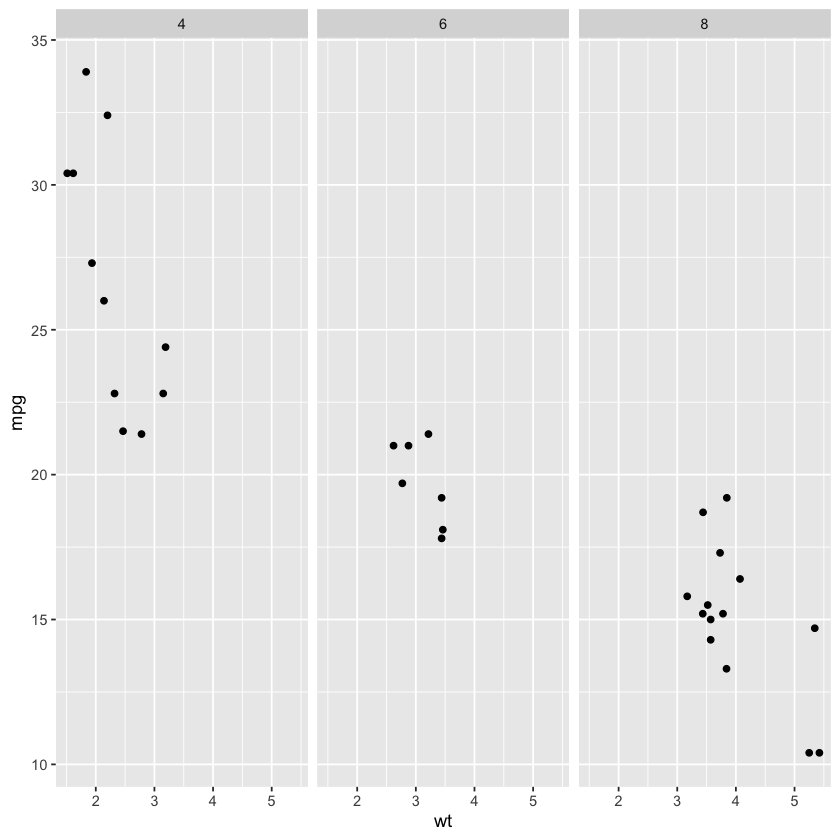

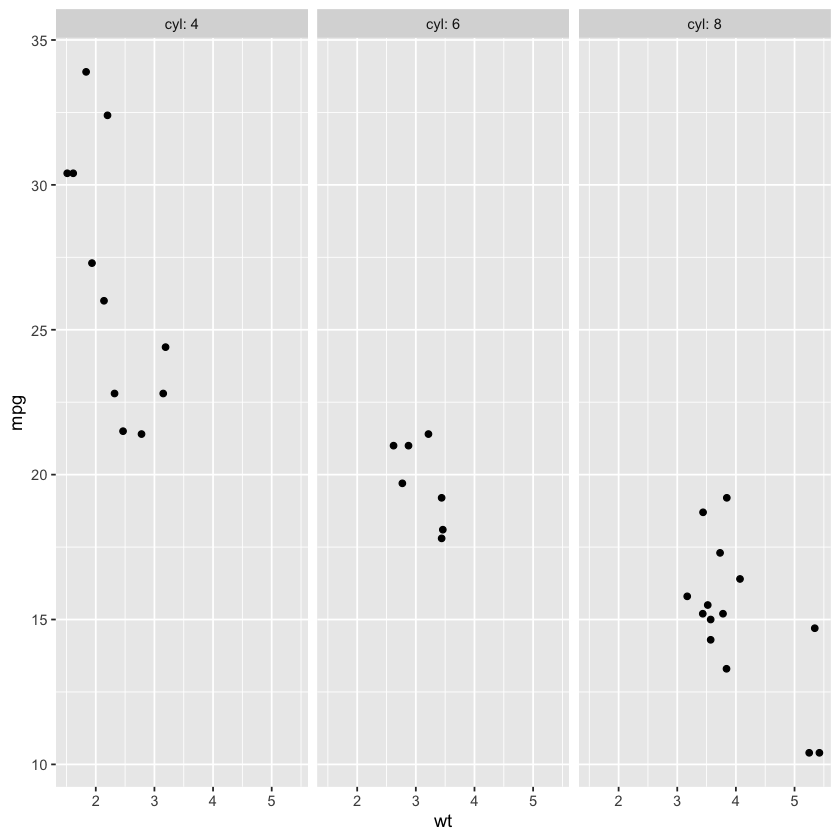

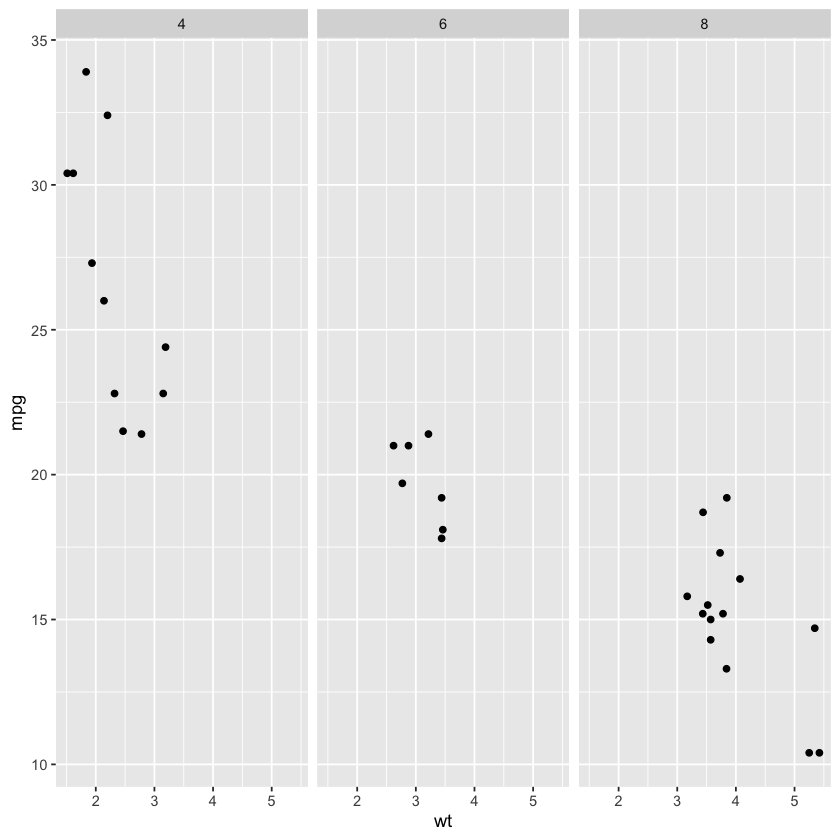

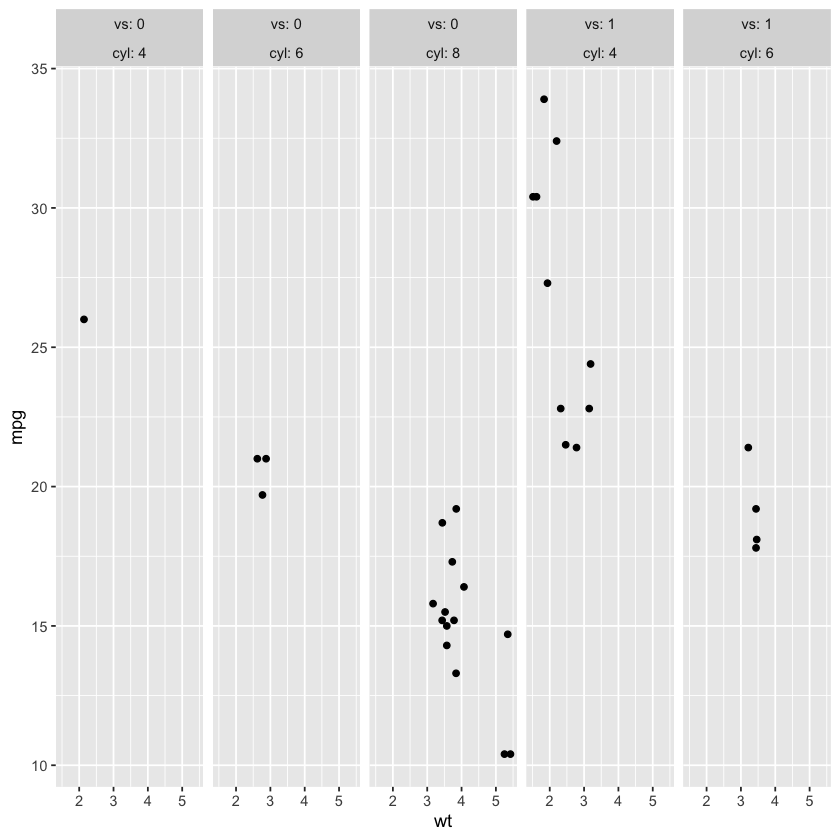

In [25]:
# Plot wt by mpg
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  # The default is label_value
  facet_grid(cols = vars(cyl))

# Plot wt by mpg
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  # Displaying both the values and the variables
  facet_grid(cols = vars(cyl), labeller = label_both)

# Plot wt by mpg
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  # Label context
  facet_grid(cols = vars(cyl), labeller = label_context)

# Plot wt by mpg
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  # Two variables
  facet_grid(cols = vars(vs, cyl), labeller = label_context)


### Setting order

If you want to change the order of your facets, it's best to properly
define your factor variables *before* plotting.

Let's see this in action with the `mtcars` transmission variable `am`.
In this case, `0` = "automatic" and `1` = "manual".

Here, we'll make `am` a factor variable and relabel the numbers to
proper names. The default order is alphabetical. To rearrange them we'll
call `fct_rev()` from the `forcats` package to reverse the order.

-   Explicitly label the `0` and `1` values of the `am` column as
    `"automatic"` and `"manual"`, respectively.

<!-- -->

-   Define a specific order using separate `levels` and `labels`
    arguments. Recall that `1` is `"manual"` and `0` is `"automatic"`.


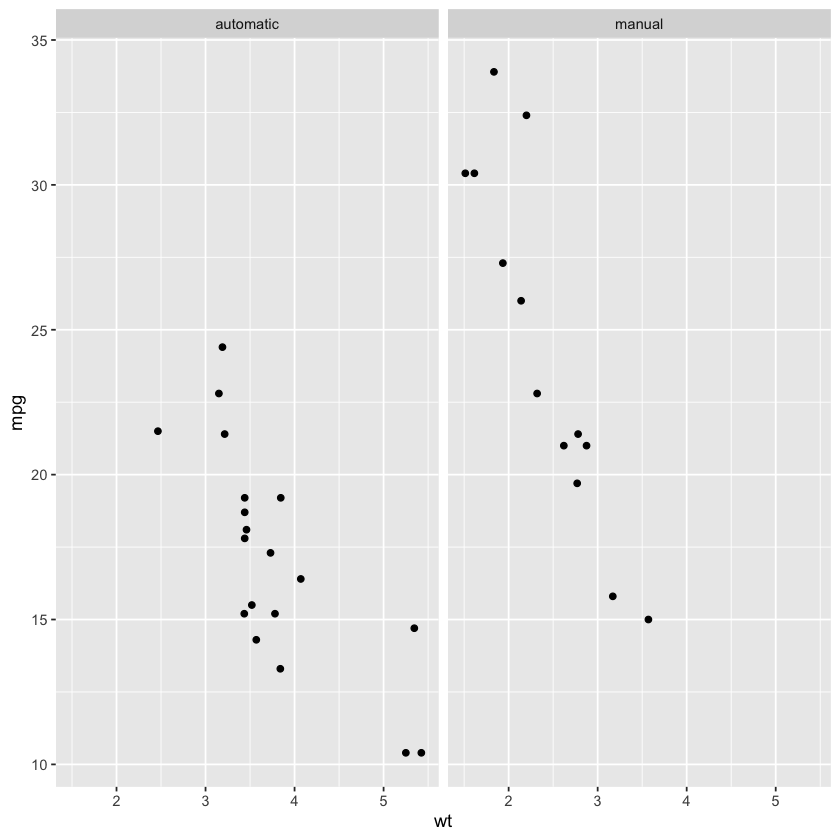

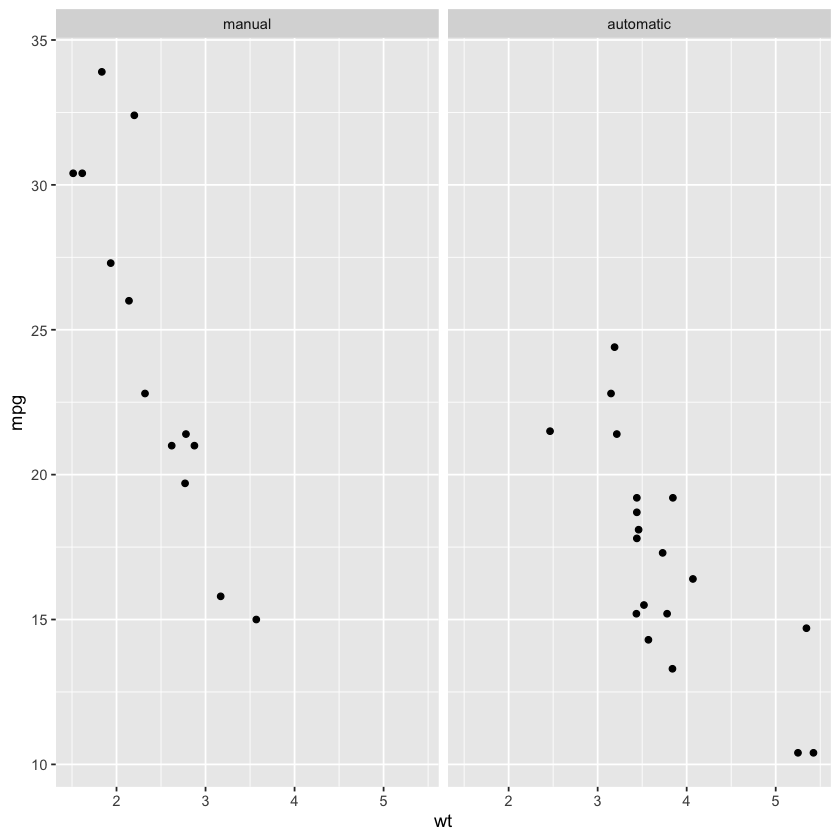

In [26]:
# Make factor, set proper labels explictly
mtcars$fam <- factor(mtcars$am,
                     labels = c(`0` = "automatic",
                                `1` = "manual"))

# Default order is alphabetical
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  facet_grid(cols = vars(fam))

# Make factor, set proper labels explictly, and
# manually set the label order
mtcars$fam <- factor(mtcars$am,
                     levels = c(1, 0),
                     labels = c("manual", "automatic"))

# View again
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() +
  facet_grid(cols = vars(fam))


## Facet plotting spaces

### Variable plotting spaces I: continuous variables

By default every facet of a plot has the same axes. If the data ranges
vary wildly between facets, it can be clearer if each facet has its own
scale. This is achieved with the `scales` argument to `facet_grid()`.

-   `"fixed"` (default): axes are shared between facets.
-   `free`: each facet has its own axes.
-   `free_x`: each facet has its own x-axis, but the y-axis is shared.
-   `free_y`: each facet has its own y-axis, but the x-axis is shared.

When faceting by columns, `"free_y"` has no effect, but we can adjust
the x-axis. In contrast, when faceting by rows, `"free_x"` has no
effect, but we can adjust the y-axis.

-   Update the plot to facet columns by `cyl`.

<!-- -->

-   Update the faceting to free the x-axis scales.

<!-- -->

-   Facet **rows** by `cyl` (rather than columns).
-   Free the **y**-axis scales (instead of x).


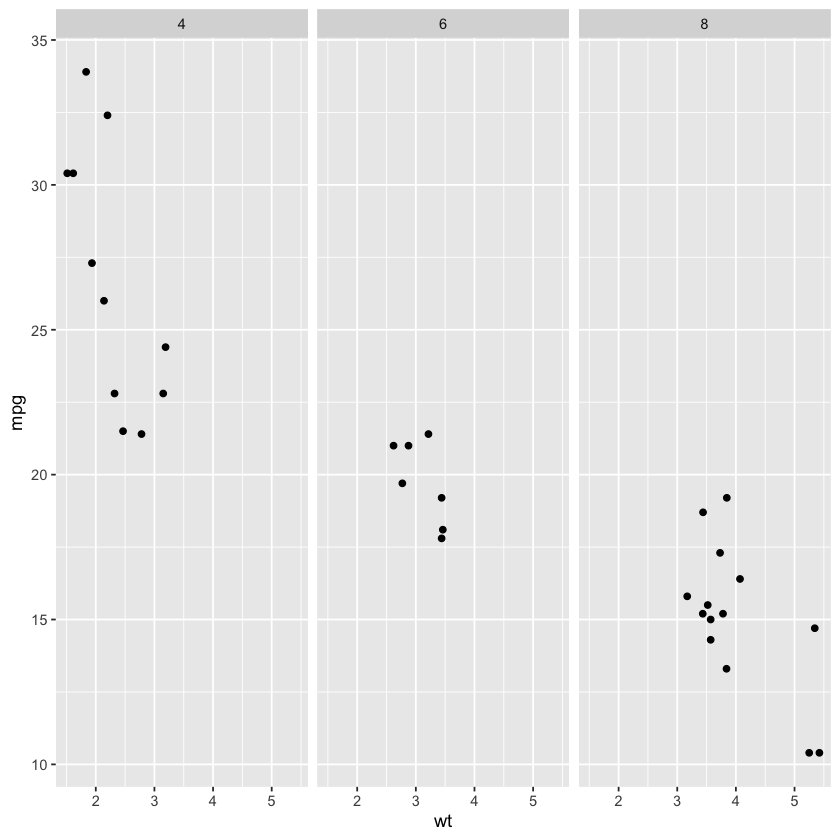

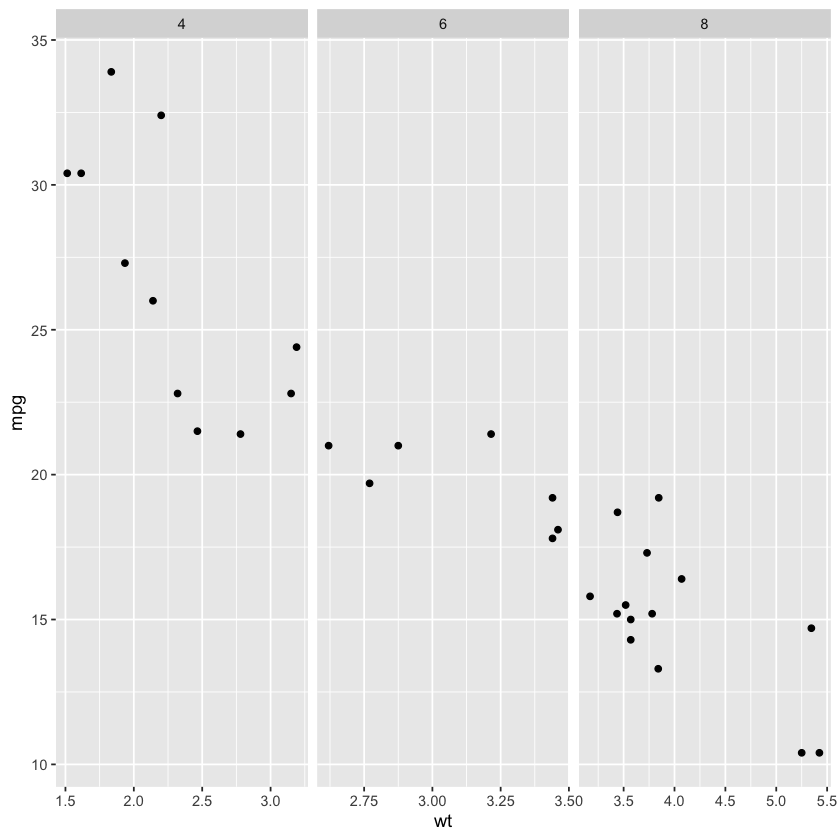

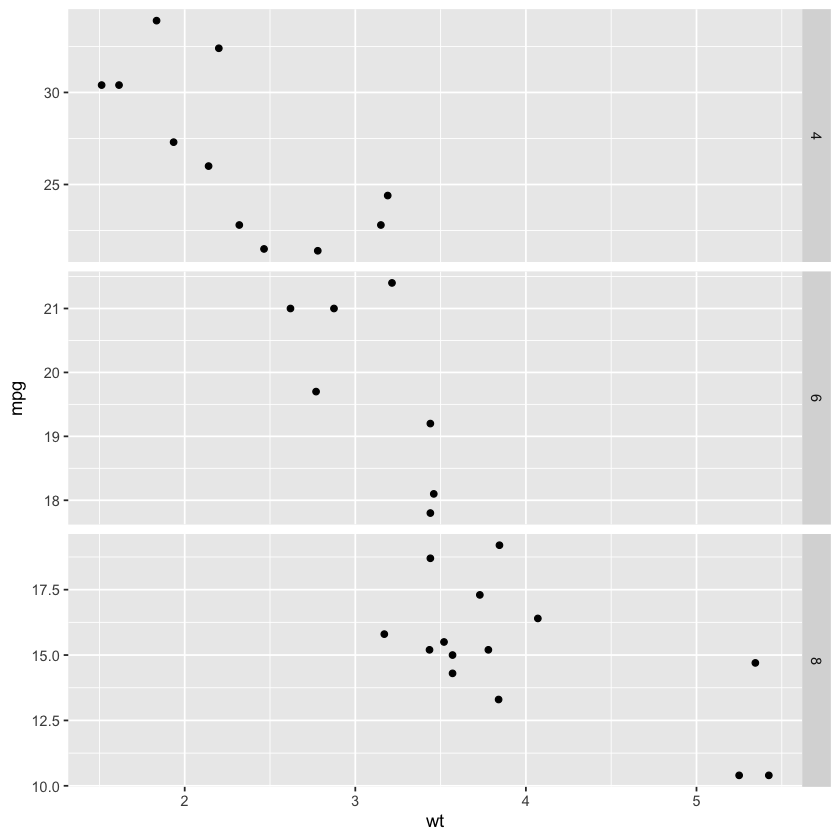

In [27]:
ggplot(mtcars, aes(wt, mpg)) +
  geom_point() + 
  # Facet columns by cyl 
  facet_grid(cols = vars(cyl))

ggplot(mtcars, aes(wt, mpg)) +
  geom_point() + 
  # Update the faceting to free the x-axis scales
  facet_grid(cols = vars(cyl), scales = "free_x")

ggplot(mtcars, aes(wt, mpg)) +
  geom_point() + 
  # Update the faceting to free the y-axis scales
  facet_grid(rows = vars(cyl), scales = "free_y")


### Variable plotting spaces II: categorical variables

When you have a categorical variable with many levels which are not all
present in each sub-group of another variable, it's usually desirable to
drop the unused levels.

By default, each facet of a plot is the same size. This behavior can be
changed with the `spaces` argument, which works in the same way as
`scales`: `"free_x"` allows different sized facets on the x-axis,
`"free_y"`, allows different sized facets on the y-axis, `"free"` allows
different sizes in both directions.

-   Facet the plot by rows according to `gear` using `vars()`. Notice
    that *every* car is listed in *every* facet, resulting in many lines
    without data.

<!-- -->

-   To remove blank lines, set the `scales` and `space` arguments in
    `facet_grid()` to `free_y`.


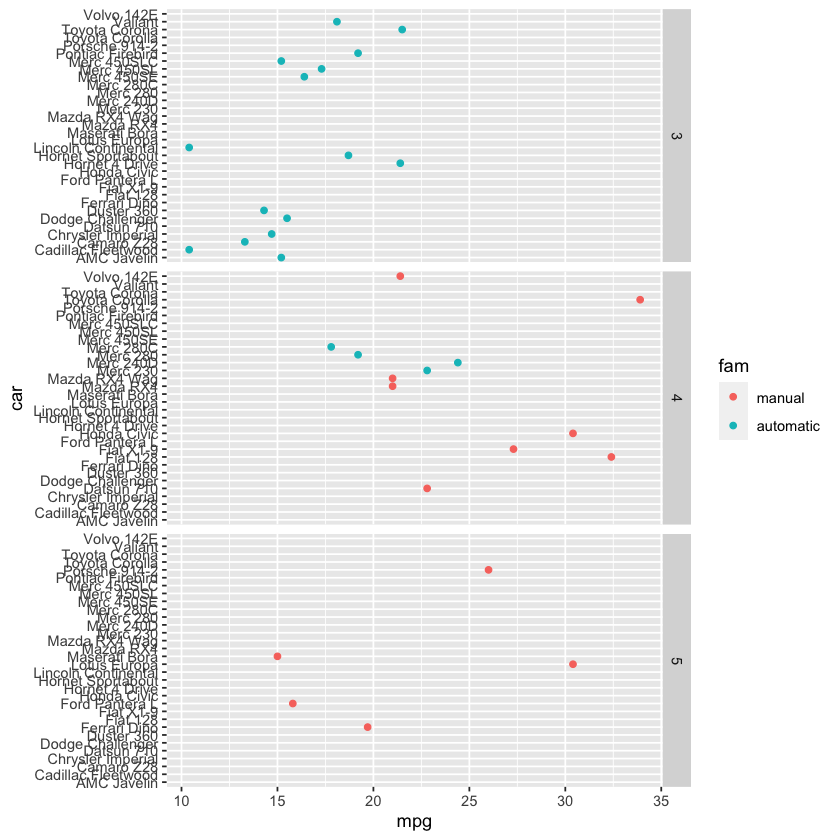

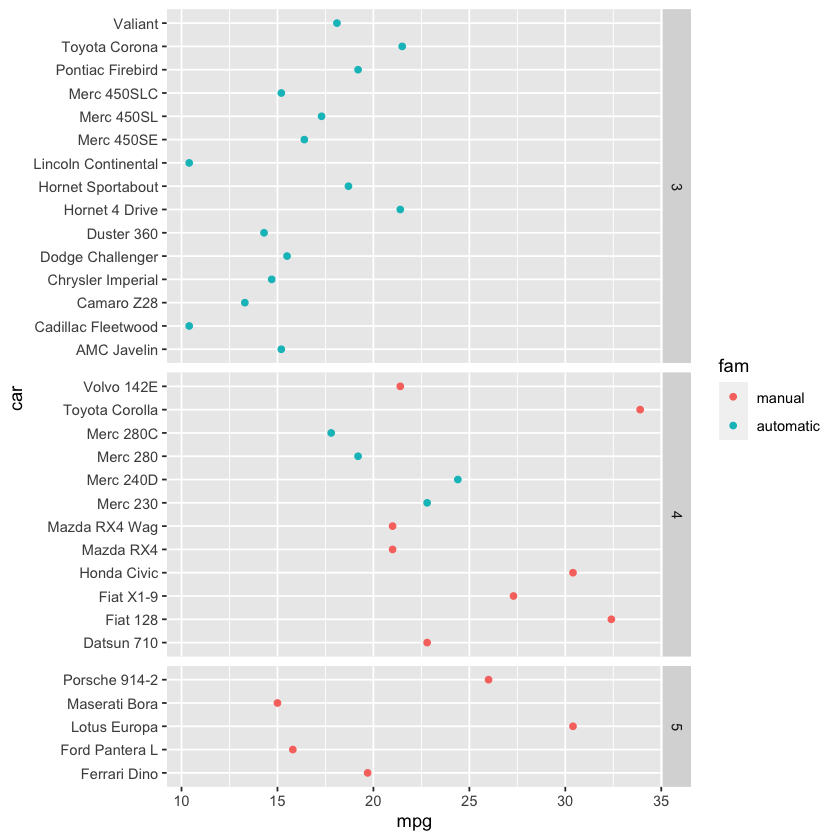

In [28]:
ggplot(mtcars, aes(x = mpg, y = car, color = fam)) +
  geom_point() +
  # Facet rows by gear
  facet_grid(rows = vars(gear))

ggplot(mtcars, aes(x = mpg, y = car, color = fam)) +
  geom_point() +
  # Free the y scales and space
  facet_grid(rows = vars(gear), scales = "free_y", space = "free_y")


## Facet wrap & margins

### Wrapping for many levels

`facet_grid()` is fantastic for categorical variables with a small
number of levels. Although it is possible to facet variables with many
levels, the resulting plot will be very wide or very tall, which can
make it difficult to view.

The solution is to use `facet_wrap()` which separates levels along one
axis but wraps all the subsets across a given number of rows or columns.

For this plot, we'll use the `Vocab` dataset that we've already seen.
The base layer is provided.

Since we have many `years`, it doesn't make sense to use `facet_grid()`,
so let's try `facet_wrap()` instead.

Add a facet_wrap() layer and specify:

-   The `year` variable with an argument using the `vars()` function,

Add a `facet_wrap()` layer and specify the `year` variable with a
formula notation (`~`).

Add a `facet_wrap()` layer and specify:

-   Formula notation as before, and `ncol` set to `11`.


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


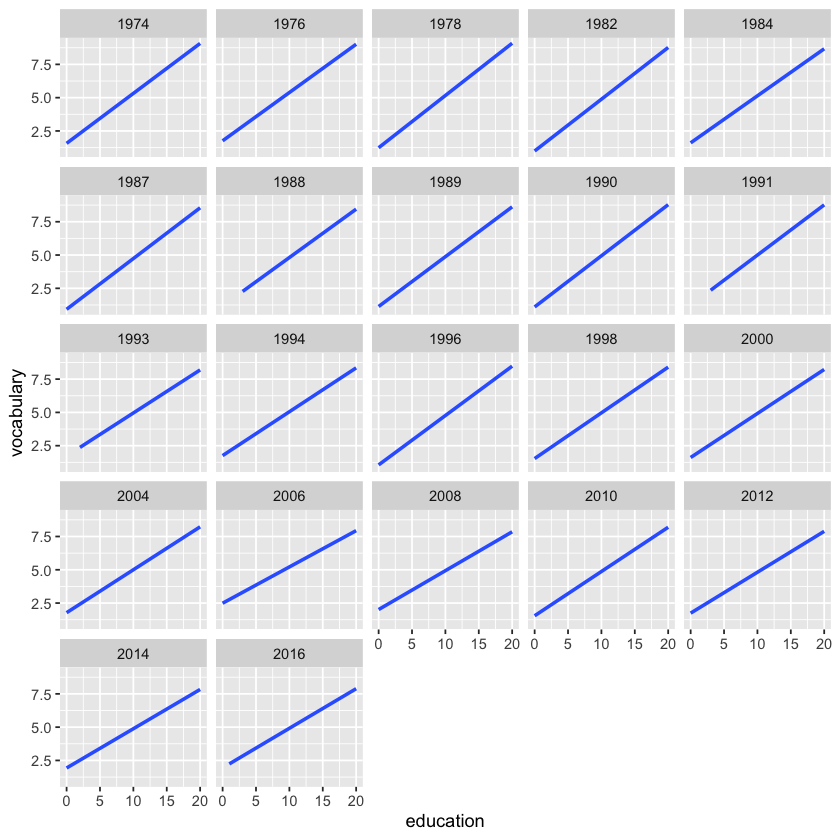

`geom_smooth()` using formula = 'y ~ x'


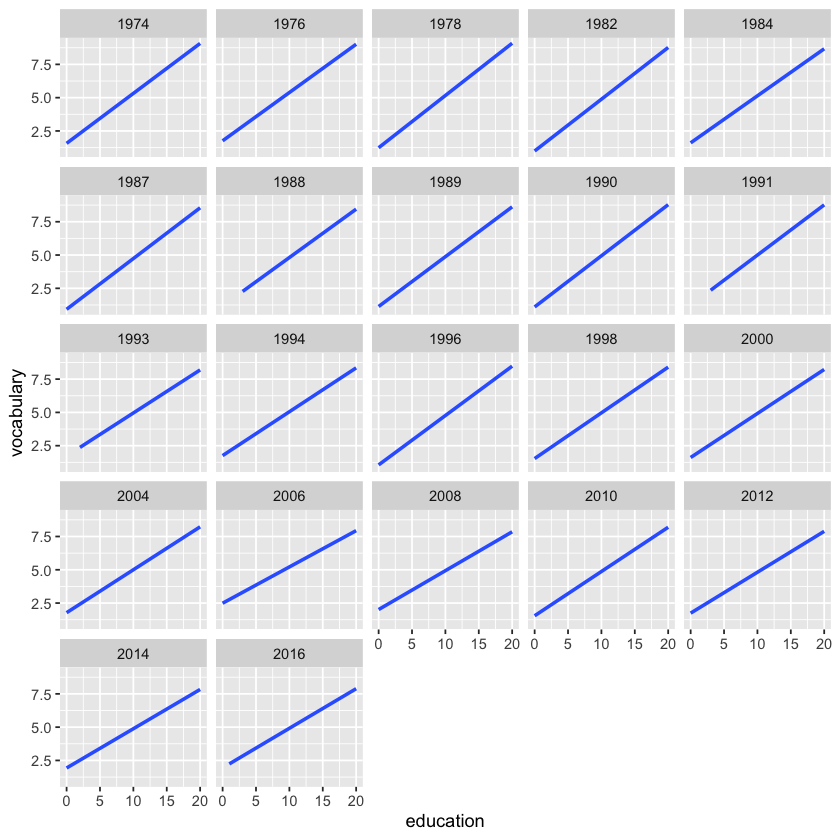

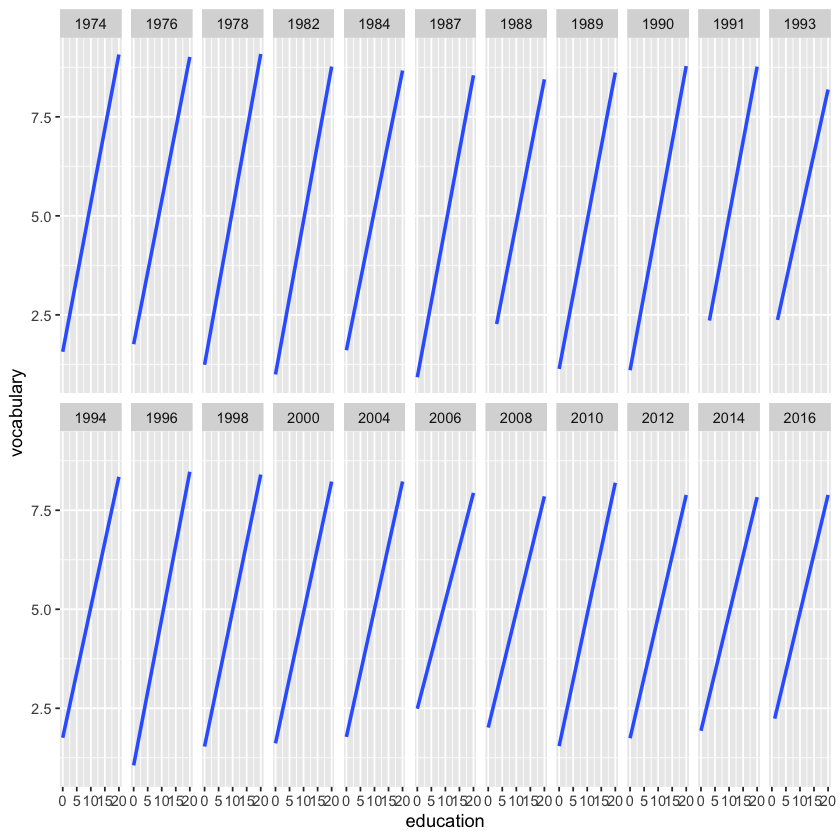

In [29]:
ggplot(Vocab, aes(x = education, y = vocabulary)) +
  stat_smooth(method = "lm", se = FALSE) +
  # Create facets, wrapping by year, using vars()
  facet_wrap(vars(year))

ggplot(Vocab, aes(x = education, y = vocabulary)) +
  stat_smooth(method = "lm", se = FALSE) +
  # Create facets, wrapping by year, using a formula
  facet_wrap(~ year)

ggplot(Vocab, aes(x = education, y = vocabulary)) +
  stat_smooth(method = "lm", se = FALSE) +
  # Update the facet layout, using 11 columns
  facet_wrap(~ year, ncol = 11)


### Margin plots

Facets are great for seeing subsets in a variable, but sometimes you
want to see *both* those subsets *and* all values in a variable.

Here, the `margins` argument to `facet_grid()` is your friend.

-   `FALSE` (default): no margins.
-   `TRUE`: add margins to every variable being faceted by.
-   `c("variable1", "variable2")`: only add margins to the variables
    listed.

To make it easier to follow the facets, we've created two factor
variables with proper labels — `fam` for the transmission type, and
`fvs` for the engine type, respectively.

*Zoom the graphics window to better view your plots.*

Update the plot to facet the rows by `fvs` and `fam`, and columns by
`gear`.

Add all possible margins to the plot.

Update the facets to only show margins on `"fam"`.

Update the facets to only show margins on `"gear"` and `"fvs"`.


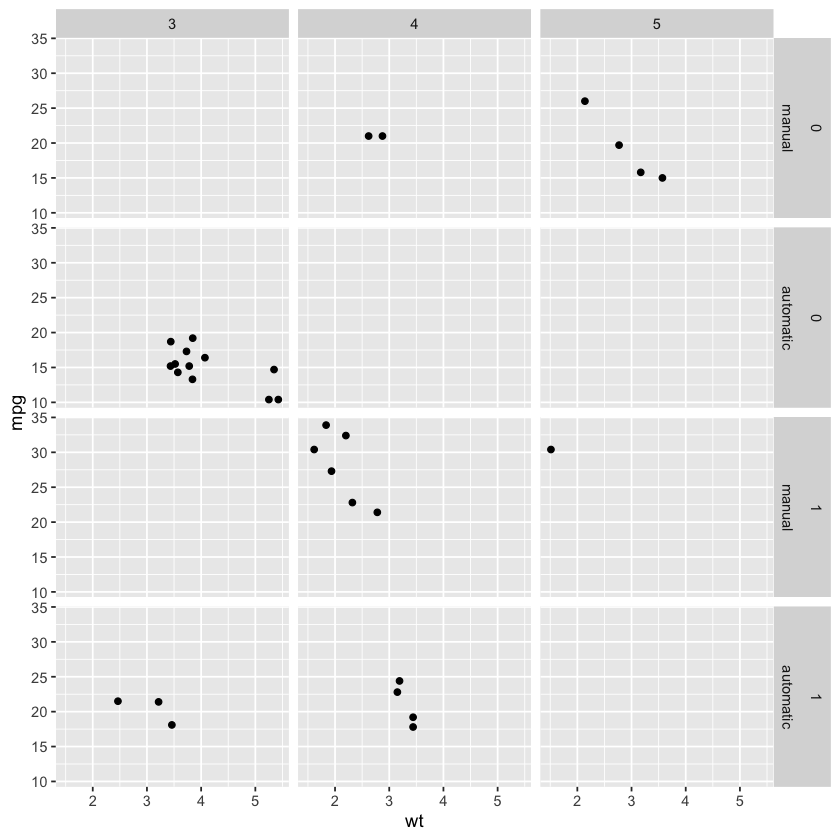

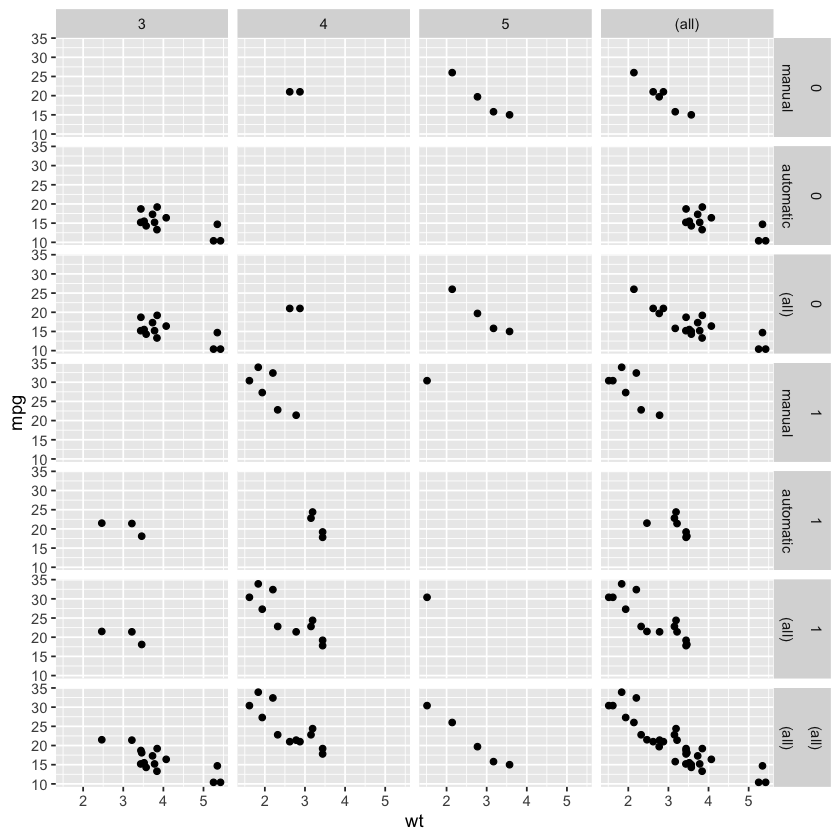

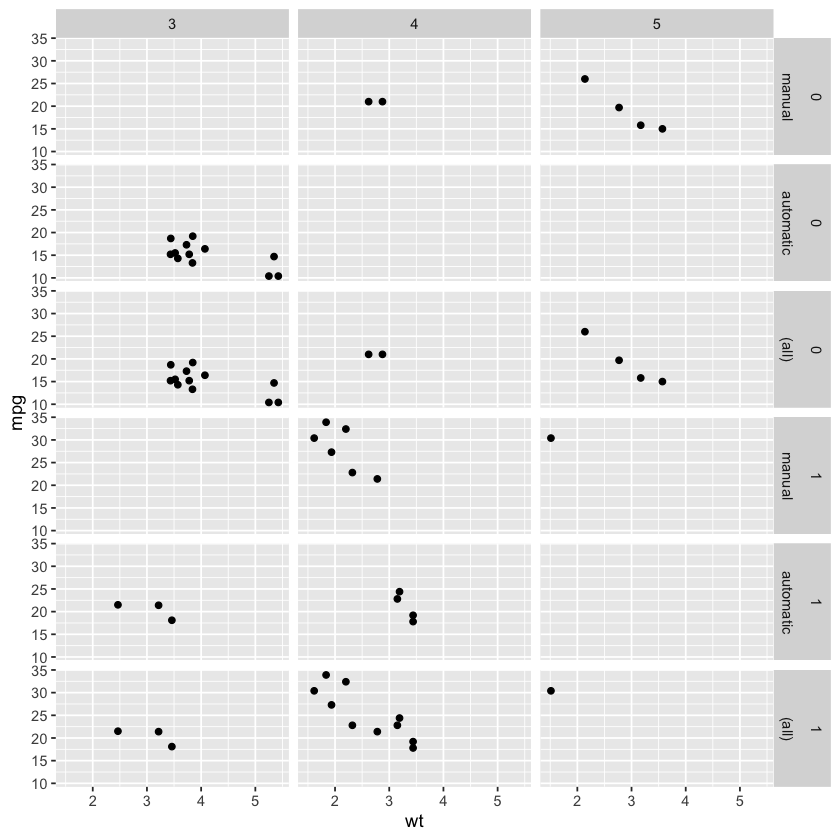

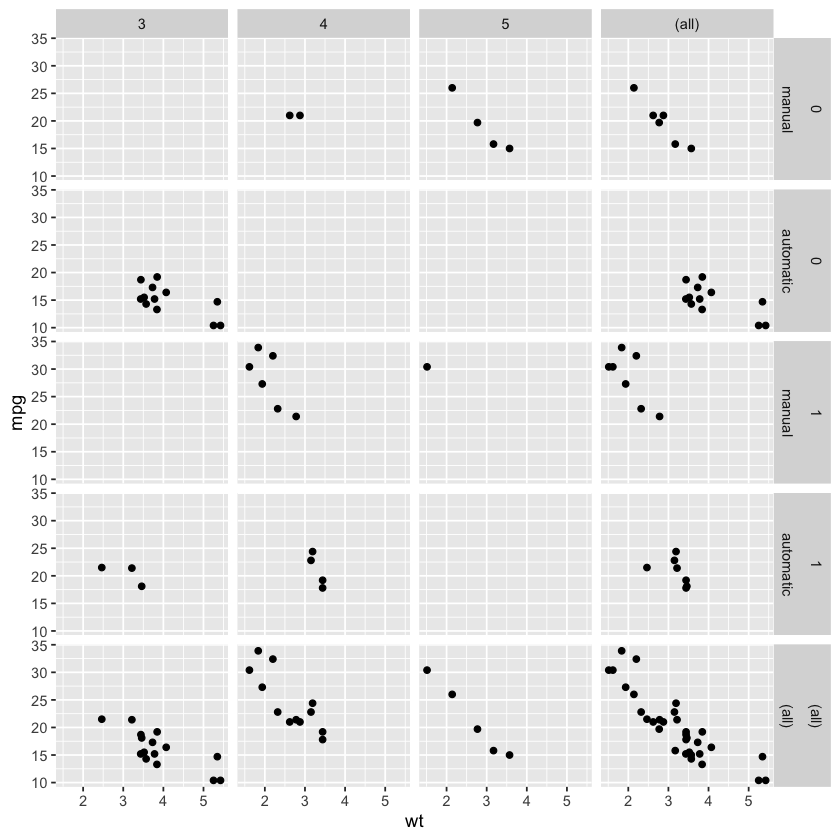

In [30]:
ggplot(mtcars, aes(x = wt, y = mpg)) + 
  geom_point() +
  # Facet rows by fvs and fam, and cols by gear
  facet_grid(rows = vars(fvs, fam), cols = vars(gear))

ggplot(mtcars, aes(x = wt, y = mpg)) + 
  geom_point() +
  # Update the facets to add margins
  facet_grid(rows = vars(fvs, fam), cols = vars(gear), margins = TRUE)

ggplot(mtcars, aes(x = wt, y = mpg)) + 
  geom_point() +
  # Update the facets to only show margins on fam
  facet_grid(rows = vars(fvs, fam), cols = vars(gear), margins = "fam")

ggplot(mtcars, aes(x = wt, y = mpg)) + 
  geom_point() +
  # Update the facets to only show margins on gear and fvs
  facet_grid(rows = vars(fvs, fam), cols = vars(gear), margins = c("gear", "fvs"))


# Best Practices

Now that you have the technical skills to make great visualizations, it’s important that you make them as meaningful as possible. In this chapter, you’ll review three plot types that are commonly discouraged in the data viz community: heat maps, pie charts, and dynamite plots. You’ll learn the pitfalls with these plots and how to avoid making these mistakes yourself.

## Best practices: bar plots

### Bar plots: dynamite plots

In the video we saw many reasons why "dynamite plots" (bar plots with
error bars) are *not* well suited for their intended purpose of
depicting distributions. If you *really* want error bars on bar plots,
you can of course get them, but you'll need to set the positions
manually. A point geom will typically serve you much better.

Nonetheless, you should know how to handle these kinds of plots, so
let's give it a try.

-   Using `mtcars,`, plot `wt` versus `fcyl`.
-   Add a bar summary stat, aggregating the `wt`s by their mean, filling
    the bars in a skyblue color.
-   Add an errorbar summary stat, aggregating the `wt`s by `mean_sdl`.


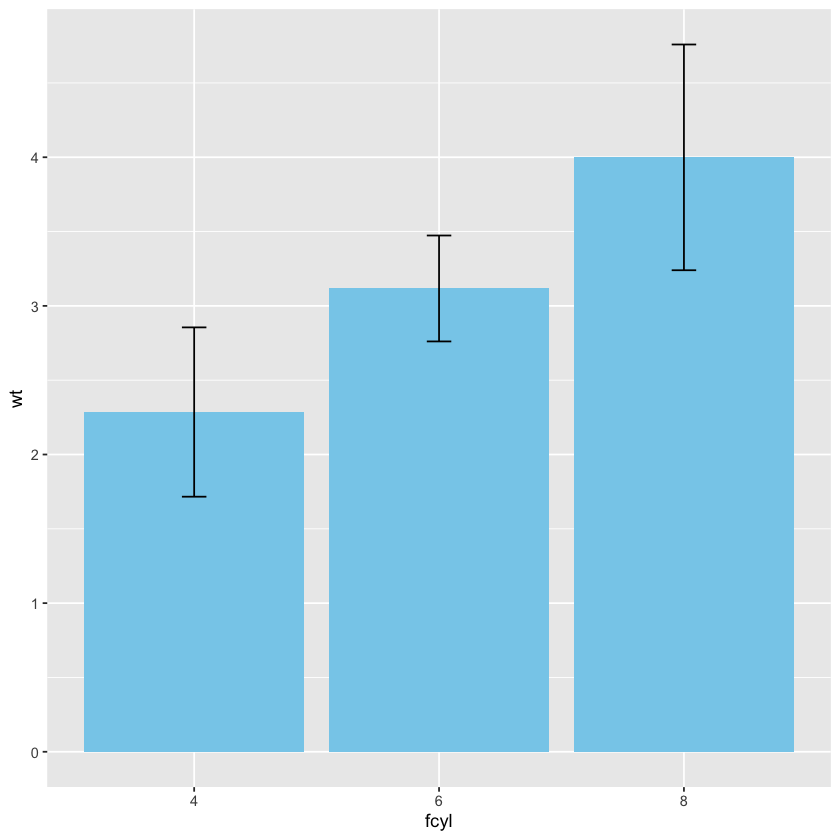

In [31]:
# Plot wt vs. fcyl
ggplot(mtcars, aes(x = fcyl, y = wt)) +
  # Add a bar summary stat of means, colored skyblue
  stat_summary(fun = mean, geom = "bar", fill = "skyblue") +
  # Add an errorbar summary stat std deviation limits
  stat_summary(fun.data = mean_sdl, fun.args = list(mult = 1), geom = "errorbar", width = 0.1)


### Bar plots: position dodging

In the previous exercise we used the `mtcars` dataset to draw a dynamite
plot about the weight of the cars per cylinder type.

In this exercise we will add a distinction between transmission type,
`fam`, for the dynamite plots and explore position dodging (where bars
are side-by-side).

Add two more aesthetics so the bars are `color`ed and `fill`ed by `fam`.

The stacked bars are tricky to interpret. Make them transparent and side-by-side.

-   Make the bar summary statistic transparent by setting `alpha` to `0.5`.
-   For each of the summary statistics, set the bars' position to `"dodge"`.

The error bars are incorrectly positioned. Use a position object.

-   Define a dodge position object with width `0.9`, assigned to `posn_d`.
-   For each of the summary statistics, set the bars' position to `posn_d`.


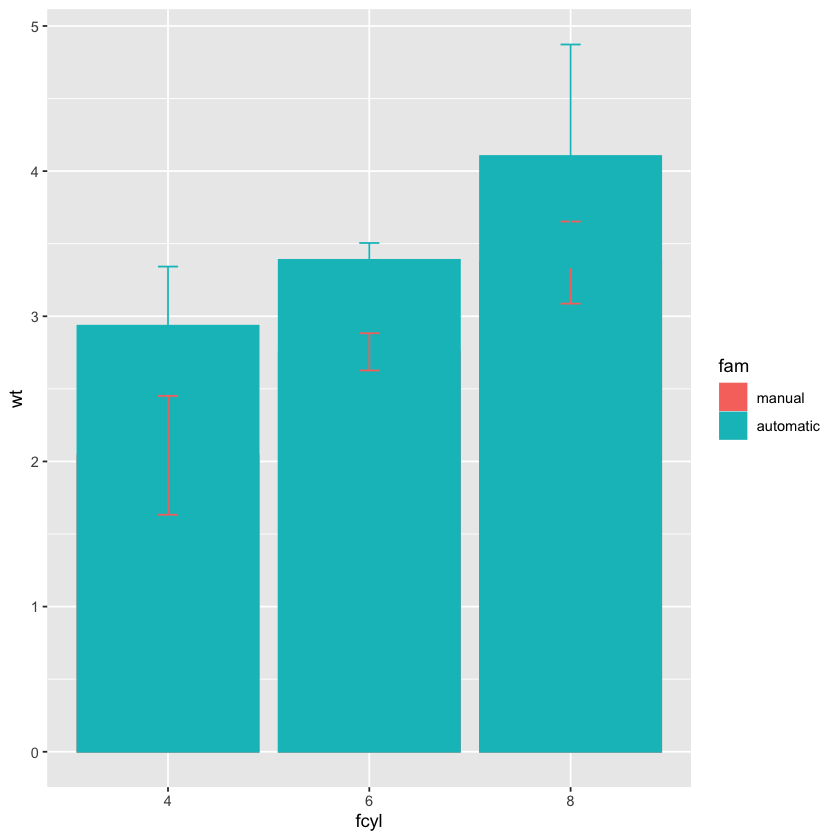

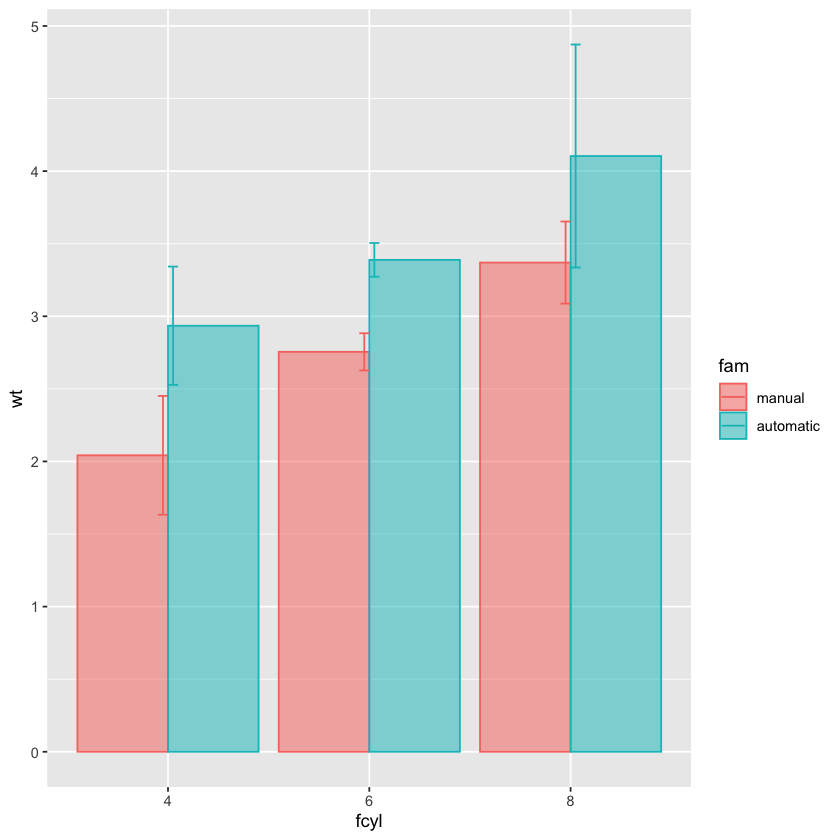

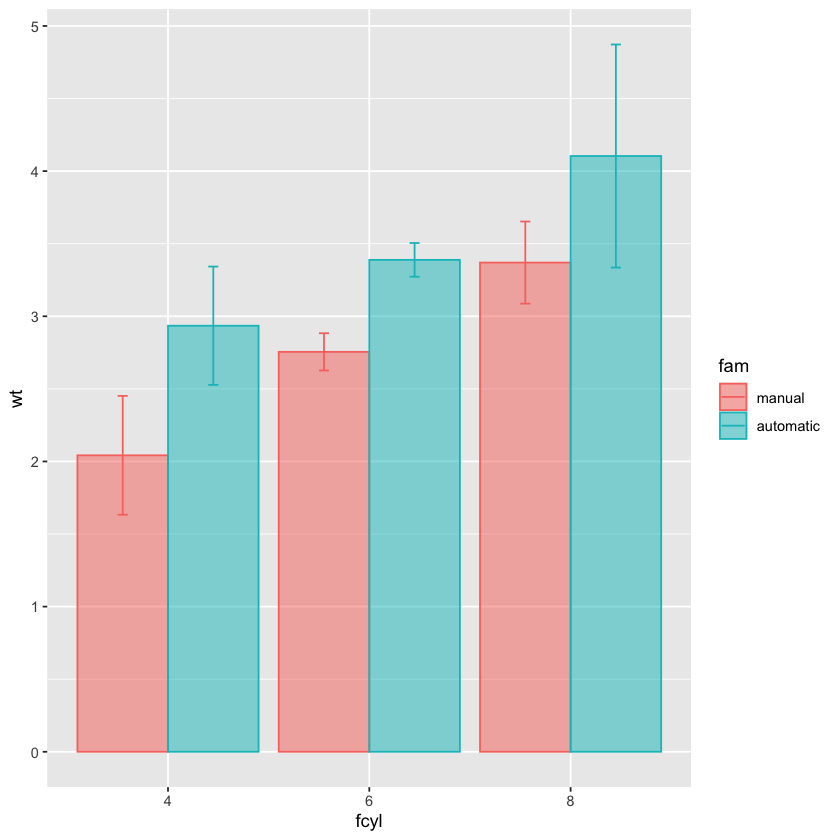

In [32]:
# Update the aesthetics to color and fill by fam
ggplot(mtcars, aes(x = fcyl, y = wt, color = fam, fill = fam)) +
  stat_summary(fun = mean, geom = "bar") +
  stat_summary(fun.data = mean_sdl, fun.args = list(mult = 1), geom = "errorbar", width = 0.1)

# For each summary stat, set the position to dodge
ggplot(mtcars, aes(x = fcyl, y = wt, color = fam, fill = fam)) +
  stat_summary(fun = mean, geom = "bar", position = "dodge", alpha = 0.5) +
  stat_summary(fun.data = mean_sdl, fun.args = list(mult = 1), geom = "errorbar", position = "dodge", width = 0.1)

# Define a dodge position object with width 0.9
posn_d <- position_dodge(width = 0.9)

# For each summary stat, update the position to posn_d
ggplot(mtcars, aes(x = fcyl, y = wt, color = fam, fill = fam)) +
  stat_summary(fun = mean, geom = "bar", position = posn_d, alpha = 0.5) +
  stat_summary(fun.data = mean_sdl, fun.args = list(mult = 1), geom = "errorbar", position = posn_d, width = 0.1)


### Bar plots: Using aggregated data

If it *is* appropriate to use bar plots (see the video!), then it nice
to give an impression of the number of values in each group.

`stat_summary()` doesn't keep track of the count. `stat_sum()` does
(that's the whole point), but it's difficult to access. It's more
straightforward to calculate exactly what we want to plot ourselves.

Here, we've created a summary data frame called `mtcars_by_cyl` which
contains the average (`mean_wt`), standard deviations (`sd_wt`) and
count (`n_wt`) of car weights, for each cylinder group, `cyl`. It also
contains the proportion (`prop`) of each cylinder represented in the
entire dataset. Use the console to familiarize yourself with the
`mtcars_by_cyl` data frame.

Draw a bar plot with `geom_bar()`.

-   Using `mtcars_by_cyl`, plot `mean_wt` versus `cyl`.
-   Add a bar layer, with `stat` set to `"identity"` an fill-color
    `"skyblue"`.

Draw the same plot with `geom_col()`.

-   Replace `geom_bar()` with `geom_col()`.
-   Remove the `stat` argument.

Change the bar widths to reflect the proportion of data they contain.

-   Add a `width` aesthetic to `geom_col()`, set to `prop`. (*Ignore the warning from ggplot2.*)

-   Add `geom_errorbar()`.
-   Set the `ymin` aesthetic to `mean_wt` minus `sd_wt`. Set the `ymax` aesthetic to the mean weight plus the standard deviation of the weight.
-   Set the width to `0.1`.


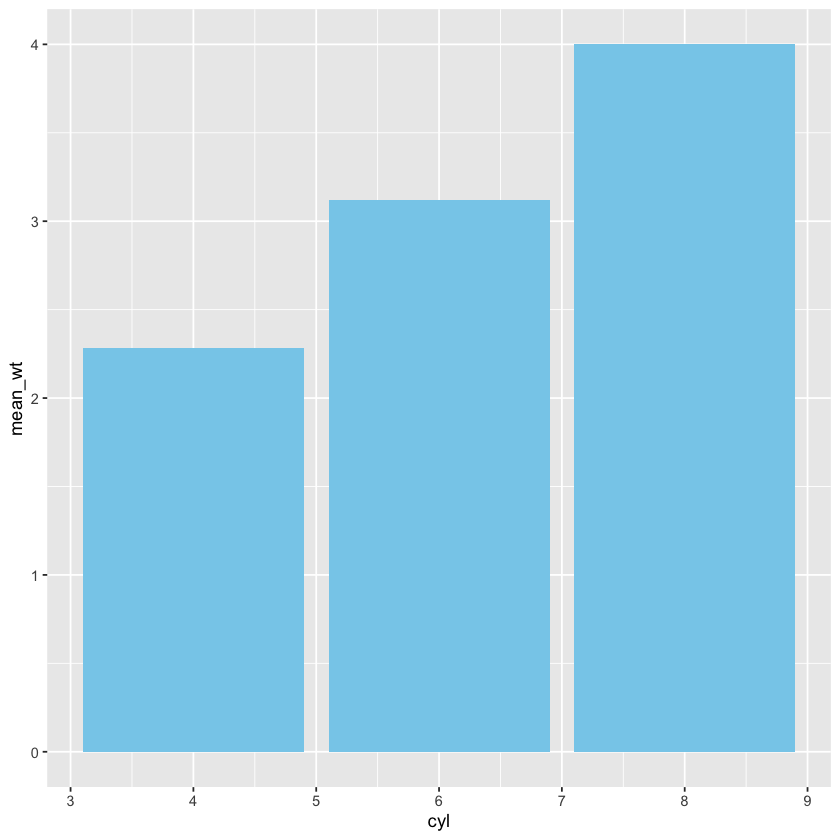

Warning message in geom_col(aes(width = prop), fill = "skyblue"):
“Ignoring unknown aesthetics: width”


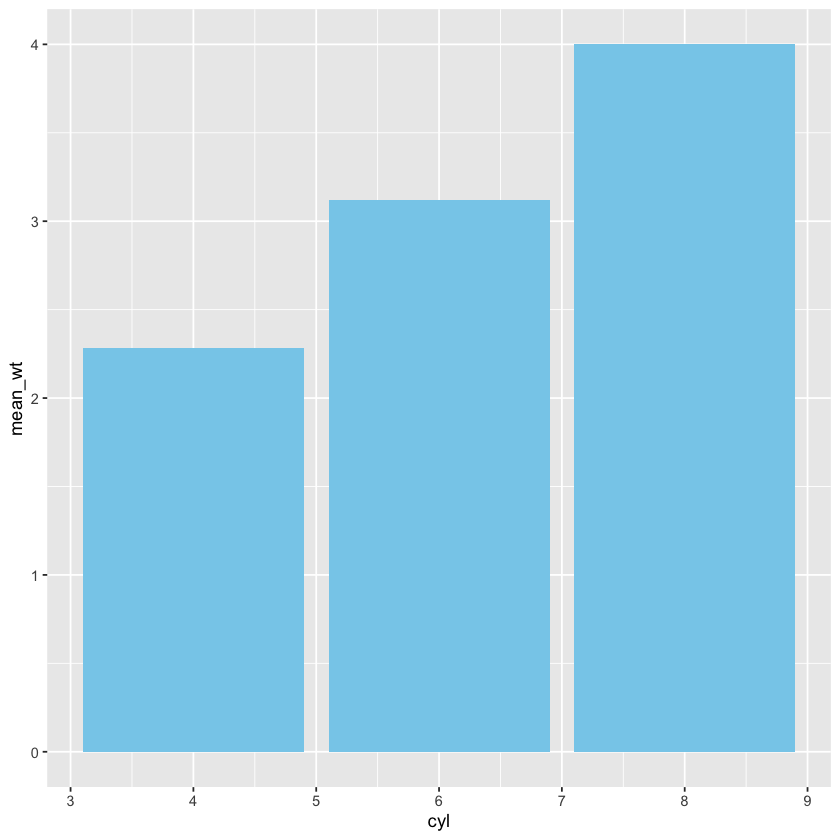

Warning message in geom_col(aes(width = prop), fill = "skyblue"):
“Ignoring unknown aesthetics: width”


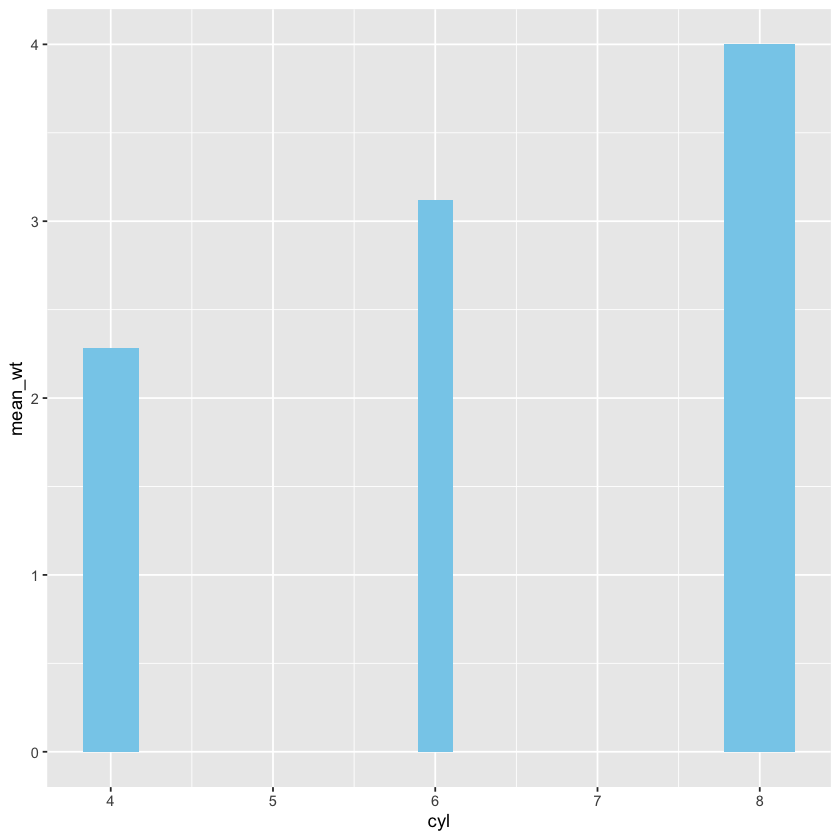

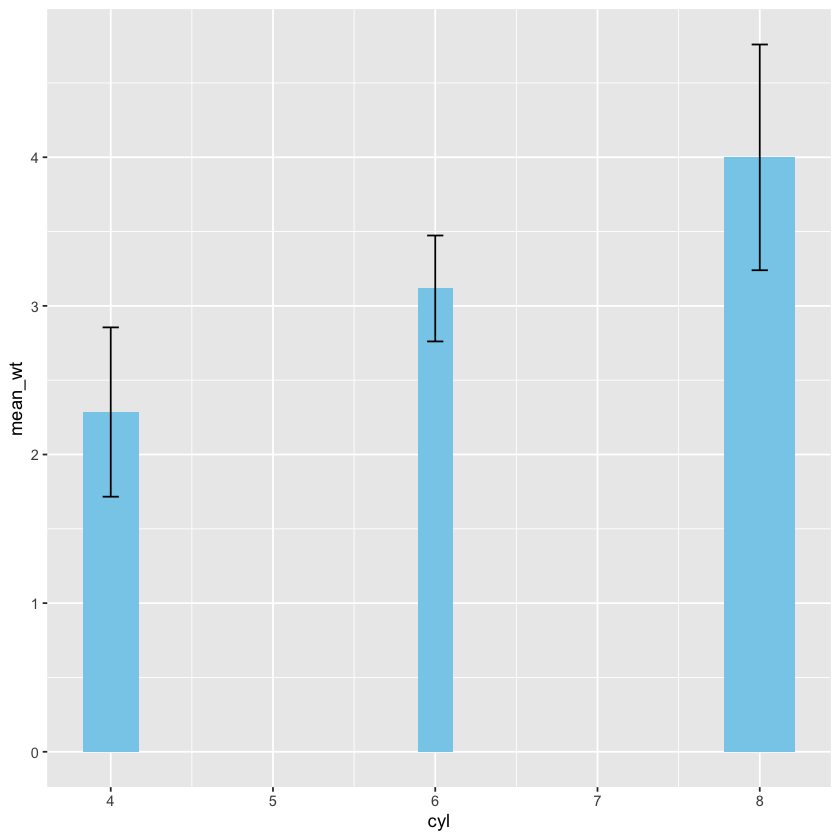

In [33]:
# edited/added
mtcars_by_cyl <- mtcars %>%
  group_by(cyl) %>% 
  summarize(mean_wt = mean(wt),
          sd_wt = sd(wt),
          n_wt = n()) %>% 
          mutate( prop = n_wt/sum(n_wt))

# Using mtcars_cyl, plot mean_wt vs. cyl
ggplot(mtcars_by_cyl, aes(x = cyl, y = mean_wt)) +
  # Add a bar layer with identity stat, filled skyblue
  geom_bar(stat = "identity", fill = "skyblue")

ggplot(mtcars_by_cyl, aes(x = cyl, y = mean_wt)) +
  # Swap geom_bar() for geom_col()
  geom_col(fill = "skyblue")

ggplot(mtcars_by_cyl, aes(x = cyl, y = mean_wt)) +
  # Set the width aesthetic to prop
  geom_col(aes(width = prop), fill = "skyblue")

ggplot(mtcars_by_cyl, aes(x = cyl, y = mean_wt)) +
  geom_col(aes(width = prop), fill = "skyblue") +
  # Add an errorbar layer
  geom_errorbar(
    # ... at mean weight plus or minus 1 std dev
    aes(ymin = mean_wt - sd_wt, ymax = mean_wt + sd_wt),
    # with width 0.1
    width = 0.1
  )


## Heatmaps use case scenario

### Heat maps

Since heat maps encode *color* on a continuous scale, they are difficult
to accurately *decode*, a topic we discussed in the first course. Hence,
heat maps are most useful if you have a small number of boxes and/or a
clear pattern that allows you to overcome decoding difficulties.

To produce them, map two categorical variables onto the `x` and `y`
aesthetics, along with a continuous variable onto `fill`. The
`geom_tile()` layer adds the boxes.

We'll produce the heat map we saw in the video (in the viewer) with the
built-in `barley` dataset. The `barley` dataset is in the `lattice`
package and has already been loaded for you. Use `str()` to explore the
structure.

-   Using `barley`, plot `variety` versus `year`, filled by `yield`.
-   Add a `geom_tile()` layer.
-   Add a `facet_wrap()` function with facets as `vars(site)` and `ncol = 1`. *Strip names will be above the panels, not to the side (as with `facet_grid()`).*
-   Give the heat maps a 2-color palette using `scale_fill_gradient()`. Set `low` and `high` to `"white"` and `"red"`, respectively.

A color palette of 9 reds, made with `brewer.pal()`, is provided as `red_brewer_palette`.

-   Update the fill scale to use an n-color gradient with `scale_fill_gradientn()` (note the `n`). Set the scale `colors` to the red brewer palette.


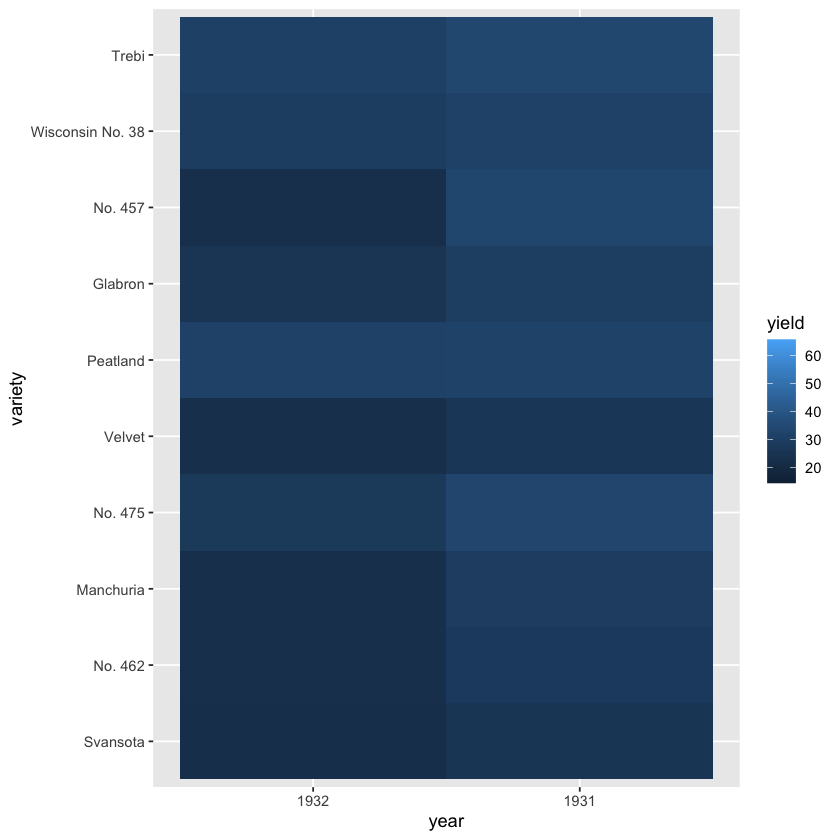

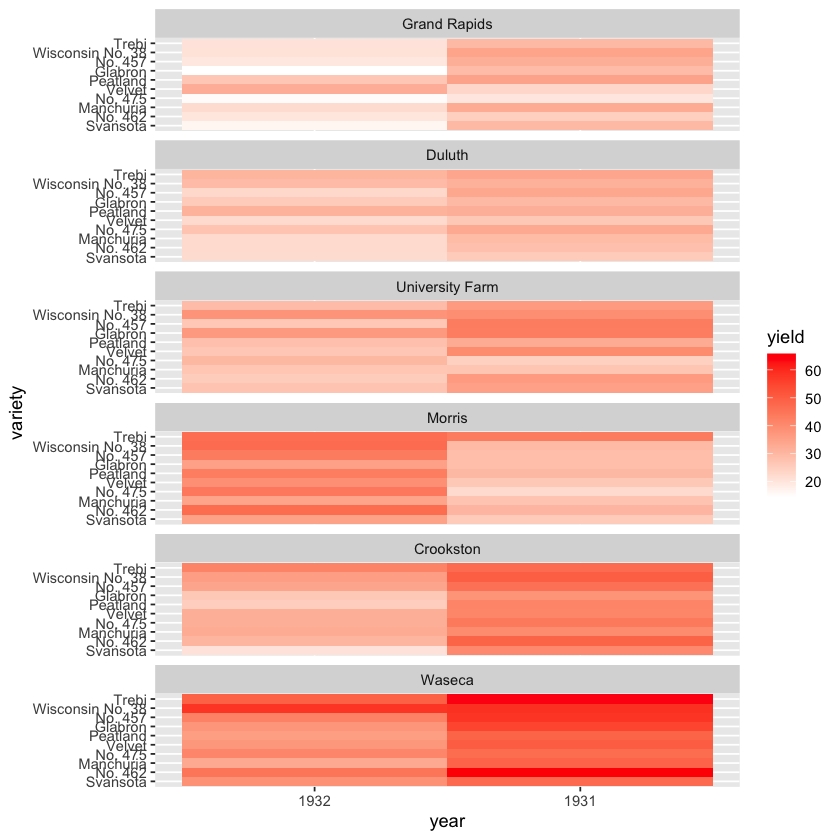

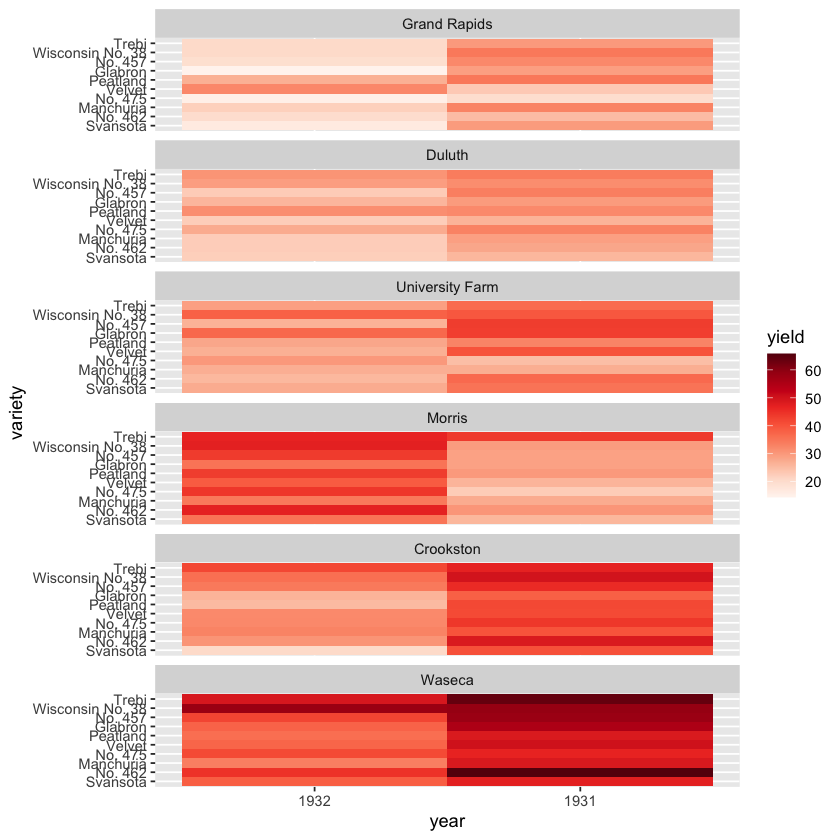

In [34]:
# edited/added
library(lattice)
library(RColorBrewer)

# Using barley, plot variety vs. year, filled by yield
ggplot(barley, aes(x = year, y = variety, fill = yield)) +
  # Add a tile geom
  geom_tile()

# Previously defined
ggplot(barley, aes(x = year, y = variety, fill = yield)) +
  geom_tile() +
  # Facet, wrapping by site, with 1 column
  facet_wrap(facets = vars(site), ncol = 1) +
  # Add a fill scale using an 2-color gradient
  scale_fill_gradient(low = "white", high = "red")

# A palette of 9 reds
red_brewer_palette <- brewer.pal(9, "Reds")

# Update the plot
ggplot(barley, aes(x = year, y = variety, fill = yield)) +
  geom_tile() +
  facet_wrap(facets = vars(site), ncol = 1) +
  # Update scale to use n-colors from red_brewer_palette
  scale_fill_gradientn(colors = red_brewer_palette)


### Useful heat maps

Heat maps are often a poor data viz solution because they typically don't convey useful information. We saw a nice alternative in the last exercise. But sometimes they are really good. Which of the following scenarios is not one of those times?

- [ ] When data has been sorted, e.g. according to a clustering algorithm, and we can see clear trends.
- [ ] When there are few groups with large differences.
- [x] When we have a large data set and we want to impress our colleagues with how complex our work is!
- [ ] When using explanatory plots to communicate a clear message to a non-scientific audience.

### Heat map alternatives

There are several alternatives to heat maps. The best choice really
depends on the data and the story you want to tell with this data. If
there is a time component, the most obvious choice is a line plot.

-   Using `barley`, plot `yield` versus `year`, colored and grouped by
    `variety`.
-   Add a line layer.
-   Facet, wrapping by `site`, with 1 row.

Display only means and ribbons for spread.

-   Map `site` onto `color`, `group` and `fill`.
-   Add a `stat_summary()` layer. set `fun = mean`, and `geom = "line"`.
-   In the second `stat_summary()`, set `geom = "ribbon"`, `color = NA` and `alpha = 0.1`.


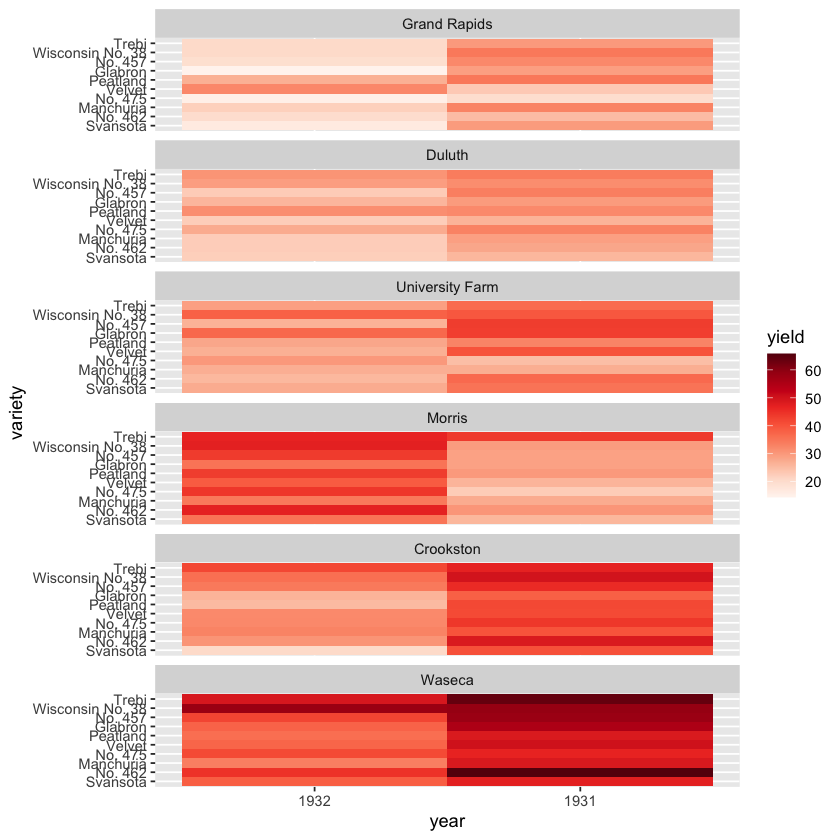

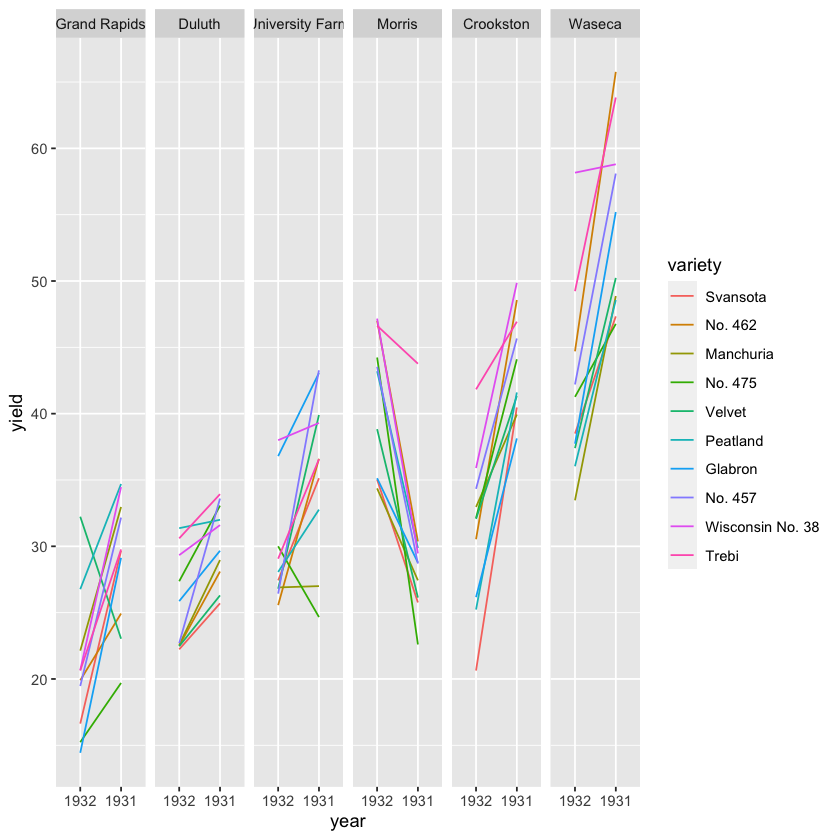

In [35]:
# The heat map we want to replace
# Don't remove, it's here to help you!
ggplot(barley, aes(x = year, y = variety, fill = yield)) +
  geom_tile() +
  facet_wrap( ~ site, ncol = 1) +
  scale_fill_gradientn(colors = brewer.pal(9, "Reds"))

# Using barley, plot yield vs. year, colored and grouped by variety
ggplot(barley, aes(x = year, y = yield, color = variety, group = variety)) +
  # Add a line layer
  geom_line() +
  # Facet, wrapping by site, with 1 row
  facet_wrap(~ site, nrow = 1)


## When good data makes bad plots

### Suppression of the origin

Suppression of the origin refers to *not* showing 0 on a continuous scale. When is it inappropriate to suppress the origin?

- [x] When the scale has a natural zero, like height or distance.
- [ ] When the scale doesn't have a natural zero, like temperature (in C or F).
- [ ] When there is a large amount of whitespace between the origin and the actual data.
- [ ] When it does not obscure the shape of the data.

### Color blindness

Red-Green color blindness is surprisingly prevalent, which means that
part of your audience will not be able to ready your plot if you are
relying on color aesthetics.

Why would it be appropriate to use red and green in a plot?

- [ ] When red and green are the actual colors in the sample (e.g. fluorescence in biological assays).
- [ ] When red means stop/bad and green means go/good.
- [ ] Because red and green are complimentary colors and look great together.
- [x] When red and green have different intensities (e.g. light red and dark green).

### Typical problems

When you first encounter a data visualization, either from yourself or a
colleague, you always want to critically ask if it's obscuring the data
in any way.

Let's take a look at the steps we could take to produce and improve the
plot in the view.

The data comes from an experiment where the effect of two different
types of vitamin C sources, orange juice or ascorbic acid, were tested
on the growth of the odontoblasts (cells responsible for tooth growth)
in 60 guinea pigs.

The data is stored in the `TG` data frame, which contains three
variables: `dose`, `len`, and `supp`.

The first plot contains purposely illegible labels. It's a common
problem that can occur when resizing plots. There is also too much
non-data ink.

-   Change `theme_gray(3)` to `theme_classic()`.

Our previous plot still has a major problem, `dose` is stored as a `factor` variable. That's why the spacing is off between the levels.

-   Use `as.character()` wrapped in `as.numeric()` to convert the factor variable to real (continuous) numbers.

Use the appropriate geometry for the data:

-   In the new `stat_summary()` function, set `fun` to to calculate the `mean` and the `geom` to a `"line"` to connect the points at their mean values.

Make sure the labels are informative:

-   Add the units `"(mg/day)"` and `"(mean, standard deviation)"` to the x and y labels, respectively.
-   Use the `"Set1"` palette.
-   Set the legend labels to `"Orange juice"` and `"Ascorbic acid"`.


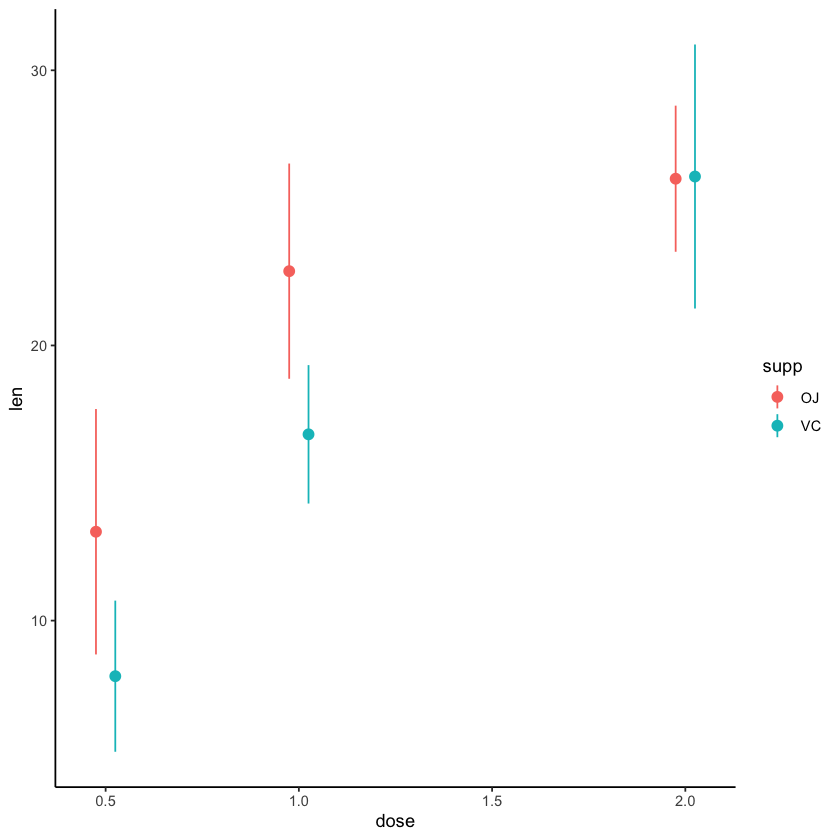

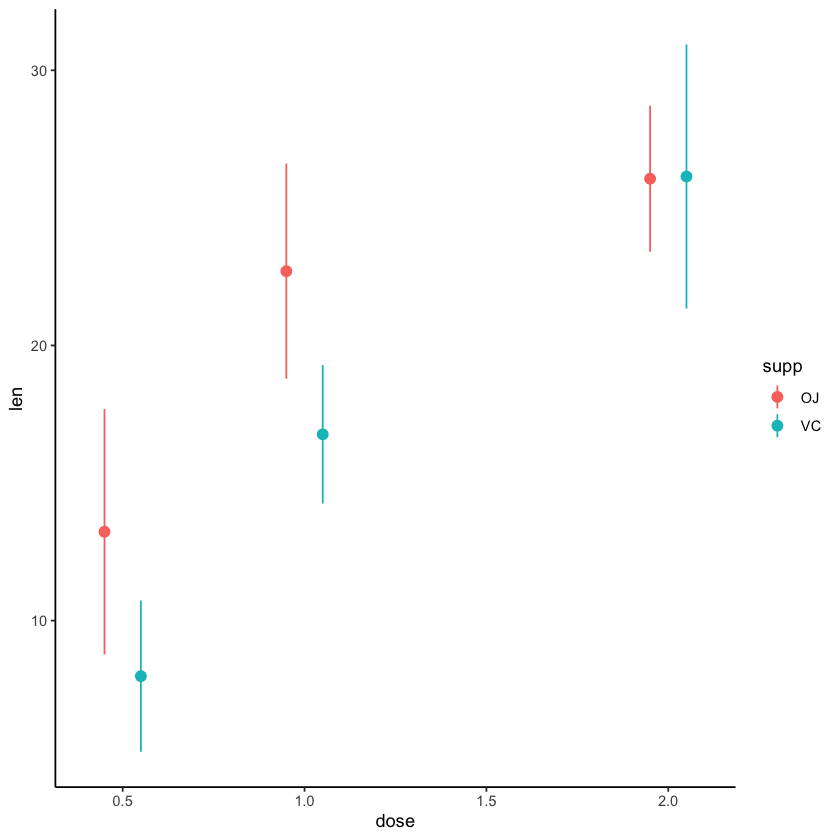

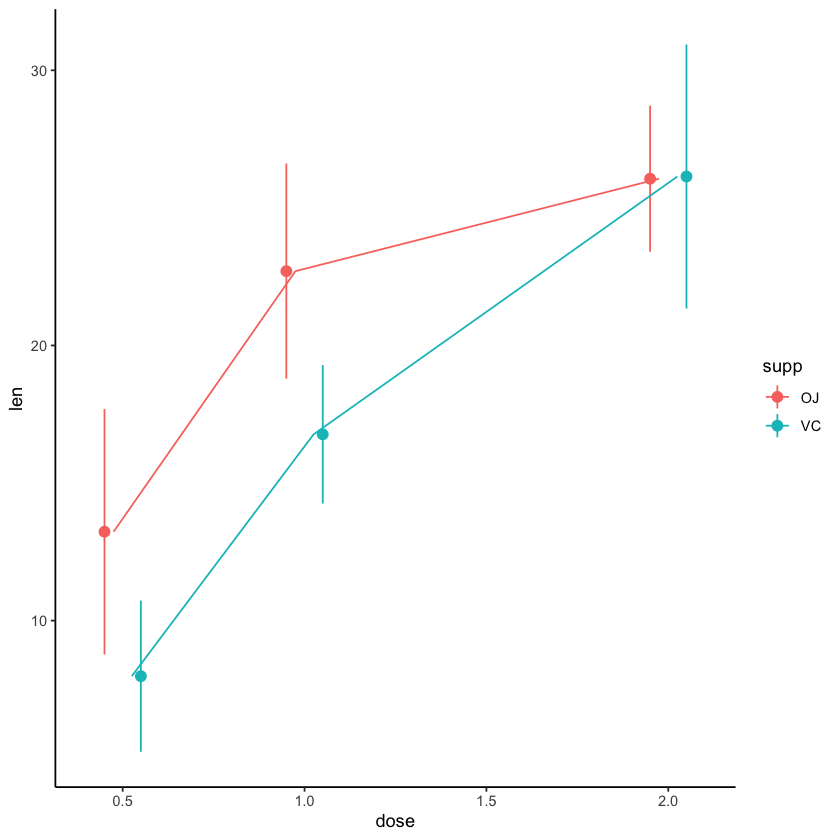

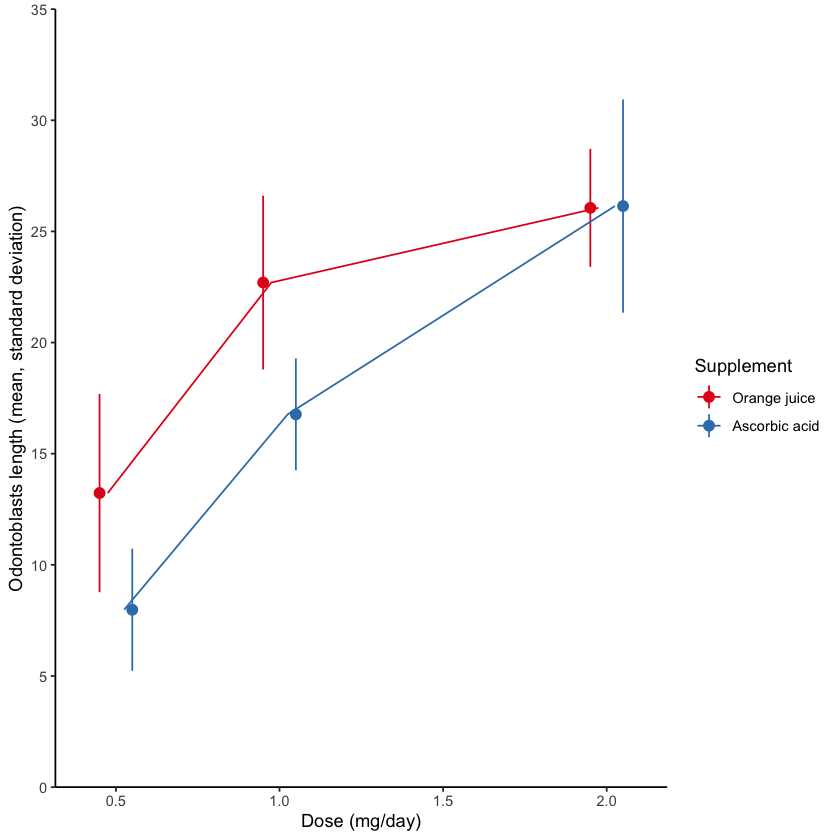

In [36]:
# edited/added
library(datasets)
TG <- ToothGrowth

# Initial plot
growth_by_dose <- ggplot(TG, aes(dose, len, color = supp)) +
  stat_summary(fun.data = mean_sdl,
               fun.args = list(mult = 1),
               position = position_dodge(0.1)) +
  theme_classic()

# View plot
growth_by_dose

# Change type
TG$dose <- as.numeric(as.character(TG$dose))

# Plot
growth_by_dose <- ggplot(TG, aes(dose, len, color = supp)) +
  stat_summary(fun.data = mean_sdl,
               fun.args = list(mult = 1),
               position = position_dodge(0.2)) +
  theme_classic()

# View plot
growth_by_dose

# Change type
TG$dose <- as.numeric(as.character(TG$dose))

# Plot
growth_by_dose <- ggplot(TG, aes(dose, len, color = supp)) +
  stat_summary(fun.data = mean_sdl,
               fun.args = list(mult = 1),
               position = position_dodge(0.2)) +
  # Use the right geometry
  stat_summary(fun = mean,
               geom = "line",
               position = position_dodge(0.1)) +
  theme_classic()

# View plot
growth_by_dose

# Change type
TG$dose <- as.numeric(as.character(TG$dose))

# Plot
growth_by_dose <- ggplot(TG, aes(dose, len, color = supp)) +
  stat_summary(fun.data = mean_sdl,
               fun.args = list(mult = 1),
               position = position_dodge(0.2)) +
  stat_summary(fun = mean,
               geom = "line",
               position = position_dodge(0.1)) +
  theme_classic() +
  # Adjust labels and colors:
  labs(x = "Dose (mg/day)", y = "Odontoblasts length (mean, standard deviation)", color = "Supplement") +
  scale_color_brewer(palette = "Set1", labels = c("Orange juice", "Ascorbic acid")) +
  scale_y_continuous(limits = c(0,35), breaks = seq(0, 35, 5), expand = c(0,0))

# View plot
growth_by_dose
